# Semantic Segmentation using UNet

# **Import Libraries**

In [3]:
from tensorflow.python import keras
print(keras.__version__)

2.6.0


In [4]:
import tensorflow as tf

In [5]:
print(tf.keras.__version__)

2.12.0


In [6]:
print(tf.__version__)

2.12.0


In [7]:
import os, glob
import cv2, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
#from patchify import patchify
from PIL import Image
#import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.utils import normalize
from tensorflow.keras.models import load_model
from tqdm import tqdm
from random import sample
import pickle
from tensorflow.keras.callbacks import Callback, ModelCheckpoint,  EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from sklearn.preprocessing import LabelEncoder
from keras.utils import normalize
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight

***Getting Colour Labels***

In [8]:
dfs = pd.read_excel("/kaggle/input/new-selected/Selected_category.xlsx","Sheet2")

In [9]:
dfs

,Idx,Ratio,Train,Val,Stuff,"Color_Code (R,G,B)",Color_Code(hex),Color,Name,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,2,0.1072,6046,612,1,"(180, 120, 120)",#B47878,NaN,building,NaN,NaN,NaN,NaN,3.0
1,3,0.0878,8265,796,1,"(6, 230, 230)",#06E6E6,NaN,sky,NaN,NaN,NaN,NaN,NaN
2,5,0.0480,6678,641,0,"(4, 200, 3)",#04C803,NaN,tree,NaN,NaN,NaN,NaN,NaN
3,6,0.0450,6604,643,1,"(120, 120, 80)",#787850,NaN,ceiling,NaN,NaN,NaN,NaN,NaN
4,7,0.0398,4023,408,1,"(140, 140, 140)",#8C8C8C,NaN,road;route,NaN,NaN,NaN,NaN,NaN
5,10,0.0183,2423,225,1,"(4, 250, 7)",#04FA07,NaN,grass,NaN,NaN,NaN,NaN,NaN
6,12,0.0166,3068,310,1,"(235, 255, 7)",#EBFF07,NaN,sidewalk,NaN,NaN,NaN,NaN,NaN
7,13,0.0160,5075,526,0,"(150, 5, 61)",#96053D,NaN,person,NaN,NaN,NaN,NaN,NaN
8,17,0.0109,1691,160,1,"(143, 255, 140)",#8FFF8C,NaN,mountain,NaN,NaN,NaN,NaN,NaN
9,21,0.0098,3164,306,0,"(0, 102, 200)",#0066C8,NaN,car,NaN,NaN,NaN,NaN,NaN


In [10]:
CLASS_COLORS = dict(zip(dfs['Idx'], dfs['Color_Code (R,G,B)']))
CLASS_LABELS = dict(zip(dfs['Idx'], dfs['Name']))
class_name_color =dict( zip(dfs['Name'],  dfs['Color_Code (R,G,B)']))

In [11]:
Label = list(dfs["Name"])
Name =[]

for i in Label:
    Name.append(i)

print(*Name,sep="\n")

building
sky
tree
ceiling
road;route
grass
sidewalk
person
mountain
car
water
house
sea


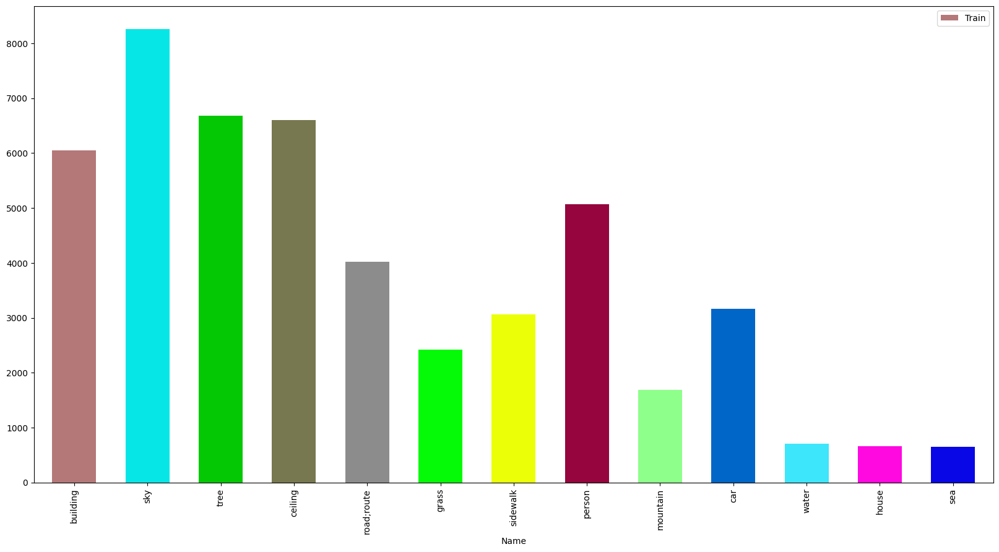

In [17]:
dfs.plot.bar(x="Name",y="Train",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

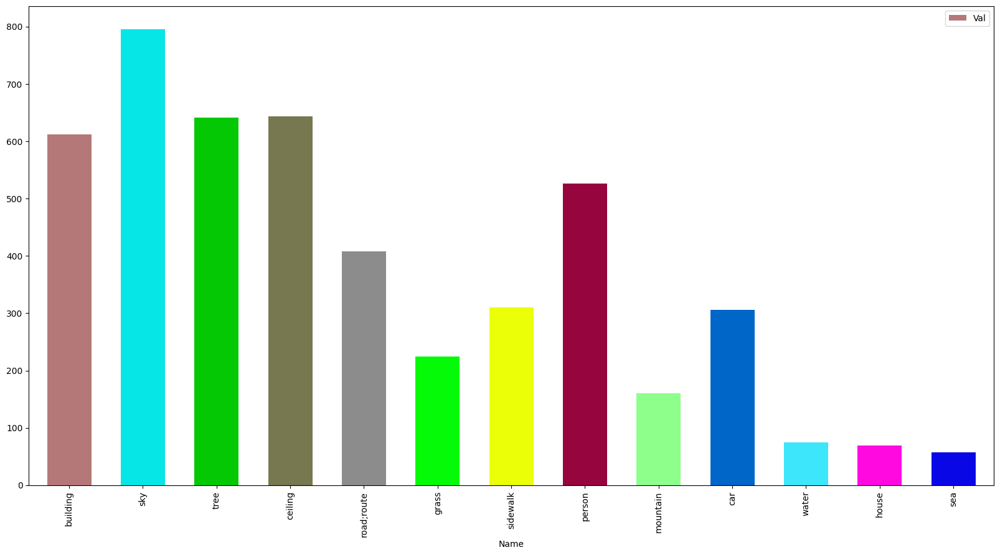

In [16]:
dfs.plot.bar(x="Name",y="Val",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

In [13]:
colors = dfs["Color_Code(hex)"]
colors

0     #B47878
1     #06E6E6
2     #04C803
3     #787850
4     #8C8C8C
5     #04FA07
6     #EBFF07
7     #96053D
8     #8FFF8C
9     #0066C8
10    #3DE6FA
11    #FF09E0
12    #0907E6
Name: Color_Code(hex), dtype: object

In [18]:
class_name_color

{'building': '(180, 120, 120)',
 'sky': '(6, 230, 230)',
 'tree': '(4, 200, 3)',
 'ceiling': '(120, 120, 80)',
 'road;route': '(140, 140, 140)',
 'grass': '(4, 250, 7)',
 'sidewalk': '(235, 255, 7)',
 'person': '(150, 5, 61)',
 'mountain': '(143, 255, 140)',
 'car': '(0, 102, 200)',
 'water': '(61, 230, 250)',
 'house': '(255, 9, 224)',
 'sea': '(9, 7, 230)'}

# **Selecting the Classes and class masks**

**Categories Selected are as follows :**

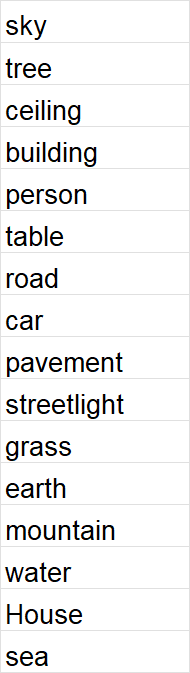

In [19]:
CLASS_LABELS

{2: 'building',
 3: 'sky',
 5: 'tree',
 6: 'ceiling',
 7: 'road;route',
 10: 'grass',
 12: 'sidewalk',
 13: 'person',
 17: 'mountain',
 21: 'car',
 22: 'water',
 26: 'house',
 27: 'sea'}

In [20]:
class_label = {
2: 'building',
3: 'sky',
5: 'tree',
6: 'ceiling',
7: 'road',
10: 'grass',
12: 'sidewalk',
13: 'person',
17: 'mountain',
21: 'car',
22: 'water',
26: 'house',
27: 'sea'}

class_colors = {
    2: (80, 120, 120), 
    3: (6, 230, 230),          
    5: (4, 200, 3),    
    6: (20, 120, 80),    
    7: (140, 140, 140), 
    10: (4, 250, 7), 
    12: (235, 255, 7),
    13: (150, 5, 61),              
    17: (143, 255, 140),    
    21: (0, 102, 200), 
    22: (61, 230, 250),
    26:(255, 9, 224),
    27:(9, 7, 230)              
 
}       

In [21]:
class_colors_keys = list(class_colors.keys())

In [22]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

sky
tree
ceiling
building
person
table
road
car
pavement
streetlight
grass
earth
mountain
water
House
sea

In [23]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

In [24]:
#Training and testing Paths
train_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training"
anno_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training"

In [171]:
image_dataset,mask_dataset,masked_image_dataset = [],[],[]

In [ ]:
image = cv2.flip(src, 0)

In [ ]:
def flip_images():
    np.rot90(img)

In [26]:
def load_images_bw_mask(image_path):
    image = cv2.imread(image_path,0)
    #print(image.shape)
    #image = cv2.cvtColor(image)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image

In [27]:
def load_images_bw(image_path):
    image = cv2.imread(image_path,1)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image


In [28]:
import os
import random

imgExtension = ["png", "jpeg", "jpg"] #Image Extensions to be chosen from
allImages = list()



def chooseRandomImage(directory=train_path):
    for img in os.listdir(directory): #Lists all files
        ext = img.split(".")[len(img.split(".")) - 1]
        if (ext in imgExtension):
            allImages.append(img)
    choice = random.randint(0, len(allImages) - 1)
    chosenImage = allImages[choice] #Do Whatever you want with the image file
    return chosenImage


In [29]:
# File path of the text file to read
file_path = '/kaggle/input/train-data-test-data/train_data.txt'
test_file_path = '/kaggle/input/train-data-test-data/test_data.txt'

# Initialize an empty list to store the file contents
training_images = []
testing_images = []

# Open the file in read mode
with open(file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        training_images.append(line.strip())
        
# Open the file in read mode
with open(test_file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        testing_images.append(line.strip())

# Print the list to verify the contents
print("Contents of the file saved to list:")


Contents of the file saved to list:


In [32]:
print(training_images[0])
print(testing_images[0])

ADE_train_00000567.jpg
ADE_train_00000567.png


In [160]:
for i in range(4000):
    train_image_name = chooseRandomImage()
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    image_name = train_image_name.replace('.jpg', '.png')
    
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    print(image_name)
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        mask_dataset.append(mask)
        masked_image_dataset.append(output)
    
    
    
    

KeyboardInterrupt: 

In [176]:
#Read first required images 
for i in range(2008,6009):
    # Load the segmentation mask
    image_name = 'ADE_train_0000'+str(i)+'.png'
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    #print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = 'ADE_train_0000'+str(i)+'.jpg'
    image = load_images_bw(os.path.join(train_path,train_image_name))
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        image_dataset.append(np.rot90(image[:,:,0]))
        image_dataset.append(np.rot90(np.rot90(image[:,:,0])))
        image_dataset.append(np.rot90(np.rot90(np.rot90(image[:,:,0]))))
        mask_dataset.append(mask)
        mask_dataset.append(np.rot90(mask))
        mask_dataset.append(np.rot90(np.rot90((mask))))
        mask_dataset.append(np.rot90(np.rot90(np.rot90(mask))))
        masked_image_dataset.append(output)
        masked_image_dataset.append(np.rot90(output))
        masked_image_dataset.append(np.rot90(np.rot90(output)))
        masked_image_dataset.append(np.rot90(np.rot90(np.rot90(output))))



67.364501953125
56.658935546875
53.7109375
49.98779296875
69.976806640625
57.537841796875
82.159423828125
52.886962890625
85.6201171875
58.8623046875
63.555908203125
44.793701171875
73.76708984375
36.065673828125
29.345703125
50.091552734375
26.7333984375
70.489501953125
10.25390625
81.695556640625
63.427734375
70.196533203125
22.4365234375
2.50244140625
2.984619140625
4.3701171875
6.231689453125
6.158447265625
12.103271484375
3.3935546875
11.492919921875
64.227294921875
7.745361328125
27.069091796875
62.078857421875
52.288818359375
85.040283203125
78.631591796875
40.4296875
63.897705078125
58.404541015625
73.175048828125
59.088134765625
51.55029296875
98.1689453125
53.25927734375
47.479248046875
49.853515625
56.9580078125
53.35693359375
27.44140625
88.079833984375
97.381591796875
71.990966796875
75.445556640625
98.492431640625
77.783203125
98.822021484375
94.2138671875
26.35498046875
67.755126953125
56.06689453125
36.65771484375
88.037109375
12.53662109375
19.561767578125
49.554443359

In [34]:
#Read first required images 
for i in range(len(training_images)):
    # Load the segmentation mask
    image_name = testing_images[i]
    print(image_name)
    print(os.path.join(anno_path,image_name))
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    print("before: ",np.unique(mask))
    
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
   
    print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = training_images[i]
    print(train_image_name)
    print(os.path.join(train_path,train_image_name))
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    
    #creating a numpy array of image size 
    output = np.zeros_like(image)
    
    # Apply colors to the mask based on class labels
    labels = list(class_colors.values())
    for class_label, color in class_colors.items():
        output[mask == class_label] = color
    
    #Adding Images, masks and Coloured Masks
    image_dataset.append(image[:,:,0])
    mask_dataset.append(mask)
    masked_image_dataset.append(output)
    


ADE_train_00000567.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000567.png
before:  [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 20 22 25 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 22 27]
ADE_train_00000567.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000567.jpg
ADE_train_00000568.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000568.png
before:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 26
 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]
ADE_train_00000568.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000568.jpg
ADE_train_00000569.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000569.png
before:  [ 0  2  3  8  9 10 11 13 14 15 16 17 18 19 20 21 22 24 25 26 27 28 30 31
 32 35]
After :  [ 0  2  3 10 13 17 21 22 26 27]
ADE_tr

In [154]:
#Masked_iamges
masked_image_dataset[0].shape

(128, 128, 3)

In [177]:
len(image_dataset),len(mask_dataset),len(masked_image_dataset)

(8804, 8804, 8804)

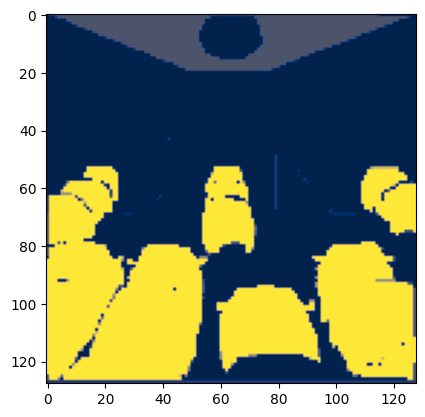

In [182]:
#Mask Image
plt.imshow(mask_dataset[8],cmap='cividis')

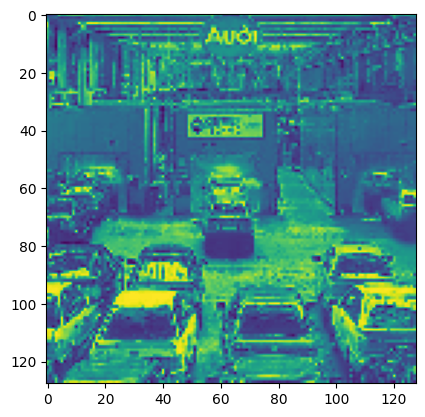

In [184]:
#Image Considering last channel
plt.imshow(image_dataset[8])

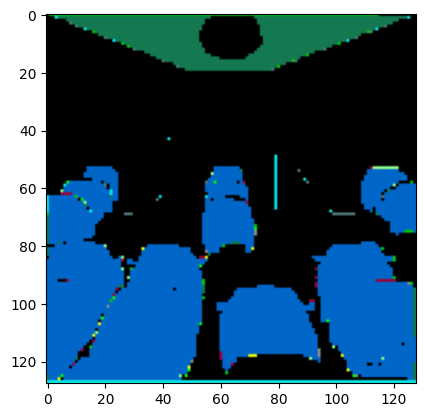

In [185]:
#Masked Image with colours
plt.imshow(masked_image_dataset[8])

In [186]:
np.unique(mask_dataset[0])

array([ 0,  2,  3,  5,  6,  7, 10, 12, 13, 17, 21], dtype=uint8)

In [187]:
masked_image_dataset[0].shape

(128, 128, 3)

In [188]:
n_classes = len(np.unique(mask_dataset))

In [189]:
n_classes

14

1519
[ 0  2  3  5  6  7 10 12 13 17]


Text(0.5, 1.0, 'Mask')

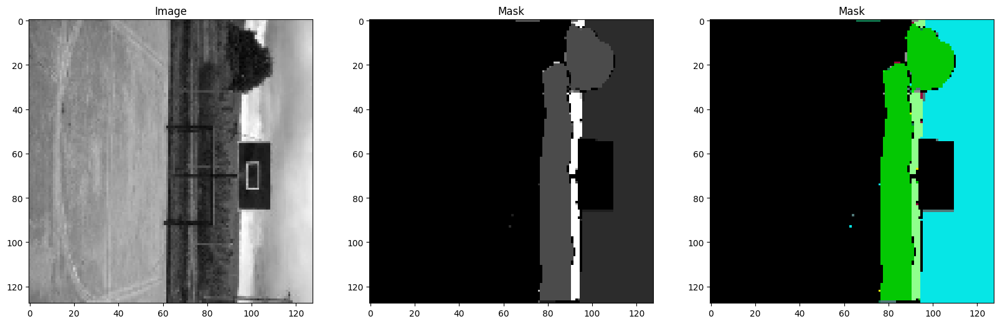

In [191]:
# Sanity check...
import random
image_number = random.randint(0, len(image_dataset))
print(image_number)
print(np.unique(mask_dataset[image_number]))
#image_number=45
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(image_dataset[image_number],cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(mask_dataset[image_number],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[image_number])
plt.title("Mask")

In [192]:
#Convert list to array for machine learning processing
train_images = np.array(image_dataset)
train_images = np.expand_dims(train_images, axis=3)

In [193]:
train_images.shape

(8804, 128, 128, 1)

In [194]:
#Convert list to array for machine learning processing
train_masks = np.array(mask_dataset)
train_masks.shape

(8804, 128, 128)

In [195]:
#Encode labels... but multi dim array so need to flatten, encode and reshape
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
print(np.unique(train_masks_reshaped))
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
print(np.unique(train_masks_reshaped_encoded))
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)

[ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [196]:
#Normalising Images
train_images = normalize(train_images,axis=1)#
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [197]:
train_masks_input.shape, train_images.shape


((8804, 128, 128, 1), (8804, 128, 128, 1))

In [198]:
#Train - Test Split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.1, random_state = 42)

In [199]:
X1.shape, X_test.shape, y1.shape, y_test.shape

((7923, 128, 128, 1),
 (881, 128, 128, 1),
 (7923, 128, 128, 1),
 (881, 128, 128, 1))

In [200]:
np.unique(train_masks_input)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [201]:
#Number of Unique classes in training masks
n_classes=len(np.unique(train_masks_input))
print(n_classes)

14


In [202]:
#CONVERTING DATA TO CATEGORICAL classes
train_masks_cat = to_categorical(y1, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [203]:
###############################################################
#computing class weights
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_masks_reshaped_encoded), y= train_masks_reshaped_encoded)
print("Class weights are...:", class_weights)

Class weights are...: [0.13983845 0.54691671 0.70558813 1.71771913 1.05184707 4.35131294
 3.07461153 8.3589124  2.25850192 4.79944336 6.20849458 7.44211787
 7.33965019 3.19675194]


<BarContainer object of 14 artists>

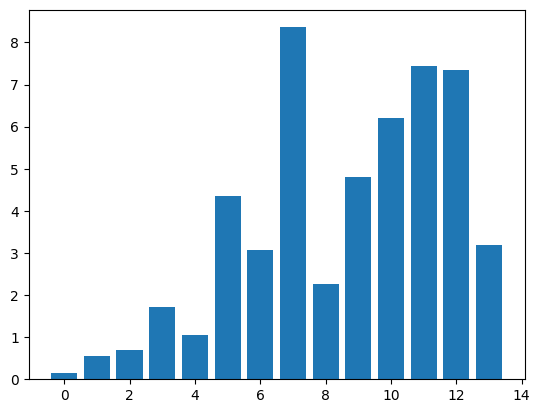

In [204]:
plt.bar([i for i in range(n_classes)], class_weights)

In [205]:
class_weights

array([0.13983845, 0.54691671, 0.70558813, 1.71771913, 1.05184707,
       4.35131294, 3.07461153, 8.3589124 , 2.25850192, 4.79944336,
       6.20849458, 7.44211787, 7.33965019, 3.19675194])

In [206]:
#Selecting image height, width and channel for neural network
IMG_HEIGHT = X1.shape[1]
IMG_WIDTH  = X1.shape[2]
IMG_CHANNELS = X1.shape[3]
print(IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)

128 128 1


In [207]:
"""
Standard Unet

# https://youtu.be/XyX5HNuv-xE
# https://youtu.be/q-p8v1Bxvac
"""


from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda


################################################################
def multi_unet_model(n_classes=n_classes, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [208]:
from tensorflow.keras import backend as K
# Define custom mean IoU metric function
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)  # Convert predictions to binary values (0 or 1)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])  # Calculate intersection
    union = K.sum(K.clip(y_true + y_pred, 0, 1), axis=[1, 2, 3])  # Calculate union
    iou = K.mean((intersection + K.epsilon()) / (union + K.epsilon()))  # Calculate IoU
    return iou

# Define custom recall metric function
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# Define custom F1 Score metric function
def f1_score(y_true, y_pred):
    precision = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_pred, 0, 1))) + K.epsilon())
    recall = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_true, 0, 1))) + K.epsilon())
    f1_score = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1_score

In [209]:
#Model Compilation

def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy',mean_iou,recall,f1_score])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 128, 128, 16  160         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_9 (Dropout)            (None, 128, 128, 16  0           ['conv2d_19[0][0]']              
                                )                                                           

In [ ]:
type(X1)

In [210]:
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store precision, recall, F1 score, and IoU
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store metrics for training and validation sets
class MetricsCallback(Callback):
    def __init__(self, X_train, y_train, X_val, y_val):
        super(MetricsCallback, self).__init__()
        self.val_num = int(0.1*len(X_val))
        print(self.val_num)
        self.X_train = X_train[:self.val_num]
        self.y_train = y_train[:self.val_num]
        self.X_val = X_val[:self.val_num]
        self.y_val = y_val[:self.val_num]
        self.metrics_history = {'train': [], 'val': []}

    def on_epoch_end(self, epoch, logs=None):
        # Compute metrics for training set
        y_train_pred = np.argmax(self.model.predict(self.X_train), axis=-1)
        train_precision = precision_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_recall = recall_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_f1 = f1_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        
        confusion_matrix_train = tf.math.confusion_matrix(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel())
        intersection_train = np.diag(confusion_matrix_train)
        union_train = np.sum(confusion_matrix_train, axis=0) + np.sum(confusion_matrix_train, axis=1) - intersection_train
        train_iou = np.mean((intersection_train + 1e-10) / (union_train + 1e-10))

        # Compute metrics for validation set
        y_val_pred = np.argmax(self.model.predict(self.X_val), axis=-1)
        val_precision = precision_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_recall = recall_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_f1 = f1_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        
        confusion_matrix_val = tf.math.confusion_matrix(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel())
        intersection_val = np.diag(confusion_matrix_val)
        union_val = np.sum(confusion_matrix_val, axis=0) + np.sum(confusion_matrix_val, axis=1) - intersection_val
        val_iou = np.mean((intersection_val + 1e-10) / (union_val + 1e-10))

        self.metrics_history['train'].append({'train_precision': train_precision,
                                              'train_recall': train_recall,
                                              'train_f1': train_f1,
                                              'train_iou': train_iou})
        
        self.metrics_history['val'].append({'val_precision': val_precision,
                                            'val_recall': val_recall,
                                            'val_f1': val_f1,
                                            'val_iou': val_iou})


In [72]:
history.history.keys()

NameError: name 'history' is not defined

In [212]:
import datetime
#CHECKPOINT path for model training 
#Model will be saved if validation accuracy improves 
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Custom callback to compute metrics and save history

metrics_callback = MetricsCallback(X1, y_train_cat, X_test, y_test_cat)

reduce_lr_cback = ReduceLROnPlateau(
    monitor='val_loss', factor=0.2,
    patience=5, verbose=1,
    min_lr=0.05 * 0.0001) 

filepath="/kaggle/working/weights-14-improvement-augmented-images-{epoch:03d}-{val_accuracy:.2f}-{accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, savemode='max')
callbacks_list = [checkpoint,metrics_callback,reduce_lr_cback]


88


In [74]:
#creating folder to save weights
os.mkdir('LOGS')

In [46]:
#Load weights 
model.load_weights("/kaggle/working/weights-6-improvement-fixed-images-005-0.73.hdf5")

In [213]:
#Training model
history = model.fit(X1, y_train_cat,
                    batch_size = 16,
                    verbose=1,
                    epochs=200,
                    validation_data=(X_test, y_test_cat),
                    #class_weight=class_weights,
                    callbacks=callbacks_list,
                    shuffle=True)

Epoch 1/200


2024-04-24 15:55:48.848600: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout_9/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


496/496 [==============================] - ETA: 0s - loss: 1.8200 - accuracy: 0.5053 - mean_iou: 0.1986 - recall: 0.2291 - f1_score: 0.2947
Epoch 1: val_accuracy improved from -inf to 0.51605, saving model to /kaggle/working/weights-14-improvement-augmented-images-001-0.52-0.505.hdf5
3/3 [==============================] - 1s 371ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 41s 68ms/step - loss: 1.8200 - accuracy: 0.5053 - mean_iou: 0.1986 - recall: 0.2291 - f1_score: 0.2947 - val_loss: 1.6997 - val_accuracy: 0.5160 - val_mean_iou: 0.3851 - val_recall: 0.4807 - val_f1_score: 0.4963 - lr: 0.0010
Epoch 2/200
495/496 [============================>.] - ETA: 0s - loss: 1.6518 - accuracy: 0.5130 - mean_iou: 0.2556 - recall: 0.2988 - f1_score: 0.3654
Epoch 2: val_accuracy improved from 0.51605 to 0.52101, saving model to /kaggle/working/weights-14-improvement-augmented-images-002-0.52-0.513.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.6517 - accuracy: 0.5130 - mean_iou: 0.2558 - recall: 0.2991 - f1_score: 0.3656 - val_loss: 1.5853 - val_accuracy: 0.5210 - val_mean_iou: 0.3409 - val_recall: 0.4056 - val_f1_score: 0.4624 - lr: 0.0010
Epoch 3/200
495/496 [============================>.] - ETA: 0s - loss: 1.5998 - accuracy: 0.5225 - mean_iou: 0.2918 - recall: 0.3425 - f1_score: 0.4148
Epoch 3: val_accuracy improved from 0.52101 to 0.53328, saving model to /kaggle/working/weights-14-improvement-augmented-images-003-0.53-0.523.hdf5
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.5998 - accuracy: 0.5225 - mean_iou: 0.2919 - recall: 0.3426 - f1_score: 0.4149 - val_loss: 1.5456 - val_accuracy: 0.5333 - val_mean_iou: 0.3800 - val_recall: 0.4673 - val_f1_score: 0.5025 - lr: 0.0010
Epoch 4/200
495/496 [============================>.] - ETA: 0s - loss: 1.5590 - accuracy: 0.5289 - mean_iou: 0.3035 - recall: 0.3562 - f1_score: 0.4274
Epoch 4: val_accuracy did not improve from 0.53328
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 1.5591 - accuracy: 0.5289 - mean_iou: 0.3032 - recall: 0.3559 - f1_score: 0.4271 - val_loss: 1.5137 - val_accuracy: 0.5294 - val_mean_iou: 0.2577 - val_recall: 0.2915 - val_f1_score: 0.3857 - lr: 0.0010
Epoch 5/200
495/496 [============================>.] - ETA: 0s - loss: 1.5151 - accuracy: 0.5356 - mean_iou: 0.3195 - recall: 0.3770 - f1_score: 0.4466
Epoch 5: val_accuracy improved from 0.53328 to 0.54168, saving model to /kaggle/working/weights-14-improvement-augmented-images-005-0.54-0.536.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.5150 - accuracy: 0.5357 - mean_iou: 0.3197 - recall: 0.3773 - f1_score: 0.4469 - val_loss: 1.4766 - val_accuracy: 0.5417 - val_mean_iou: 0.3621 - val_recall: 0.4317 - val_f1_score: 0.4905 - lr: 0.0010
Epoch 6/200
496/496 [==============================] - ETA: 0s - loss: 1.4634 - accuracy: 0.5506 - mean_iou: 0.3502 - recall: 0.4176 - f1_score: 0.4864
Epoch 6: val_accuracy improved from 0.54168 to 0.56879, saving model to /kaggle/working/weights-14-improvement-augmented-images-006-0.57-0.551.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.4634 - accuracy: 0.5506 - mean_iou: 0.3502 - recall: 0.4176 - f1_score: 0.4864 - val_loss: 1.4256 - val_accuracy: 0.5688 - val_mean_iou: 0.3314 - val_recall: 0.3903 - val_f1_score: 0.4793 - lr: 0.0010
Epoch 7/200
496/496 [==============================] - ETA: 0s - loss: 1.4179 - accuracy: 0.5637 - mean_iou: 0.3662 - recall: 0.4368 - f1_score: 0.5075
Epoch 7: val_accuracy improved from 0.56879 to 0.58122, saving model to /kaggle/working/weights-14-improvement-augmented-images-007-0.58-0.564.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.4179 - accuracy: 0.5637 - mean_iou: 0.3662 - recall: 0.4368 - f1_score: 0.5075 - val_loss: 1.3791 - val_accuracy: 0.5812 - val_mean_iou: 0.3861 - val_recall: 0.4601 - val_f1_score: 0.5300 - lr: 0.0010
Epoch 8/200
495/496 [============================>.] - ETA: 0s - loss: 1.3781 - accuracy: 0.5755 - mean_iou: 0.3796 - recall: 0.4493 - f1_score: 0.5229
Epoch 8: val_accuracy improved from 0.58122 to 0.59544, saving model to /kaggle/working/weights-14-improvement-augmented-images-008-0.60-0.576.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.3779 - accuracy: 0.5756 - mean_iou: 0.3800 - recall: 0.4497 - f1_score: 0.5233 - val_loss: 1.3194 - val_accuracy: 0.5954 - val_mean_iou: 0.4226 - val_recall: 0.5068 - val_f1_score: 0.5659 - lr: 0.0010
Epoch 9/200
495/496 [============================>.] - ETA: 0s - loss: 1.3336 - accuracy: 0.5888 - mean_iou: 0.3967 - recall: 0.4676 - f1_score: 0.5421
Epoch 9: val_accuracy did not improve from 0.59544
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 1.3336 - accuracy: 0.5887 - mean_iou: 0.3966 - recall: 0.4675 - f1_score: 0.5420 - val_loss: 1.3409 - val_accuracy: 0.5624 - val_mean_iou: 0.3660 - val_recall: 0.4314 - val_f1_score: 0.5101 - lr: 0.0010
Epoch 10/200
495/496 [============================>.] - ETA: 0s - loss: 1.2986 - accuracy: 0.6004 - mean_iou: 0.4096 - recall: 0.4794 - f1_score: 0.5564
Epoch 10: val_accuracy improved from 0.59544 to 0.61268, saving model to /kaggle/working/weights-14-improvement-augmented-images-010-0.61-0.600.hdf5
3/3 [==============================] - 0s 11ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 59ms/step - loss: 1.2985 - accuracy: 0.6004 - mean_iou: 0.4095 - recall: 0.4794 - f1_score: 0.5564 - val_loss: 1.2702 - val_accuracy: 0.6127 - val_mean_iou: 0.3994 - val_recall: 0.4578 - val_f1_score: 0.5475 - lr: 0.0010
Epoch 11/200
496/496 [==============================] - ETA: 0s - loss: 1.2556 - accuracy: 0.6107 - mean_iou: 0.4216 - recall: 0.4927 - f1_score: 0.5703
Epoch 11: val_accuracy did not improve from 0.61268
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.2556 - accuracy: 0.6107 - mean_iou: 0.4216 - recall: 0.4927 - f1_score: 0.5703 - val_loss: 1.2490 - val_accuracy: 0.6111 - val_mean_iou: 0.3834 - val_recall: 0.4401 - val_f1_score: 0.5400 - lr: 0.0010
Epoch 12/200
496/496 [==============================] - ETA: 0s - loss: 1.2141 - accuracy: 0.6249 - mean_iou: 0.4403 - recall: 0.5134 - f1_score: 0.5893
Epoch 12: val_accuracy improved from 0.61268 to 0.62617, saving model to /kaggle/working/weights-14-improvement-augmented-images-012-0.63-0.625.hdf5
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 59ms/step - loss: 1.2141 - accuracy: 0.6249 - mean_iou: 0.4403 - recall: 0.5134 - f1_score: 0.5893 - val_loss: 1.2036 - val_accuracy: 0.6262 - val_mean_iou: 0.4321 - val_recall: 0.5016 - val_f1_score: 0.5815 - lr: 0.0010
Epoch 13/200
496/496 [==============================] - ETA: 0s - loss: 1.1883 - accuracy: 0.6310 - mean_iou: 0.4461 - recall: 0.5175 - f1_score: 0.5957
Epoch 13: val_accuracy did not improve from 0.62617
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.1883 - accuracy: 0.6310 - mean_iou: 0.4461 - recall: 0.5175 - f1_score: 0.5957 - val_loss: 1.2241 - val_accuracy: 0.6233 - val_mean_iou: 0.4040 - val_recall: 0.4618 - val_f1_score: 0.5590 - lr: 0.0010
Epoch 14/200
495/496 [============================>.] - ETA: 0s - loss: 1.1659 - accuracy: 0.6385 - mean_iou: 0.4556 - recall: 0.5277 - f1_score: 0.6057
Epoch 14: val_accuracy did not improve from 0.62617
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.1658 - accuracy: 0.6385 - mean_iou: 0.4555 - recall: 0.5276 - f1_score: 0.6057 - val_loss: 1.1863 - val_accuracy: 0.6259 - val_mean_iou: 0.4359 - val_recall: 0.5101 - val_f1_score: 0.5846 - lr: 0.0010
Epoch 15/200
495/496 [============================>.] - ETA: 0s - loss: 1.1464 - accuracy: 0.6436 - mean_iou: 0.4622 - recall: 0.5349 - f1_score: 0.6117
Epoch 15: val_accuracy improved from 0.62617 to 0.63475, saving model to /kaggle/working/weights-14-improvement-augmented-images-015-0.63-0.644.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.1465 - accuracy: 0.6436 - mean_iou: 0.4621 - recall: 0.5348 - f1_score: 0.6117 - val_loss: 1.1736 - val_accuracy: 0.6347 - val_mean_iou: 0.4504 - val_recall: 0.5257 - val_f1_score: 0.6006 - lr: 0.0010
Epoch 16/200
495/496 [============================>.] - ETA: 0s - loss: 1.1075 - accuracy: 0.6554 - mean_iou: 0.4767 - recall: 0.5502 - f1_score: 0.6267
Epoch 16: val_accuracy improved from 0.63475 to 0.64216, saving model to /kaggle/working/weights-14-improvement-augmented-images-016-0.64-0.655.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.1074 - accuracy: 0.6554 - mean_iou: 0.4768 - recall: 0.5504 - f1_score: 0.6269 - val_loss: 1.1437 - val_accuracy: 0.6422 - val_mean_iou: 0.4546 - val_recall: 0.5269 - val_f1_score: 0.6043 - lr: 0.0010
Epoch 17/200
495/496 [============================>.] - ETA: 0s - loss: 1.1025 - accuracy: 0.6560 - mean_iou: 0.4779 - recall: 0.5518 - f1_score: 0.6273
Epoch 17: val_accuracy did not improve from 0.64216
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.1024 - accuracy: 0.6560 - mean_iou: 0.4781 - recall: 0.5521 - f1_score: 0.6275 - val_loss: 1.1909 - val_accuracy: 0.6390 - val_mean_iou: 0.4847 - val_recall: 0.5768 - val_f1_score: 0.6246 - lr: 0.0010
Epoch 18/200
495/496 [============================>.] - ETA: 0s - loss: 1.0806 - accuracy: 0.6619 - mean_iou: 0.4864 - recall: 0.5607 - f1_score: 0.6355
Epoch 18: val_accuracy improved from 0.64216 to 0.64337, saving model to /kaggle/working/weights-14-improvement-augmented-images-018-0.64-0.662.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 59ms/step - loss: 1.0806 - accuracy: 0.6619 - mean_iou: 0.4863 - recall: 0.5605 - f1_score: 0.6355 - val_loss: 1.1348 - val_accuracy: 0.6434 - val_mean_iou: 0.4433 - val_recall: 0.5086 - val_f1_score: 0.5976 - lr: 0.0010
Epoch 19/200
496/496 [==============================] - ETA: 0s - loss: 1.0656 - accuracy: 0.6654 - mean_iou: 0.4903 - recall: 0.5647 - f1_score: 0.6390
Epoch 19: val_accuracy did not improve from 0.64337
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.0656 - accuracy: 0.6654 - mean_iou: 0.4903 - recall: 0.5647 - f1_score: 0.6390 - val_loss: 1.1750 - val_accuracy: 0.6362 - val_mean_iou: 0.4739 - val_recall: 0.5599 - val_f1_score: 0.6177 - lr: 0.0010
Epoch 20/200
496/496 [==============================] - ETA: 0s - loss: 1.0520 - accuracy: 0.6705 - mean_iou: 0.4971 - recall: 0.5723 - f1_score: 0.6458
Epoch 20: val_accuracy improved from 0.64337 to 0.65605, saving model to /kaggle/working/weights-14-improvement-augmented-images-020-0.66-0.670.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.0520 - accuracy: 0.6705 - mean_iou: 0.4971 - recall: 0.5723 - f1_score: 0.6458 - val_loss: 1.1102 - val_accuracy: 0.6560 - val_mean_iou: 0.4791 - val_recall: 0.5569 - val_f1_score: 0.6254 - lr: 0.0010
Epoch 21/200
495/496 [============================>.] - ETA: 0s - loss: 1.0323 - accuracy: 0.6772 - mean_iou: 0.5070 - recall: 0.5834 - f1_score: 0.6546
Epoch 21: val_accuracy did not improve from 0.65605
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.0321 - accuracy: 0.6772 - mean_iou: 0.5075 - recall: 0.5839 - f1_score: 0.6550 - val_loss: 1.1697 - val_accuracy: 0.6313 - val_mean_iou: 0.4401 - val_recall: 0.5114 - val_f1_score: 0.5901 - lr: 0.0010
Epoch 22/200
495/496 [============================>.] - ETA: 0s - loss: 1.0138 - accuracy: 0.6835 - mean_iou: 0.5155 - recall: 0.5927 - f1_score: 0.6624
Epoch 22: val_accuracy did not improve from 0.65605
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.0138 - accuracy: 0.6835 - mean_iou: 0.5156 - recall: 0.5928 - f1_score: 0.6625 - val_loss: 1.1721 - val_accuracy: 0.6418 - val_mean_iou: 0.4672 - val_recall: 0.5486 - val_f1_score: 0.6135 - lr: 0.0010
Epoch 23/200
495/496 [============================>.] - ETA: 0s - loss: 1.0069 - accuracy: 0.6841 - mean_iou: 0.5147 - recall: 0.5913 - f1_score: 0.6620
Epoch 23: val_accuracy did not improve from 0.65605
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 1.0070 - accuracy: 0.6841 - mean_iou: 0.5146 - recall: 0.5912 - f1_score: 0.6620 - val_loss: 1.1792 - val_accuracy: 0.6428 - val_mean_iou: 0.4812 - val_recall: 0.5688 - val_f1_score: 0.6230 - lr: 0.0010
Epoch 24/200
495/496 [============================>.] - ETA: 0s - loss: 0.9915 - accuracy: 0.6896 - mean_iou: 0.5237 - recall: 0.6018 - f1_score: 0.6698
Epoch 24: val_accuracy did not improve from 0.65605
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.9916 - accuracy: 0.6896 - mean_iou: 0.5235 - recall: 0.6017 - f1_score: 0.6696 - val_loss: 1.1196 - val_accuracy: 0.6490 - val_mean_iou: 0.4695 - val_recall: 0.5422 - val_f1_score: 0.6170 - lr: 0.0010
Epoch 25/200
496/496 [==============================] - ETA: 0s - loss: 0.9789 - accuracy: 0.6925 - mean_iou: 0.5280 - recall: 0.6054 - f1_score: 0.6737
Epoch 25: val_accuracy did not improve from 0.65605
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 25: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
496/496 [==============================] - 29s 58ms/step - loss: 0.9789 - accuracy: 0.6925 - mean_iou: 0.5280 - recall: 0.6054 - f1_score: 0.6737 - val_loss: 1.1399 - val_accuracy: 0.6387 - val_mean_iou: 0.4696 - val_recall: 0.5542 - val_f1_score: 0.6125 - lr: 0.0010
Epoch 26/200
495/496 [============================>.] - ETA: 0s - loss: 0.8915 - accuracy: 0.7176 - mean_iou: 0.5626 - recall: 0.6432 - f1_score: 0.7042
Epoch 26: val_accuracy improved from 0.65605 to 0.65950, saving model to /kaggle/working/weights-14-improvement-augmented-images-026-0.66-0.718.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8914 - accuracy: 0.7176 - mean_iou: 0.5628 - recall: 0.6434 - f1_score: 0.7043 - val_loss: 1.0884 - val_accuracy: 0.6595 - val_mean_iou: 0.5003 - val_recall: 0.5861 - val_f1_score: 0.6431 - lr: 2.0000e-04
Epoch 27/200
495/496 [============================>.] - ETA: 0s - loss: 0.8739 - accuracy: 0.7229 - mean_iou: 0.5703 - recall: 0.6511 - f1_score: 0.7105
Epoch 27: val_accuracy did not improve from 0.65950
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8741 - accuracy: 0.7229 - mean_iou: 0.5702 - recall: 0.6509 - f1_score: 0.7102 - val_loss: 1.1081 - val_accuracy: 0.6460 - val_mean_iou: 0.4805 - val_recall: 0.5620 - val_f1_score: 0.6240 - lr: 2.0000e-04
Epoch 28/200
496/496 [==============================] - ETA: 0s - loss: 0.8631 - accuracy: 0.7254 - mean_iou: 0.5738 - recall: 0.6545 - f1_score: 0.7133
Epoch 28: val_accuracy did not improve from 0.65950
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8631 - accuracy: 0.7254 - mean_iou: 0.5738 - recall: 0.6545 - f1_score: 0.7133 - val_loss: 1.1021 - val_accuracy: 0.6551 - val_mean_iou: 0.4973 - val_recall: 0.5841 - val_f1_score: 0.6392 - lr: 2.0000e-04
Epoch 29/200
495/496 [============================>.] - ETA: 0s - loss: 0.8540 - accuracy: 0.7285 - mean_iou: 0.5782 - recall: 0.6590 - f1_score: 0.7171
Epoch 29: val_accuracy did not improve from 0.65950
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8540 - accuracy: 0.7285 - mean_iou: 0.5782 - recall: 0.6590 - f1_score: 0.7171 - val_loss: 1.0935 - val_accuracy: 0.6554 - val_mean_iou: 0.4915 - val_recall: 0.5740 - val_f1_score: 0.6348 - lr: 2.0000e-04
Epoch 30/200
495/496 [============================>.] - ETA: 0s - loss: 0.8478 - accuracy: 0.7299 - mean_iou: 0.5797 - recall: 0.6605 - f1_score: 0.7183
Epoch 30: val_accuracy did not improve from 0.65950
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8478 - accuracy: 0.7299 - mean_iou: 0.5797 - recall: 0.6605 - f1_score: 0.7183 - val_loss: 1.1083 - val_accuracy: 0.6577 - val_mean_iou: 0.5007 - val_recall: 0.5876 - val_f1_score: 0.6423 - lr: 2.0000e-04
Epoch 31/200
495/496 [============================>.] - ETA: 0s - loss: 0.8391 - accuracy: 0.7324 - mean_iou: 0.5841 - recall: 0.6651 - f1_score: 0.7218
Epoch 31: val_accuracy did not improve from 0.65950
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 31: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
496/496 [==============================] - 29s 58ms/step - loss: 0.8391 - accuracy: 0.7324 - mean_iou: 0.5842 - recall: 0.6652 - f1_score: 0.7219 - val_loss: 1.0971 - val_accuracy: 0.6582 - val_mean_iou: 0.4982 - val_recall: 0.5821 - val_f1_score: 0.6409 - lr: 2.0000e-04
Epoch 32/200
496/496 [==============================] - ETA: 0s - loss: 0.8220 - accuracy: 0.7374 - mean_iou: 0.5895 - recall: 0.6697 - f1_score: 0.7266
Epoch 32: val_accuracy improved from 0.65950 to 0.66133, saving model to /kaggle/working/weights-14-improvement-augmented-images-032-0.66-0.737.hdf5
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8220 - accuracy: 0.7374 - mean_iou: 0.5895 - recall: 0.6697 - f1_score: 0.7266 - val_loss: 1.1001 - val_accuracy: 0.6613 - val_mean_iou: 0.5055 - val_recall: 0.5931 - val_f1_score: 0.6467 - lr: 4.0000e-05
Epoch 33/200
495/496 [============================>.] - ETA: 0s - loss: 0.8163 - accuracy: 0.7395 - mean_iou: 0.5929 - recall: 0.6734 - f1_score: 0.7294
Epoch 33: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8162 - accuracy: 0.7395 - mean_iou: 0.5930 - recall: 0.6735 - f1_score: 0.7294 - val_loss: 1.1035 - val_accuracy: 0.6596 - val_mean_iou: 0.5030 - val_recall: 0.5900 - val_f1_score: 0.6445 - lr: 4.0000e-05
Epoch 34/200
496/496 [==============================] - ETA: 0s - loss: 0.8140 - accuracy: 0.7394 - mean_iou: 0.5938 - recall: 0.6747 - f1_score: 0.7299
Epoch 34: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.8140 - accuracy: 0.7394 - mean_iou: 0.5938 - recall: 0.6747 - f1_score: 0.7299 - val_loss: 1.1018 - val_accuracy: 0.6598 - val_mean_iou: 0.5025 - val_recall: 0.5895 - val_f1_score: 0.6443 - lr: 4.0000e-05
Epoch 35/200
496/496 [==============================] - ETA: 0s - loss: 0.8145 - accuracy: 0.7400 - mean_iou: 0.5941 - recall: 0.6751 - f1_score: 0.7304
Epoch 35: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8145 - accuracy: 0.7400 - mean_iou: 0.5941 - recall: 0.6751 - f1_score: 0.7304 - val_loss: 1.1068 - val_accuracy: 0.6605 - val_mean_iou: 0.5061 - val_recall: 0.5946 - val_f1_score: 0.6468 - lr: 4.0000e-05
Epoch 36/200
495/496 [============================>.] - ETA: 0s - loss: 0.8099 - accuracy: 0.7410 - mean_iou: 0.5958 - recall: 0.6770 - f1_score: 0.7315
Epoch 36: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 36: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.
496/496 [==============================] - 29s 58ms/step - loss: 0.8100 - accuracy: 0.7409 - mean_iou: 0.5955 - recall: 0.6769 - f1_score: 0.7313 - val_loss: 1.1058 - val_accuracy: 0.6605 - val_mean_iou: 0.5050 - val_recall: 0.5913 - val_f1_score: 0.6465 - lr: 4.0000e-05
Epoch 37/200
495/496 [============================>.] - ETA: 0s - loss: 0.8089 - accuracy: 0.7414 - mean_iou: 0.5957 - recall: 0.6762 - f1_score: 0.7316
Epoch 37: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8087 - accuracy: 0.7414 - mean_iou: 0.5961 - recall: 0.6765 - f1_score: 0.7319 - val_loss: 1.1064 - val_accuracy: 0.6600 - val_mean_iou: 0.5041 - val_recall: 0.5913 - val_f1_score: 0.6457 - lr: 8.0000e-06
Epoch 38/200
495/496 [============================>.] - ETA: 0s - loss: 0.8077 - accuracy: 0.7416 - mean_iou: 0.5960 - recall: 0.6770 - f1_score: 0.7320
Epoch 38: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8077 - accuracy: 0.7416 - mean_iou: 0.5958 - recall: 0.6768 - f1_score: 0.7318 - val_loss: 1.1046 - val_accuracy: 0.6611 - val_mean_iou: 0.5060 - val_recall: 0.5935 - val_f1_score: 0.6474 - lr: 8.0000e-06
Epoch 39/200
495/496 [============================>.] - ETA: 0s - loss: 0.8052 - accuracy: 0.7422 - mean_iou: 0.5974 - recall: 0.6785 - f1_score: 0.7328
Epoch 39: val_accuracy did not improve from 0.66133
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8052 - accuracy: 0.7421 - mean_iou: 0.5973 - recall: 0.6783 - f1_score: 0.7327 - val_loss: 1.1042 - val_accuracy: 0.6611 - val_mean_iou: 0.5059 - val_recall: 0.5935 - val_f1_score: 0.6472 - lr: 8.0000e-06
Epoch 40/200
495/496 [============================>.] - ETA: 0s - loss: 0.8070 - accuracy: 0.7421 - mean_iou: 0.5973 - recall: 0.6781 - f1_score: 0.7327
Epoch 40: val_accuracy improved from 0.66133 to 0.66145, saving model to /kaggle/working/weights-14-improvement-augmented-images-040-0.66-0.742.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8069 - accuracy: 0.7421 - mean_iou: 0.5974 - recall: 0.6782 - f1_score: 0.7328 - val_loss: 1.1065 - val_accuracy: 0.6615 - val_mean_iou: 0.5070 - val_recall: 0.5951 - val_f1_score: 0.6481 - lr: 8.0000e-06
Epoch 41/200
495/496 [============================>.] - ETA: 0s - loss: 0.8044 - accuracy: 0.7431 - mean_iou: 0.5983 - recall: 0.6793 - f1_score: 0.7338
Epoch 41: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Epoch 41: ReduceLROnPlateau reducing learning rate to 5e-06.
496/496 [==============================] - 29s 58ms/step - loss: 0.8044 - accuracy: 0.7431 - mean_iou: 0.5985 - recall: 0.6795 - f1_score: 0.7339 - val_loss: 1.1052 - val_accuracy: 0.6607 - val_mean_iou: 0.5056 - val_recall: 0.5934 - val_f1_score: 0.6470 - lr: 8.0000e-06
Epoch 42/200
495/496 [============================>.] - ETA: 0s - loss: 0.8048 - accuracy: 0.7433 - mean_iou: 0.5986 - recall: 0.6795 - f1_score: 0.7338
Epoch 42: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8048 - accuracy: 0.7433 - mean_iou: 0.5986 - recall: 0.6794 - f1_score: 0.7338 - val_loss: 1.1059 - val_accuracy: 0.6597 - val_mean_iou: 0.5041 - val_recall: 0.5918 - val_f1_score: 0.6456 - lr: 5.0000e-06
Epoch 43/200
495/496 [============================>.] - ETA: 0s - loss: 0.8046 - accuracy: 0.7425 - mean_iou: 0.5975 - recall: 0.6783 - f1_score: 0.7329
Epoch 43: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8047 - accuracy: 0.7424 - mean_iou: 0.5973 - recall: 0.6781 - f1_score: 0.7327 - val_loss: 1.1058 - val_accuracy: 0.6606 - val_mean_iou: 0.5055 - val_recall: 0.5934 - val_f1_score: 0.6469 - lr: 5.0000e-06
Epoch 44/200
495/496 [============================>.] - ETA: 0s - loss: 0.8035 - accuracy: 0.7433 - mean_iou: 0.5987 - recall: 0.6797 - f1_score: 0.7340
Epoch 44: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8035 - accuracy: 0.7433 - mean_iou: 0.5988 - recall: 0.6799 - f1_score: 0.7341 - val_loss: 1.1071 - val_accuracy: 0.6605 - val_mean_iou: 0.5055 - val_recall: 0.5937 - val_f1_score: 0.6468 - lr: 5.0000e-06
Epoch 45/200
495/496 [============================>.] - ETA: 0s - loss: 0.8040 - accuracy: 0.7426 - mean_iou: 0.5979 - recall: 0.6793 - f1_score: 0.7334
Epoch 45: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8038 - accuracy: 0.7426 - mean_iou: 0.5984 - recall: 0.6798 - f1_score: 0.7337 - val_loss: 1.1050 - val_accuracy: 0.6614 - val_mean_iou: 0.5066 - val_recall: 0.5945 - val_f1_score: 0.6477 - lr: 5.0000e-06
Epoch 46/200
495/496 [============================>.] - ETA: 0s - loss: 0.8037 - accuracy: 0.7433 - mean_iou: 0.5986 - recall: 0.6794 - f1_score: 0.7339
Epoch 46: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8038 - accuracy: 0.7433 - mean_iou: 0.5985 - recall: 0.6793 - f1_score: 0.7338 - val_loss: 1.1054 - val_accuracy: 0.6607 - val_mean_iou: 0.5055 - val_recall: 0.5934 - val_f1_score: 0.6469 - lr: 5.0000e-06
Epoch 47/200
495/496 [============================>.] - ETA: 0s - loss: 0.8036 - accuracy: 0.7431 - mean_iou: 0.5985 - recall: 0.6795 - f1_score: 0.7338
Epoch 47: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8034 - accuracy: 0.7431 - mean_iou: 0.5989 - recall: 0.6799 - f1_score: 0.7342 - val_loss: 1.1056 - val_accuracy: 0.6612 - val_mean_iou: 0.5070 - val_recall: 0.5952 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 48/200
496/496 [==============================] - ETA: 0s - loss: 0.8025 - accuracy: 0.7434 - mean_iou: 0.5989 - recall: 0.6799 - f1_score: 0.7340
Epoch 48: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8025 - accuracy: 0.7434 - mean_iou: 0.5989 - recall: 0.6799 - f1_score: 0.7340 - val_loss: 1.1048 - val_accuracy: 0.6607 - val_mean_iou: 0.5060 - val_recall: 0.5940 - val_f1_score: 0.6472 - lr: 5.0000e-06
Epoch 49/200
496/496 [==============================] - ETA: 0s - loss: 0.8041 - accuracy: 0.7424 - mean_iou: 0.5978 - recall: 0.6790 - f1_score: 0.7333
Epoch 49: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.8041 - accuracy: 0.7424 - mean_iou: 0.5978 - recall: 0.6790 - f1_score: 0.7333 - val_loss: 1.1050 - val_accuracy: 0.6605 - val_mean_iou: 0.5052 - val_recall: 0.5930 - val_f1_score: 0.6467 - lr: 5.0000e-06
Epoch 50/200
495/496 [============================>.] - ETA: 0s - loss: 0.8030 - accuracy: 0.7433 - mean_iou: 0.5984 - recall: 0.6791 - f1_score: 0.7339
Epoch 50: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8031 - accuracy: 0.7433 - mean_iou: 0.5981 - recall: 0.6788 - f1_score: 0.7336 - val_loss: 1.1067 - val_accuracy: 0.6611 - val_mean_iou: 0.5067 - val_recall: 0.5952 - val_f1_score: 0.6477 - lr: 5.0000e-06
Epoch 51/200
495/496 [============================>.] - ETA: 0s - loss: 0.8016 - accuracy: 0.7436 - mean_iou: 0.5989 - recall: 0.6800 - f1_score: 0.7341
Epoch 51: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8021 - accuracy: 0.7434 - mean_iou: 0.5979 - recall: 0.6789 - f1_score: 0.7330 - val_loss: 1.1061 - val_accuracy: 0.6611 - val_mean_iou: 0.5066 - val_recall: 0.5950 - val_f1_score: 0.6477 - lr: 5.0000e-06
Epoch 52/200
495/496 [============================>.] - ETA: 0s - loss: 0.8020 - accuracy: 0.7434 - mean_iou: 0.5988 - recall: 0.6798 - f1_score: 0.7340
Epoch 52: val_accuracy did not improve from 0.66145
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8018 - accuracy: 0.7435 - mean_iou: 0.5992 - recall: 0.6802 - f1_score: 0.7342 - val_loss: 1.1052 - val_accuracy: 0.6613 - val_mean_iou: 0.5069 - val_recall: 0.5951 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 53/200
495/496 [============================>.] - ETA: 0s - loss: 0.8029 - accuracy: 0.7434 - mean_iou: 0.5992 - recall: 0.6802 - f1_score: 0.7343
Epoch 53: val_accuracy improved from 0.66145 to 0.66185, saving model to /kaggle/working/weights-14-improvement-augmented-images-053-0.66-0.743.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 17ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8028 - accuracy: 0.7434 - mean_iou: 0.5993 - recall: 0.6803 - f1_score: 0.7344 - val_loss: 1.1059 - val_accuracy: 0.6619 - val_mean_iou: 0.5079 - val_recall: 0.5963 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 54/200
495/496 [============================>.] - ETA: 0s - loss: 0.8014 - accuracy: 0.7438 - mean_iou: 0.5995 - recall: 0.6804 - f1_score: 0.7345
Epoch 54: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8013 - accuracy: 0.7439 - mean_iou: 0.5997 - recall: 0.6807 - f1_score: 0.7347 - val_loss: 1.1066 - val_accuracy: 0.6608 - val_mean_iou: 0.5067 - val_recall: 0.5951 - val_f1_score: 0.6477 - lr: 5.0000e-06
Epoch 55/200
495/496 [============================>.] - ETA: 0s - loss: 0.8024 - accuracy: 0.7435 - mean_iou: 0.5993 - recall: 0.6804 - f1_score: 0.7344
Epoch 55: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8023 - accuracy: 0.7436 - mean_iou: 0.5995 - recall: 0.6806 - f1_score: 0.7346 - val_loss: 1.1048 - val_accuracy: 0.6613 - val_mean_iou: 0.5070 - val_recall: 0.5953 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 56/200
495/496 [============================>.] - ETA: 0s - loss: 0.8011 - accuracy: 0.7440 - mean_iou: 0.5993 - recall: 0.6803 - f1_score: 0.7344
Epoch 56: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8010 - accuracy: 0.7440 - mean_iou: 0.5997 - recall: 0.6806 - f1_score: 0.7347 - val_loss: 1.1060 - val_accuracy: 0.6612 - val_mean_iou: 0.5069 - val_recall: 0.5951 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 57/200
495/496 [============================>.] - ETA: 0s - loss: 0.8023 - accuracy: 0.7437 - mean_iou: 0.5992 - recall: 0.6803 - f1_score: 0.7344
Epoch 57: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8022 - accuracy: 0.7438 - mean_iou: 0.5994 - recall: 0.6804 - f1_score: 0.7345 - val_loss: 1.1056 - val_accuracy: 0.6610 - val_mean_iou: 0.5071 - val_recall: 0.5954 - val_f1_score: 0.6479 - lr: 5.0000e-06
Epoch 58/200
495/496 [============================>.] - ETA: 0s - loss: 0.8004 - accuracy: 0.7440 - mean_iou: 0.5995 - recall: 0.6806 - f1_score: 0.7345
Epoch 58: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8005 - accuracy: 0.7439 - mean_iou: 0.5993 - recall: 0.6804 - f1_score: 0.7343 - val_loss: 1.1055 - val_accuracy: 0.6614 - val_mean_iou: 0.5076 - val_recall: 0.5960 - val_f1_score: 0.6484 - lr: 5.0000e-06
Epoch 59/200
495/496 [============================>.] - ETA: 0s - loss: 0.8021 - accuracy: 0.7438 - mean_iou: 0.5992 - recall: 0.6804 - f1_score: 0.7344
Epoch 59: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8020 - accuracy: 0.7438 - mean_iou: 0.5996 - recall: 0.6807 - f1_score: 0.7347 - val_loss: 1.1056 - val_accuracy: 0.6611 - val_mean_iou: 0.5071 - val_recall: 0.5955 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 60/200
496/496 [==============================] - ETA: 0s - loss: 0.8018 - accuracy: 0.7443 - mean_iou: 0.5997 - recall: 0.6811 - f1_score: 0.7348
Epoch 60: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8018 - accuracy: 0.7443 - mean_iou: 0.5997 - recall: 0.6811 - f1_score: 0.7348 - val_loss: 1.1060 - val_accuracy: 0.6616 - val_mean_iou: 0.5078 - val_recall: 0.5964 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 61/200
495/496 [============================>.] - ETA: 0s - loss: 0.8006 - accuracy: 0.7440 - mean_iou: 0.5996 - recall: 0.6808 - f1_score: 0.7347
Epoch 61: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8006 - accuracy: 0.7440 - mean_iou: 0.5995 - recall: 0.6807 - f1_score: 0.7346 - val_loss: 1.1052 - val_accuracy: 0.6606 - val_mean_iou: 0.5058 - val_recall: 0.5940 - val_f1_score: 0.6471 - lr: 5.0000e-06
Epoch 62/200
495/496 [============================>.] - ETA: 0s - loss: 0.7997 - accuracy: 0.7444 - mean_iou: 0.6000 - recall: 0.6809 - f1_score: 0.7352
Epoch 62: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7997 - accuracy: 0.7444 - mean_iou: 0.6000 - recall: 0.6808 - f1_score: 0.7352 - val_loss: 1.1054 - val_accuracy: 0.6609 - val_mean_iou: 0.5067 - val_recall: 0.5953 - val_f1_score: 0.6478 - lr: 5.0000e-06
Epoch 63/200
496/496 [==============================] - ETA: 0s - loss: 0.7990 - accuracy: 0.7443 - mean_iou: 0.5998 - recall: 0.6810 - f1_score: 0.7349
Epoch 63: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7990 - accuracy: 0.7443 - mean_iou: 0.5998 - recall: 0.6810 - f1_score: 0.7349 - val_loss: 1.1058 - val_accuracy: 0.6617 - val_mean_iou: 0.5078 - val_recall: 0.5965 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 64/200
495/496 [============================>.] - ETA: 0s - loss: 0.8004 - accuracy: 0.7444 - mean_iou: 0.6007 - recall: 0.6818 - f1_score: 0.7356
Epoch 64: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.8003 - accuracy: 0.7444 - mean_iou: 0.6008 - recall: 0.6820 - f1_score: 0.7357 - val_loss: 1.1057 - val_accuracy: 0.6613 - val_mean_iou: 0.5070 - val_recall: 0.5955 - val_f1_score: 0.6481 - lr: 5.0000e-06
Epoch 65/200
496/496 [==============================] - ETA: 0s - loss: 0.7994 - accuracy: 0.7445 - mean_iou: 0.6001 - recall: 0.6813 - f1_score: 0.7351
Epoch 65: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 29ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7994 - accuracy: 0.7445 - mean_iou: 0.6001 - recall: 0.6813 - f1_score: 0.7351 - val_loss: 1.1058 - val_accuracy: 0.6612 - val_mean_iou: 0.5073 - val_recall: 0.5959 - val_f1_score: 0.6483 - lr: 5.0000e-06
Epoch 66/200
495/496 [============================>.] - ETA: 0s - loss: 0.7974 - accuracy: 0.7446 - mean_iou: 0.6010 - recall: 0.6823 - f1_score: 0.7357
Epoch 66: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7974 - accuracy: 0.7446 - mean_iou: 0.6010 - recall: 0.6823 - f1_score: 0.7357 - val_loss: 1.1070 - val_accuracy: 0.6612 - val_mean_iou: 0.5069 - val_recall: 0.5955 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 67/200
496/496 [==============================] - ETA: 0s - loss: 0.7992 - accuracy: 0.7447 - mean_iou: 0.6002 - recall: 0.6815 - f1_score: 0.7354
Epoch 67: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7992 - accuracy: 0.7447 - mean_iou: 0.6002 - recall: 0.6815 - f1_score: 0.7354 - val_loss: 1.1075 - val_accuracy: 0.6610 - val_mean_iou: 0.5070 - val_recall: 0.5957 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 68/200
496/496 [==============================] - ETA: 0s - loss: 0.8003 - accuracy: 0.7444 - mean_iou: 0.6005 - recall: 0.6816 - f1_score: 0.7354
Epoch 68: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.8003 - accuracy: 0.7444 - mean_iou: 0.6005 - recall: 0.6816 - f1_score: 0.7354 - val_loss: 1.1066 - val_accuracy: 0.6613 - val_mean_iou: 0.5075 - val_recall: 0.5962 - val_f1_score: 0.6484 - lr: 5.0000e-06
Epoch 69/200
495/496 [============================>.] - ETA: 0s - loss: 0.7982 - accuracy: 0.7446 - mean_iou: 0.6009 - recall: 0.6821 - f1_score: 0.7358
Epoch 69: val_accuracy did not improve from 0.66185
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7981 - accuracy: 0.7446 - mean_iou: 0.6009 - recall: 0.6822 - f1_score: 0.7358 - val_loss: 1.1076 - val_accuracy: 0.6608 - val_mean_iou: 0.5065 - val_recall: 0.5951 - val_f1_score: 0.6476 - lr: 5.0000e-06
Epoch 70/200
496/496 [==============================] - ETA: 0s - loss: 0.7978 - accuracy: 0.7446 - mean_iou: 0.6000 - recall: 0.6813 - f1_score: 0.7352
Epoch 70: val_accuracy improved from 0.66185 to 0.66230, saving model to /kaggle/working/weights-14-improvement-augmented-images-070-0.66-0.745.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7978 - accuracy: 0.7446 - mean_iou: 0.6000 - recall: 0.6813 - f1_score: 0.7352 - val_loss: 1.1053 - val_accuracy: 0.6623 - val_mean_iou: 0.5090 - val_recall: 0.5978 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 71/200
496/496 [==============================] - ETA: 0s - loss: 0.7979 - accuracy: 0.7447 - mean_iou: 0.6005 - recall: 0.6817 - f1_score: 0.7354
Epoch 71: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7979 - accuracy: 0.7447 - mean_iou: 0.6005 - recall: 0.6817 - f1_score: 0.7354 - val_loss: 1.1065 - val_accuracy: 0.6610 - val_mean_iou: 0.5067 - val_recall: 0.5952 - val_f1_score: 0.6478 - lr: 5.0000e-06
Epoch 72/200
496/496 [==============================] - ETA: 0s - loss: 0.7968 - accuracy: 0.7452 - mean_iou: 0.6012 - recall: 0.6822 - f1_score: 0.7361
Epoch 72: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7968 - accuracy: 0.7452 - mean_iou: 0.6012 - recall: 0.6822 - f1_score: 0.7361 - val_loss: 1.1085 - val_accuracy: 0.6610 - val_mean_iou: 0.5070 - val_recall: 0.5959 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 73/200
495/496 [============================>.] - ETA: 0s - loss: 0.7960 - accuracy: 0.7460 - mean_iou: 0.6022 - recall: 0.6831 - f1_score: 0.7367
Epoch 73: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7960 - accuracy: 0.7459 - mean_iou: 0.6021 - recall: 0.6829 - f1_score: 0.7366 - val_loss: 1.1073 - val_accuracy: 0.6611 - val_mean_iou: 0.5076 - val_recall: 0.5964 - val_f1_score: 0.6484 - lr: 5.0000e-06
Epoch 74/200
495/496 [============================>.] - ETA: 0s - loss: 0.7975 - accuracy: 0.7446 - mean_iou: 0.6004 - recall: 0.6819 - f1_score: 0.7353
Epoch 74: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 28ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7975 - accuracy: 0.7445 - mean_iou: 0.6004 - recall: 0.6818 - f1_score: 0.7353 - val_loss: 1.1081 - val_accuracy: 0.6610 - val_mean_iou: 0.5074 - val_recall: 0.5964 - val_f1_score: 0.6483 - lr: 5.0000e-06
Epoch 75/200
495/496 [============================>.] - ETA: 0s - loss: 0.7994 - accuracy: 0.7444 - mean_iou: 0.6005 - recall: 0.6818 - f1_score: 0.7353
Epoch 75: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7993 - accuracy: 0.7445 - mean_iou: 0.6008 - recall: 0.6820 - f1_score: 0.7355 - val_loss: 1.1057 - val_accuracy: 0.6617 - val_mean_iou: 0.5083 - val_recall: 0.5972 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 76/200
495/496 [============================>.] - ETA: 0s - loss: 0.7957 - accuracy: 0.7457 - mean_iou: 0.6023 - recall: 0.6836 - f1_score: 0.7369
Epoch 76: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7958 - accuracy: 0.7457 - mean_iou: 0.6020 - recall: 0.6833 - f1_score: 0.7366 - val_loss: 1.1060 - val_accuracy: 0.6616 - val_mean_iou: 0.5078 - val_recall: 0.5966 - val_f1_score: 0.6487 - lr: 5.0000e-06
Epoch 77/200
495/496 [============================>.] - ETA: 0s - loss: 0.7971 - accuracy: 0.7446 - mean_iou: 0.6009 - recall: 0.6823 - f1_score: 0.7358
Epoch 77: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7970 - accuracy: 0.7447 - mean_iou: 0.6010 - recall: 0.6825 - f1_score: 0.7359 - val_loss: 1.1073 - val_accuracy: 0.6608 - val_mean_iou: 0.5066 - val_recall: 0.5951 - val_f1_score: 0.6478 - lr: 5.0000e-06
Epoch 78/200
495/496 [============================>.] - ETA: 0s - loss: 0.7953 - accuracy: 0.7458 - mean_iou: 0.6020 - recall: 0.6831 - f1_score: 0.7366
Epoch 78: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7954 - accuracy: 0.7457 - mean_iou: 0.6020 - recall: 0.6830 - f1_score: 0.7366 - val_loss: 1.1074 - val_accuracy: 0.6607 - val_mean_iou: 0.5065 - val_recall: 0.5951 - val_f1_score: 0.6476 - lr: 5.0000e-06
Epoch 79/200
495/496 [============================>.] - ETA: 0s - loss: 0.7965 - accuracy: 0.7453 - mean_iou: 0.6016 - recall: 0.6826 - f1_score: 0.7362
Epoch 79: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7967 - accuracy: 0.7453 - mean_iou: 0.6013 - recall: 0.6823 - f1_score: 0.7360 - val_loss: 1.1063 - val_accuracy: 0.6612 - val_mean_iou: 0.5070 - val_recall: 0.5956 - val_f1_score: 0.6481 - lr: 5.0000e-06
Epoch 80/200
496/496 [==============================] - ETA: 0s - loss: 0.7956 - accuracy: 0.7454 - mean_iou: 0.6018 - recall: 0.6831 - f1_score: 0.7367
Epoch 80: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7956 - accuracy: 0.7454 - mean_iou: 0.6018 - recall: 0.6831 - f1_score: 0.7367 - val_loss: 1.1058 - val_accuracy: 0.6616 - val_mean_iou: 0.5079 - val_recall: 0.5967 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 81/200
495/496 [============================>.] - ETA: 0s - loss: 0.7973 - accuracy: 0.7456 - mean_iou: 0.6016 - recall: 0.6827 - f1_score: 0.7362
Epoch 81: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7974 - accuracy: 0.7456 - mean_iou: 0.6013 - recall: 0.6824 - f1_score: 0.7359 - val_loss: 1.1064 - val_accuracy: 0.6615 - val_mean_iou: 0.5076 - val_recall: 0.5963 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 82/200
495/496 [============================>.] - ETA: 0s - loss: 0.7972 - accuracy: 0.7449 - mean_iou: 0.6012 - recall: 0.6825 - f1_score: 0.7361
Epoch 82: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7972 - accuracy: 0.7449 - mean_iou: 0.6012 - recall: 0.6825 - f1_score: 0.7361 - val_loss: 1.1076 - val_accuracy: 0.6608 - val_mean_iou: 0.5070 - val_recall: 0.5959 - val_f1_score: 0.6480 - lr: 5.0000e-06
Epoch 83/200
495/496 [============================>.] - ETA: 0s - loss: 0.7956 - accuracy: 0.7451 - mean_iou: 0.6012 - recall: 0.6826 - f1_score: 0.7362
Epoch 83: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7954 - accuracy: 0.7452 - mean_iou: 0.6017 - recall: 0.6831 - f1_score: 0.7365 - val_loss: 1.1091 - val_accuracy: 0.6605 - val_mean_iou: 0.5062 - val_recall: 0.5951 - val_f1_score: 0.6473 - lr: 5.0000e-06
Epoch 84/200
495/496 [============================>.] - ETA: 0s - loss: 0.7962 - accuracy: 0.7452 - mean_iou: 0.6016 - recall: 0.6829 - f1_score: 0.7363
Epoch 84: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7962 - accuracy: 0.7452 - mean_iou: 0.6016 - recall: 0.6828 - f1_score: 0.7363 - val_loss: 1.1061 - val_accuracy: 0.6617 - val_mean_iou: 0.5083 - val_recall: 0.5973 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 85/200
496/496 [==============================] - ETA: 0s - loss: 0.7966 - accuracy: 0.7449 - mean_iou: 0.6008 - recall: 0.6819 - f1_score: 0.7353
Epoch 85: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7966 - accuracy: 0.7449 - mean_iou: 0.6008 - recall: 0.6819 - f1_score: 0.7353 - val_loss: 1.1085 - val_accuracy: 0.6613 - val_mean_iou: 0.5077 - val_recall: 0.5967 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 86/200
496/496 [==============================] - ETA: 0s - loss: 0.7949 - accuracy: 0.7460 - mean_iou: 0.6025 - recall: 0.6836 - f1_score: 0.7372
Epoch 86: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7949 - accuracy: 0.7460 - mean_iou: 0.6025 - recall: 0.6836 - f1_score: 0.7372 - val_loss: 1.1079 - val_accuracy: 0.6617 - val_mean_iou: 0.5084 - val_recall: 0.5973 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 87/200
495/496 [============================>.] - ETA: 0s - loss: 0.7964 - accuracy: 0.7446 - mean_iou: 0.6011 - recall: 0.6823 - f1_score: 0.7359
Epoch 87: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7965 - accuracy: 0.7446 - mean_iou: 0.6010 - recall: 0.6821 - f1_score: 0.7357 - val_loss: 1.1083 - val_accuracy: 0.6614 - val_mean_iou: 0.5079 - val_recall: 0.5968 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 88/200
495/496 [============================>.] - ETA: 0s - loss: 0.7950 - accuracy: 0.7460 - mean_iou: 0.6022 - recall: 0.6833 - f1_score: 0.7370
Epoch 88: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7950 - accuracy: 0.7460 - mean_iou: 0.6019 - recall: 0.6830 - f1_score: 0.7367 - val_loss: 1.1049 - val_accuracy: 0.6623 - val_mean_iou: 0.5092 - val_recall: 0.5979 - val_f1_score: 0.6499 - lr: 5.0000e-06
Epoch 89/200
495/496 [============================>.] - ETA: 0s - loss: 0.7968 - accuracy: 0.7450 - mean_iou: 0.6013 - recall: 0.6826 - f1_score: 0.7360
Epoch 89: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7968 - accuracy: 0.7450 - mean_iou: 0.6013 - recall: 0.6825 - f1_score: 0.7360 - val_loss: 1.1050 - val_accuracy: 0.6620 - val_mean_iou: 0.5086 - val_recall: 0.5972 - val_f1_score: 0.6495 - lr: 5.0000e-06
Epoch 90/200
495/496 [============================>.] - ETA: 0s - loss: 0.7947 - accuracy: 0.7455 - mean_iou: 0.6017 - recall: 0.6828 - f1_score: 0.7364
Epoch 90: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7946 - accuracy: 0.7455 - mean_iou: 0.6017 - recall: 0.6828 - f1_score: 0.7365 - val_loss: 1.1078 - val_accuracy: 0.6609 - val_mean_iou: 0.5072 - val_recall: 0.5960 - val_f1_score: 0.6482 - lr: 5.0000e-06
Epoch 91/200
496/496 [==============================] - ETA: 0s - loss: 0.7957 - accuracy: 0.7460 - mean_iou: 0.6022 - recall: 0.6833 - f1_score: 0.7368
Epoch 91: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7957 - accuracy: 0.7460 - mean_iou: 0.6022 - recall: 0.6833 - f1_score: 0.7368 - val_loss: 1.1062 - val_accuracy: 0.6616 - val_mean_iou: 0.5080 - val_recall: 0.5968 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 92/200
496/496 [==============================] - ETA: 0s - loss: 0.7956 - accuracy: 0.7454 - mean_iou: 0.6019 - recall: 0.6831 - f1_score: 0.7364
Epoch 92: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7956 - accuracy: 0.7454 - mean_iou: 0.6019 - recall: 0.6831 - f1_score: 0.7364 - val_loss: 1.1082 - val_accuracy: 0.6616 - val_mean_iou: 0.5081 - val_recall: 0.5968 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 93/200
495/496 [============================>.] - ETA: 0s - loss: 0.7954 - accuracy: 0.7456 - mean_iou: 0.6022 - recall: 0.6833 - f1_score: 0.7366
Epoch 93: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7954 - accuracy: 0.7456 - mean_iou: 0.6022 - recall: 0.6834 - f1_score: 0.7367 - val_loss: 1.1074 - val_accuracy: 0.6615 - val_mean_iou: 0.5077 - val_recall: 0.5965 - val_f1_score: 0.6487 - lr: 5.0000e-06
Epoch 94/200
495/496 [============================>.] - ETA: 0s - loss: 0.7944 - accuracy: 0.7457 - mean_iou: 0.6017 - recall: 0.6827 - f1_score: 0.7365
Epoch 94: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7944 - accuracy: 0.7457 - mean_iou: 0.6015 - recall: 0.6826 - f1_score: 0.7364 - val_loss: 1.1078 - val_accuracy: 0.6616 - val_mean_iou: 0.5080 - val_recall: 0.5970 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 95/200
496/496 [==============================] - ETA: 0s - loss: 0.7931 - accuracy: 0.7462 - mean_iou: 0.6028 - recall: 0.6837 - f1_score: 0.7373
Epoch 95: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7931 - accuracy: 0.7462 - mean_iou: 0.6028 - recall: 0.6837 - f1_score: 0.7373 - val_loss: 1.1073 - val_accuracy: 0.6613 - val_mean_iou: 0.5079 - val_recall: 0.5969 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 96/200
495/496 [============================>.] - ETA: 0s - loss: 0.7939 - accuracy: 0.7461 - mean_iou: 0.6029 - recall: 0.6840 - f1_score: 0.7373
Epoch 96: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7939 - accuracy: 0.7460 - mean_iou: 0.6027 - recall: 0.6839 - f1_score: 0.7372 - val_loss: 1.1073 - val_accuracy: 0.6615 - val_mean_iou: 0.5083 - val_recall: 0.5975 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 97/200
496/496 [==============================] - ETA: 0s - loss: 0.7929 - accuracy: 0.7460 - mean_iou: 0.6027 - recall: 0.6841 - f1_score: 0.7372
Epoch 97: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7929 - accuracy: 0.7460 - mean_iou: 0.6027 - recall: 0.6841 - f1_score: 0.7372 - val_loss: 1.1089 - val_accuracy: 0.6607 - val_mean_iou: 0.5071 - val_recall: 0.5962 - val_f1_score: 0.6479 - lr: 5.0000e-06
Epoch 98/200
496/496 [==============================] - ETA: 0s - loss: 0.7934 - accuracy: 0.7459 - mean_iou: 0.6017 - recall: 0.6828 - f1_score: 0.7364
Epoch 98: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7934 - accuracy: 0.7459 - mean_iou: 0.6017 - recall: 0.6828 - f1_score: 0.7364 - val_loss: 1.1075 - val_accuracy: 0.6616 - val_mean_iou: 0.5083 - val_recall: 0.5974 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 99/200
496/496 [==============================] - ETA: 0s - loss: 0.7930 - accuracy: 0.7462 - mean_iou: 0.6027 - recall: 0.6838 - f1_score: 0.7372
Epoch 99: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7930 - accuracy: 0.7462 - mean_iou: 0.6027 - recall: 0.6838 - f1_score: 0.7372 - val_loss: 1.1085 - val_accuracy: 0.6613 - val_mean_iou: 0.5082 - val_recall: 0.5975 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 100/200
495/496 [============================>.] - ETA: 0s - loss: 0.7939 - accuracy: 0.7461 - mean_iou: 0.6031 - recall: 0.6844 - f1_score: 0.7374
Epoch 100: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7939 - accuracy: 0.7461 - mean_iou: 0.6032 - recall: 0.6845 - f1_score: 0.7375 - val_loss: 1.1066 - val_accuracy: 0.6613 - val_mean_iou: 0.5079 - val_recall: 0.5968 - val_f1_score: 0.6487 - lr: 5.0000e-06
Epoch 101/200
495/496 [============================>.] - ETA: 0s - loss: 0.7925 - accuracy: 0.7464 - mean_iou: 0.6026 - recall: 0.6835 - f1_score: 0.7373
Epoch 101: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7928 - accuracy: 0.7463 - mean_iou: 0.6022 - recall: 0.6832 - f1_score: 0.7370 - val_loss: 1.1085 - val_accuracy: 0.6621 - val_mean_iou: 0.5097 - val_recall: 0.5991 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 102/200
495/496 [============================>.] - ETA: 0s - loss: 0.7918 - accuracy: 0.7464 - mean_iou: 0.6034 - recall: 0.6845 - f1_score: 0.7379
Epoch 102: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7921 - accuracy: 0.7463 - mean_iou: 0.6030 - recall: 0.6841 - f1_score: 0.7375 - val_loss: 1.1065 - val_accuracy: 0.6616 - val_mean_iou: 0.5083 - val_recall: 0.5972 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 103/200
496/496 [==============================] - ETA: 0s - loss: 0.7923 - accuracy: 0.7462 - mean_iou: 0.6035 - recall: 0.6846 - f1_score: 0.7376
Epoch 103: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7923 - accuracy: 0.7462 - mean_iou: 0.6035 - recall: 0.6846 - f1_score: 0.7376 - val_loss: 1.1078 - val_accuracy: 0.6612 - val_mean_iou: 0.5081 - val_recall: 0.5972 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 104/200
495/496 [============================>.] - ETA: 0s - loss: 0.7925 - accuracy: 0.7467 - mean_iou: 0.6035 - recall: 0.6846 - f1_score: 0.7378
Epoch 104: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7925 - accuracy: 0.7467 - mean_iou: 0.6036 - recall: 0.6847 - f1_score: 0.7379 - val_loss: 1.1066 - val_accuracy: 0.6614 - val_mean_iou: 0.5083 - val_recall: 0.5973 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 105/200
496/496 [==============================] - ETA: 0s - loss: 0.7924 - accuracy: 0.7462 - mean_iou: 0.6029 - recall: 0.6840 - f1_score: 0.7373
Epoch 105: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7924 - accuracy: 0.7462 - mean_iou: 0.6029 - recall: 0.6840 - f1_score: 0.7373 - val_loss: 1.1079 - val_accuracy: 0.6609 - val_mean_iou: 0.5074 - val_recall: 0.5963 - val_f1_score: 0.6483 - lr: 5.0000e-06
Epoch 106/200
495/496 [============================>.] - ETA: 0s - loss: 0.7908 - accuracy: 0.7464 - mean_iou: 0.6034 - recall: 0.6844 - f1_score: 0.7377
Epoch 106: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7909 - accuracy: 0.7464 - mean_iou: 0.6029 - recall: 0.6839 - f1_score: 0.7373 - val_loss: 1.1068 - val_accuracy: 0.6617 - val_mean_iou: 0.5086 - val_recall: 0.5977 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 107/200
496/496 [==============================] - ETA: 0s - loss: 0.7920 - accuracy: 0.7466 - mean_iou: 0.6032 - recall: 0.6844 - f1_score: 0.7376
Epoch 107: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7920 - accuracy: 0.7466 - mean_iou: 0.6032 - recall: 0.6844 - f1_score: 0.7376 - val_loss: 1.1052 - val_accuracy: 0.6615 - val_mean_iou: 0.5080 - val_recall: 0.5967 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 108/200
495/496 [============================>.] - ETA: 0s - loss: 0.7897 - accuracy: 0.7470 - mean_iou: 0.6039 - recall: 0.6850 - f1_score: 0.7382
Epoch 108: val_accuracy did not improve from 0.66230
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7898 - accuracy: 0.7469 - mean_iou: 0.6037 - recall: 0.6848 - f1_score: 0.7380 - val_loss: 1.1091 - val_accuracy: 0.6609 - val_mean_iou: 0.5079 - val_recall: 0.5972 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 109/200
495/496 [============================>.] - ETA: 0s - loss: 0.7905 - accuracy: 0.7467 - mean_iou: 0.6039 - recall: 0.6849 - f1_score: 0.7381
Epoch 109: val_accuracy improved from 0.66230 to 0.66251, saving model to /kaggle/working/weights-14-improvement-augmented-images-109-0.66-0.747.hdf5
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7905 - accuracy: 0.7467 - mean_iou: 0.6037 - recall: 0.6848 - f1_score: 0.7379 - val_loss: 1.1073 - val_accuracy: 0.6625 - val_mean_iou: 0.5099 - val_recall: 0.5991 - val_f1_score: 0.6504 - lr: 5.0000e-06
Epoch 110/200
495/496 [============================>.] - ETA: 0s - loss: 0.7892 - accuracy: 0.7479 - mean_iou: 0.6047 - recall: 0.6856 - f1_score: 0.7388
Epoch 110: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 27ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 59ms/step - loss: 0.7891 - accuracy: 0.7479 - mean_iou: 0.6049 - recall: 0.6858 - f1_score: 0.7391 - val_loss: 1.1081 - val_accuracy: 0.6621 - val_mean_iou: 0.5098 - val_recall: 0.5992 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 111/200
495/496 [============================>.] - ETA: 0s - loss: 0.7924 - accuracy: 0.7468 - mean_iou: 0.6037 - recall: 0.6848 - f1_score: 0.7380
Epoch 111: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7924 - accuracy: 0.7468 - mean_iou: 0.6037 - recall: 0.6849 - f1_score: 0.7380 - val_loss: 1.1081 - val_accuracy: 0.6614 - val_mean_iou: 0.5084 - val_recall: 0.5975 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 112/200
496/496 [==============================] - ETA: 0s - loss: 0.7899 - accuracy: 0.7474 - mean_iou: 0.6046 - recall: 0.6859 - f1_score: 0.7385
Epoch 112: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7899 - accuracy: 0.7474 - mean_iou: 0.6046 - recall: 0.6859 - f1_score: 0.7385 - val_loss: 1.1098 - val_accuracy: 0.6612 - val_mean_iou: 0.5080 - val_recall: 0.5974 - val_f1_score: 0.6488 - lr: 5.0000e-06
Epoch 113/200
495/496 [============================>.] - ETA: 0s - loss: 0.7913 - accuracy: 0.7466 - mean_iou: 0.6027 - recall: 0.6838 - f1_score: 0.7372
Epoch 113: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7914 - accuracy: 0.7466 - mean_iou: 0.6026 - recall: 0.6837 - f1_score: 0.7372 - val_loss: 1.1101 - val_accuracy: 0.6607 - val_mean_iou: 0.5075 - val_recall: 0.5970 - val_f1_score: 0.6483 - lr: 5.0000e-06
Epoch 114/200
495/496 [============================>.] - ETA: 0s - loss: 0.7899 - accuracy: 0.7473 - mean_iou: 0.6042 - recall: 0.6852 - f1_score: 0.7385
Epoch 114: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 20ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7898 - accuracy: 0.7474 - mean_iou: 0.6043 - recall: 0.6853 - f1_score: 0.7386 - val_loss: 1.1094 - val_accuracy: 0.6614 - val_mean_iou: 0.5086 - val_recall: 0.5982 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 115/200
495/496 [============================>.] - ETA: 0s - loss: 0.7908 - accuracy: 0.7469 - mean_iou: 0.6038 - recall: 0.6850 - f1_score: 0.7380
Epoch 115: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7907 - accuracy: 0.7469 - mean_iou: 0.6040 - recall: 0.6852 - f1_score: 0.7382 - val_loss: 1.1097 - val_accuracy: 0.6614 - val_mean_iou: 0.5087 - val_recall: 0.5982 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 116/200
495/496 [============================>.] - ETA: 0s - loss: 0.7904 - accuracy: 0.7470 - mean_iou: 0.6042 - recall: 0.6856 - f1_score: 0.7384
Epoch 116: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7903 - accuracy: 0.7470 - mean_iou: 0.6044 - recall: 0.6858 - f1_score: 0.7386 - val_loss: 1.1098 - val_accuracy: 0.6611 - val_mean_iou: 0.5079 - val_recall: 0.5972 - val_f1_score: 0.6487 - lr: 5.0000e-06
Epoch 117/200
496/496 [==============================] - ETA: 0s - loss: 0.7897 - accuracy: 0.7469 - mean_iou: 0.6036 - recall: 0.6847 - f1_score: 0.7378
Epoch 117: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7897 - accuracy: 0.7469 - mean_iou: 0.6036 - recall: 0.6847 - f1_score: 0.7378 - val_loss: 1.1094 - val_accuracy: 0.6615 - val_mean_iou: 0.5088 - val_recall: 0.5982 - val_f1_score: 0.6494 - lr: 5.0000e-06
Epoch 118/200
495/496 [============================>.] - ETA: 0s - loss: 0.7893 - accuracy: 0.7471 - mean_iou: 0.6043 - recall: 0.6856 - f1_score: 0.7385
Epoch 118: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7892 - accuracy: 0.7472 - mean_iou: 0.6046 - recall: 0.6859 - f1_score: 0.7387 - val_loss: 1.1095 - val_accuracy: 0.6617 - val_mean_iou: 0.5093 - val_recall: 0.5989 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 119/200
495/496 [============================>.] - ETA: 0s - loss: 0.7886 - accuracy: 0.7476 - mean_iou: 0.6051 - recall: 0.6863 - f1_score: 0.7391
Epoch 119: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7887 - accuracy: 0.7475 - mean_iou: 0.6047 - recall: 0.6859 - f1_score: 0.7388 - val_loss: 1.1068 - val_accuracy: 0.6615 - val_mean_iou: 0.5088 - val_recall: 0.5979 - val_f1_score: 0.6494 - lr: 5.0000e-06
Epoch 120/200
495/496 [============================>.] - ETA: 0s - loss: 0.7893 - accuracy: 0.7476 - mean_iou: 0.6047 - recall: 0.6861 - f1_score: 0.7389
Epoch 120: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7891 - accuracy: 0.7477 - mean_iou: 0.6051 - recall: 0.6865 - f1_score: 0.7392 - val_loss: 1.1089 - val_accuracy: 0.6616 - val_mean_iou: 0.5088 - val_recall: 0.5982 - val_f1_score: 0.6495 - lr: 5.0000e-06
Epoch 121/200
495/496 [============================>.] - ETA: 0s - loss: 0.7902 - accuracy: 0.7471 - mean_iou: 0.6040 - recall: 0.6855 - f1_score: 0.7383
Epoch 121: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7903 - accuracy: 0.7470 - mean_iou: 0.6037 - recall: 0.6853 - f1_score: 0.7381 - val_loss: 1.1076 - val_accuracy: 0.6615 - val_mean_iou: 0.5082 - val_recall: 0.5973 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 122/200
496/496 [==============================] - ETA: 0s - loss: 0.7888 - accuracy: 0.7477 - mean_iou: 0.6053 - recall: 0.6863 - f1_score: 0.7393
Epoch 122: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 26ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 59ms/step - loss: 0.7888 - accuracy: 0.7477 - mean_iou: 0.6053 - recall: 0.6863 - f1_score: 0.7393 - val_loss: 1.1087 - val_accuracy: 0.6612 - val_mean_iou: 0.5084 - val_recall: 0.5978 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 123/200
495/496 [============================>.] - ETA: 0s - loss: 0.7890 - accuracy: 0.7476 - mean_iou: 0.6045 - recall: 0.6859 - f1_score: 0.7388
Epoch 123: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7889 - accuracy: 0.7476 - mean_iou: 0.6047 - recall: 0.6861 - f1_score: 0.7390 - val_loss: 1.1093 - val_accuracy: 0.6613 - val_mean_iou: 0.5085 - val_recall: 0.5979 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 124/200
495/496 [============================>.] - ETA: 0s - loss: 0.7882 - accuracy: 0.7472 - mean_iou: 0.6043 - recall: 0.6857 - f1_score: 0.7384
Epoch 124: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7882 - accuracy: 0.7472 - mean_iou: 0.6042 - recall: 0.6857 - f1_score: 0.7384 - val_loss: 1.1090 - val_accuracy: 0.6612 - val_mean_iou: 0.5083 - val_recall: 0.5977 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 125/200
496/496 [==============================] - ETA: 0s - loss: 0.7892 - accuracy: 0.7478 - mean_iou: 0.6045 - recall: 0.6857 - f1_score: 0.7387
Epoch 125: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7892 - accuracy: 0.7478 - mean_iou: 0.6045 - recall: 0.6857 - f1_score: 0.7387 - val_loss: 1.1080 - val_accuracy: 0.6609 - val_mean_iou: 0.5079 - val_recall: 0.5971 - val_f1_score: 0.6486 - lr: 5.0000e-06
Epoch 126/200
495/496 [============================>.] - ETA: 0s - loss: 0.7875 - accuracy: 0.7478 - mean_iou: 0.6050 - recall: 0.6860 - f1_score: 0.7389
Epoch 126: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7875 - accuracy: 0.7478 - mean_iou: 0.6050 - recall: 0.6860 - f1_score: 0.7390 - val_loss: 1.1081 - val_accuracy: 0.6620 - val_mean_iou: 0.5096 - val_recall: 0.5991 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 127/200
495/496 [============================>.] - ETA: 0s - loss: 0.7862 - accuracy: 0.7479 - mean_iou: 0.6053 - recall: 0.6864 - f1_score: 0.7394
Epoch 127: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7861 - accuracy: 0.7479 - mean_iou: 0.6057 - recall: 0.6868 - f1_score: 0.7397 - val_loss: 1.1101 - val_accuracy: 0.6620 - val_mean_iou: 0.5097 - val_recall: 0.5995 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 128/200
495/496 [============================>.] - ETA: 0s - loss: 0.7864 - accuracy: 0.7483 - mean_iou: 0.6057 - recall: 0.6867 - f1_score: 0.7395
Epoch 128: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7866 - accuracy: 0.7482 - mean_iou: 0.6051 - recall: 0.6862 - f1_score: 0.7390 - val_loss: 1.1098 - val_accuracy: 0.6613 - val_mean_iou: 0.5087 - val_recall: 0.5984 - val_f1_score: 0.6492 - lr: 5.0000e-06
Epoch 129/200
495/496 [============================>.] - ETA: 0s - loss: 0.7884 - accuracy: 0.7474 - mean_iou: 0.6050 - recall: 0.6862 - f1_score: 0.7390
Epoch 129: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 11ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7883 - accuracy: 0.7474 - mean_iou: 0.6052 - recall: 0.6864 - f1_score: 0.7391 - val_loss: 1.1105 - val_accuracy: 0.6612 - val_mean_iou: 0.5085 - val_recall: 0.5980 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 130/200
495/496 [============================>.] - ETA: 0s - loss: 0.7862 - accuracy: 0.7484 - mean_iou: 0.6059 - recall: 0.6872 - f1_score: 0.7401
Epoch 130: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7864 - accuracy: 0.7483 - mean_iou: 0.6057 - recall: 0.6869 - f1_score: 0.7398 - val_loss: 1.1090 - val_accuracy: 0.6616 - val_mean_iou: 0.5088 - val_recall: 0.5984 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 131/200
495/496 [============================>.] - ETA: 0s - loss: 0.7875 - accuracy: 0.7480 - mean_iou: 0.6052 - recall: 0.6863 - f1_score: 0.7393
Epoch 131: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7873 - accuracy: 0.7480 - mean_iou: 0.6056 - recall: 0.6866 - f1_score: 0.7396 - val_loss: 1.1104 - val_accuracy: 0.6611 - val_mean_iou: 0.5085 - val_recall: 0.5981 - val_f1_score: 0.6490 - lr: 5.0000e-06
Epoch 132/200
495/496 [============================>.] - ETA: 0s - loss: 0.7880 - accuracy: 0.7479 - mean_iou: 0.6051 - recall: 0.6862 - f1_score: 0.7391
Epoch 132: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7880 - accuracy: 0.7479 - mean_iou: 0.6052 - recall: 0.6864 - f1_score: 0.7392 - val_loss: 1.1100 - val_accuracy: 0.6619 - val_mean_iou: 0.5095 - val_recall: 0.5991 - val_f1_score: 0.6499 - lr: 5.0000e-06
Epoch 133/200
495/496 [============================>.] - ETA: 0s - loss: 0.7865 - accuracy: 0.7482 - mean_iou: 0.6052 - recall: 0.6863 - f1_score: 0.7392
Epoch 133: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7864 - accuracy: 0.7482 - mean_iou: 0.6055 - recall: 0.6866 - f1_score: 0.7394 - val_loss: 1.1116 - val_accuracy: 0.6613 - val_mean_iou: 0.5086 - val_recall: 0.5984 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 134/200
495/496 [============================>.] - ETA: 0s - loss: 0.7854 - accuracy: 0.7485 - mean_iou: 0.6064 - recall: 0.6880 - f1_score: 0.7400
Epoch 134: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7854 - accuracy: 0.7485 - mean_iou: 0.6063 - recall: 0.6879 - f1_score: 0.7399 - val_loss: 1.1099 - val_accuracy: 0.6612 - val_mean_iou: 0.5082 - val_recall: 0.5976 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 135/200
496/496 [==============================] - ETA: 0s - loss: 0.7859 - accuracy: 0.7479 - mean_iou: 0.6055 - recall: 0.6868 - f1_score: 0.7394
Epoch 135: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7859 - accuracy: 0.7479 - mean_iou: 0.6055 - recall: 0.6868 - f1_score: 0.7394 - val_loss: 1.1084 - val_accuracy: 0.6621 - val_mean_iou: 0.5095 - val_recall: 0.5988 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 136/200
495/496 [============================>.] - ETA: 0s - loss: 0.7865 - accuracy: 0.7476 - mean_iou: 0.6050 - recall: 0.6861 - f1_score: 0.7392
Epoch 136: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7865 - accuracy: 0.7477 - mean_iou: 0.6049 - recall: 0.6860 - f1_score: 0.7392 - val_loss: 1.1107 - val_accuracy: 0.6613 - val_mean_iou: 0.5086 - val_recall: 0.5981 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 137/200
495/496 [============================>.] - ETA: 0s - loss: 0.7855 - accuracy: 0.7483 - mean_iou: 0.6059 - recall: 0.6870 - f1_score: 0.7398
Epoch 137: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7857 - accuracy: 0.7482 - mean_iou: 0.6053 - recall: 0.6865 - f1_score: 0.7393 - val_loss: 1.1095 - val_accuracy: 0.6613 - val_mean_iou: 0.5083 - val_recall: 0.5979 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 138/200
495/496 [============================>.] - ETA: 0s - loss: 0.7867 - accuracy: 0.7482 - mean_iou: 0.6058 - recall: 0.6868 - f1_score: 0.7397
Epoch 138: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7866 - accuracy: 0.7482 - mean_iou: 0.6060 - recall: 0.6870 - f1_score: 0.7399 - val_loss: 1.1094 - val_accuracy: 0.6612 - val_mean_iou: 0.5081 - val_recall: 0.5975 - val_f1_score: 0.6487 - lr: 5.0000e-06
Epoch 139/200
496/496 [==============================] - ETA: 0s - loss: 0.7872 - accuracy: 0.7473 - mean_iou: 0.6043 - recall: 0.6853 - f1_score: 0.7386
Epoch 139: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7872 - accuracy: 0.7473 - mean_iou: 0.6043 - recall: 0.6853 - f1_score: 0.7386 - val_loss: 1.1092 - val_accuracy: 0.6620 - val_mean_iou: 0.5097 - val_recall: 0.5993 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 140/200
495/496 [============================>.] - ETA: 0s - loss: 0.7867 - accuracy: 0.7478 - mean_iou: 0.6055 - recall: 0.6867 - f1_score: 0.7393
Epoch 140: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7865 - accuracy: 0.7479 - mean_iou: 0.6060 - recall: 0.6872 - f1_score: 0.7397 - val_loss: 1.1091 - val_accuracy: 0.6616 - val_mean_iou: 0.5089 - val_recall: 0.5983 - val_f1_score: 0.6494 - lr: 5.0000e-06
Epoch 141/200
496/496 [==============================] - ETA: 0s - loss: 0.7850 - accuracy: 0.7488 - mean_iou: 0.6062 - recall: 0.6873 - f1_score: 0.7400
Epoch 141: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7850 - accuracy: 0.7488 - mean_iou: 0.6062 - recall: 0.6873 - f1_score: 0.7400 - val_loss: 1.1089 - val_accuracy: 0.6617 - val_mean_iou: 0.5093 - val_recall: 0.5987 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 142/200
495/496 [============================>.] - ETA: 0s - loss: 0.7847 - accuracy: 0.7488 - mean_iou: 0.6063 - recall: 0.6876 - f1_score: 0.7400
Epoch 142: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7848 - accuracy: 0.7487 - mean_iou: 0.6062 - recall: 0.6874 - f1_score: 0.7399 - val_loss: 1.1104 - val_accuracy: 0.6617 - val_mean_iou: 0.5093 - val_recall: 0.5990 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 143/200
496/496 [==============================] - ETA: 0s - loss: 0.7861 - accuracy: 0.7488 - mean_iou: 0.6069 - recall: 0.6882 - f1_score: 0.7406
Epoch 143: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7861 - accuracy: 0.7488 - mean_iou: 0.6069 - recall: 0.6882 - f1_score: 0.7406 - val_loss: 1.1093 - val_accuracy: 0.6612 - val_mean_iou: 0.5083 - val_recall: 0.5977 - val_f1_score: 0.6489 - lr: 5.0000e-06
Epoch 144/200
495/496 [============================>.] - ETA: 0s - loss: 0.7843 - accuracy: 0.7487 - mean_iou: 0.6062 - recall: 0.6875 - f1_score: 0.7402
Epoch 144: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7842 - accuracy: 0.7488 - mean_iou: 0.6067 - recall: 0.6879 - f1_score: 0.7405 - val_loss: 1.1089 - val_accuracy: 0.6614 - val_mean_iou: 0.5088 - val_recall: 0.5982 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 145/200
496/496 [==============================] - ETA: 0s - loss: 0.7863 - accuracy: 0.7481 - mean_iou: 0.6053 - recall: 0.6863 - f1_score: 0.7394
Epoch 145: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7863 - accuracy: 0.7481 - mean_iou: 0.6053 - recall: 0.6863 - f1_score: 0.7394 - val_loss: 1.1097 - val_accuracy: 0.6618 - val_mean_iou: 0.5093 - val_recall: 0.5991 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 146/200
495/496 [============================>.] - ETA: 0s - loss: 0.7855 - accuracy: 0.7484 - mean_iou: 0.6064 - recall: 0.6877 - f1_score: 0.7401
Epoch 146: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7855 - accuracy: 0.7484 - mean_iou: 0.6064 - recall: 0.6877 - f1_score: 0.7402 - val_loss: 1.1100 - val_accuracy: 0.6618 - val_mean_iou: 0.5094 - val_recall: 0.5991 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 147/200
495/496 [============================>.] - ETA: 0s - loss: 0.7847 - accuracy: 0.7490 - mean_iou: 0.6068 - recall: 0.6881 - f1_score: 0.7405
Epoch 147: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7846 - accuracy: 0.7491 - mean_iou: 0.6072 - recall: 0.6884 - f1_score: 0.7407 - val_loss: 1.1097 - val_accuracy: 0.6622 - val_mean_iou: 0.5097 - val_recall: 0.5991 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 148/200
496/496 [==============================] - ETA: 0s - loss: 0.7846 - accuracy: 0.7485 - mean_iou: 0.6062 - recall: 0.6874 - f1_score: 0.7400
Epoch 148: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7846 - accuracy: 0.7485 - mean_iou: 0.6062 - recall: 0.6874 - f1_score: 0.7400 - val_loss: 1.1115 - val_accuracy: 0.6609 - val_mean_iou: 0.5078 - val_recall: 0.5973 - val_f1_score: 0.6484 - lr: 5.0000e-06
Epoch 149/200
496/496 [==============================] - ETA: 0s - loss: 0.7844 - accuracy: 0.7492 - mean_iou: 0.6068 - recall: 0.6879 - f1_score: 0.7405
Epoch 149: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7844 - accuracy: 0.7492 - mean_iou: 0.6068 - recall: 0.6879 - f1_score: 0.7405 - val_loss: 1.1098 - val_accuracy: 0.6620 - val_mean_iou: 0.5092 - val_recall: 0.5988 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 150/200
495/496 [============================>.] - ETA: 0s - loss: 0.7827 - accuracy: 0.7491 - mean_iou: 0.6066 - recall: 0.6877 - f1_score: 0.7404
Epoch 150: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7826 - accuracy: 0.7491 - mean_iou: 0.6069 - recall: 0.6879 - f1_score: 0.7406 - val_loss: 1.1094 - val_accuracy: 0.6621 - val_mean_iou: 0.5099 - val_recall: 0.5998 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 151/200
496/496 [==============================] - ETA: 0s - loss: 0.7833 - accuracy: 0.7487 - mean_iou: 0.6063 - recall: 0.6875 - f1_score: 0.7403
Epoch 151: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7833 - accuracy: 0.7487 - mean_iou: 0.6063 - recall: 0.6875 - f1_score: 0.7403 - val_loss: 1.1120 - val_accuracy: 0.6616 - val_mean_iou: 0.5092 - val_recall: 0.5993 - val_f1_score: 0.6496 - lr: 5.0000e-06
Epoch 152/200
495/496 [============================>.] - ETA: 0s - loss: 0.7828 - accuracy: 0.7492 - mean_iou: 0.6069 - recall: 0.6880 - f1_score: 0.7406
Epoch 152: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7828 - accuracy: 0.7492 - mean_iou: 0.6069 - recall: 0.6881 - f1_score: 0.7406 - val_loss: 1.1132 - val_accuracy: 0.6611 - val_mean_iou: 0.5087 - val_recall: 0.5988 - val_f1_score: 0.6492 - lr: 5.0000e-06
Epoch 153/200
495/496 [============================>.] - ETA: 0s - loss: 0.7822 - accuracy: 0.7495 - mean_iou: 0.6074 - recall: 0.6886 - f1_score: 0.7411
Epoch 153: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7821 - accuracy: 0.7496 - mean_iou: 0.6077 - recall: 0.6888 - f1_score: 0.7413 - val_loss: 1.1085 - val_accuracy: 0.6621 - val_mean_iou: 0.5096 - val_recall: 0.5992 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 154/200
496/496 [==============================] - ETA: 0s - loss: 0.7839 - accuracy: 0.7490 - mean_iou: 0.6069 - recall: 0.6882 - f1_score: 0.7405
Epoch 154: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7839 - accuracy: 0.7490 - mean_iou: 0.6069 - recall: 0.6882 - f1_score: 0.7405 - val_loss: 1.1098 - val_accuracy: 0.6622 - val_mean_iou: 0.5100 - val_recall: 0.5998 - val_f1_score: 0.6503 - lr: 5.0000e-06
Epoch 155/200
496/496 [==============================] - ETA: 0s - loss: 0.7831 - accuracy: 0.7495 - mean_iou: 0.6072 - recall: 0.6884 - f1_score: 0.7410
Epoch 155: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7831 - accuracy: 0.7495 - mean_iou: 0.6072 - recall: 0.6884 - f1_score: 0.7410 - val_loss: 1.1115 - val_accuracy: 0.6619 - val_mean_iou: 0.5095 - val_recall: 0.5994 - val_f1_score: 0.6499 - lr: 5.0000e-06
Epoch 156/200
495/496 [============================>.] - ETA: 0s - loss: 0.7828 - accuracy: 0.7492 - mean_iou: 0.6070 - recall: 0.6880 - f1_score: 0.7407
Epoch 156: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7830 - accuracy: 0.7492 - mean_iou: 0.6069 - recall: 0.6879 - f1_score: 0.7406 - val_loss: 1.1123 - val_accuracy: 0.6612 - val_mean_iou: 0.5090 - val_recall: 0.5990 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 157/200
495/496 [============================>.] - ETA: 0s - loss: 0.7841 - accuracy: 0.7487 - mean_iou: 0.6067 - recall: 0.6880 - f1_score: 0.7404
Epoch 157: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7840 - accuracy: 0.7487 - mean_iou: 0.6068 - recall: 0.6882 - f1_score: 0.7406 - val_loss: 1.1112 - val_accuracy: 0.6616 - val_mean_iou: 0.5091 - val_recall: 0.5988 - val_f1_score: 0.6495 - lr: 5.0000e-06
Epoch 158/200
495/496 [============================>.] - ETA: 0s - loss: 0.7831 - accuracy: 0.7490 - mean_iou: 0.6069 - recall: 0.6880 - f1_score: 0.7406
Epoch 158: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7831 - accuracy: 0.7490 - mean_iou: 0.6069 - recall: 0.6881 - f1_score: 0.7406 - val_loss: 1.1112 - val_accuracy: 0.6620 - val_mean_iou: 0.5096 - val_recall: 0.5995 - val_f1_score: 0.6499 - lr: 5.0000e-06
Epoch 159/200
495/496 [============================>.] - ETA: 0s - loss: 0.7823 - accuracy: 0.7495 - mean_iou: 0.6070 - recall: 0.6881 - f1_score: 0.7407
Epoch 159: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7821 - accuracy: 0.7495 - mean_iou: 0.6072 - recall: 0.6882 - f1_score: 0.7408 - val_loss: 1.1112 - val_accuracy: 0.6617 - val_mean_iou: 0.5095 - val_recall: 0.5995 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 160/200
495/496 [============================>.] - ETA: 0s - loss: 0.7817 - accuracy: 0.7497 - mean_iou: 0.6076 - recall: 0.6889 - f1_score: 0.7412
Epoch 160: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7816 - accuracy: 0.7497 - mean_iou: 0.6077 - recall: 0.6891 - f1_score: 0.7414 - val_loss: 1.1113 - val_accuracy: 0.6620 - val_mean_iou: 0.5105 - val_recall: 0.6006 - val_f1_score: 0.6506 - lr: 5.0000e-06
Epoch 161/200
495/496 [============================>.] - ETA: 0s - loss: 0.7811 - accuracy: 0.7498 - mean_iou: 0.6080 - recall: 0.6894 - f1_score: 0.7414
Epoch 161: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7810 - accuracy: 0.7498 - mean_iou: 0.6081 - recall: 0.6895 - f1_score: 0.7415 - val_loss: 1.1135 - val_accuracy: 0.6612 - val_mean_iou: 0.5092 - val_recall: 0.5994 - val_f1_score: 0.6494 - lr: 5.0000e-06
Epoch 162/200
495/496 [============================>.] - ETA: 0s - loss: 0.7819 - accuracy: 0.7494 - mean_iou: 0.6073 - recall: 0.6887 - f1_score: 0.7409
Epoch 162: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7818 - accuracy: 0.7494 - mean_iou: 0.6075 - recall: 0.6888 - f1_score: 0.7410 - val_loss: 1.1125 - val_accuracy: 0.6613 - val_mean_iou: 0.5091 - val_recall: 0.5992 - val_f1_score: 0.6495 - lr: 5.0000e-06
Epoch 163/200
495/496 [============================>.] - ETA: 0s - loss: 0.7817 - accuracy: 0.7490 - mean_iou: 0.6069 - recall: 0.6882 - f1_score: 0.7405
Epoch 163: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7817 - accuracy: 0.7490 - mean_iou: 0.6070 - recall: 0.6883 - f1_score: 0.7406 - val_loss: 1.1113 - val_accuracy: 0.6619 - val_mean_iou: 0.5099 - val_recall: 0.5999 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 164/200
496/496 [==============================] - ETA: 0s - loss: 0.7811 - accuracy: 0.7496 - mean_iou: 0.6078 - recall: 0.6891 - f1_score: 0.7414
Epoch 164: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7811 - accuracy: 0.7496 - mean_iou: 0.6078 - recall: 0.6891 - f1_score: 0.7414 - val_loss: 1.1125 - val_accuracy: 0.6615 - val_mean_iou: 0.5092 - val_recall: 0.5993 - val_f1_score: 0.6496 - lr: 5.0000e-06
Epoch 165/200
495/496 [============================>.] - ETA: 0s - loss: 0.7821 - accuracy: 0.7495 - mean_iou: 0.6077 - recall: 0.6890 - f1_score: 0.7412
Epoch 165: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7820 - accuracy: 0.7495 - mean_iou: 0.6080 - recall: 0.6893 - f1_score: 0.7415 - val_loss: 1.1128 - val_accuracy: 0.6619 - val_mean_iou: 0.5098 - val_recall: 0.5999 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 166/200
495/496 [============================>.] - ETA: 0s - loss: 0.7787 - accuracy: 0.7510 - mean_iou: 0.6094 - recall: 0.6905 - f1_score: 0.7428
Epoch 166: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7788 - accuracy: 0.7510 - mean_iou: 0.6093 - recall: 0.6905 - f1_score: 0.7427 - val_loss: 1.1125 - val_accuracy: 0.6623 - val_mean_iou: 0.5109 - val_recall: 0.6011 - val_f1_score: 0.6509 - lr: 5.0000e-06
Epoch 167/200
495/496 [============================>.] - ETA: 0s - loss: 0.7803 - accuracy: 0.7497 - mean_iou: 0.6076 - recall: 0.6887 - f1_score: 0.7411
Epoch 167: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7802 - accuracy: 0.7497 - mean_iou: 0.6078 - recall: 0.6888 - f1_score: 0.7412 - val_loss: 1.1137 - val_accuracy: 0.6613 - val_mean_iou: 0.5095 - val_recall: 0.5998 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 168/200
495/496 [============================>.] - ETA: 0s - loss: 0.7809 - accuracy: 0.7499 - mean_iou: 0.6081 - recall: 0.6894 - f1_score: 0.7416
Epoch 168: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7808 - accuracy: 0.7499 - mean_iou: 0.6086 - recall: 0.6898 - f1_score: 0.7420 - val_loss: 1.1130 - val_accuracy: 0.6618 - val_mean_iou: 0.5100 - val_recall: 0.6000 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 169/200
496/496 [==============================] - ETA: 0s - loss: 0.7801 - accuracy: 0.7504 - mean_iou: 0.6086 - recall: 0.6899 - f1_score: 0.7419
Epoch 169: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7801 - accuracy: 0.7504 - mean_iou: 0.6086 - recall: 0.6899 - f1_score: 0.7419 - val_loss: 1.1134 - val_accuracy: 0.6621 - val_mean_iou: 0.5109 - val_recall: 0.6012 - val_f1_score: 0.6509 - lr: 5.0000e-06
Epoch 170/200
495/496 [============================>.] - ETA: 0s - loss: 0.7803 - accuracy: 0.7500 - mean_iou: 0.6078 - recall: 0.6890 - f1_score: 0.7414
Epoch 170: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7801 - accuracy: 0.7501 - mean_iou: 0.6083 - recall: 0.6894 - f1_score: 0.7417 - val_loss: 1.1130 - val_accuracy: 0.6616 - val_mean_iou: 0.5101 - val_recall: 0.6004 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 171/200
495/496 [============================>.] - ETA: 0s - loss: 0.7797 - accuracy: 0.7501 - mean_iou: 0.6084 - recall: 0.6899 - f1_score: 0.7417
Epoch 171: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7797 - accuracy: 0.7501 - mean_iou: 0.6084 - recall: 0.6899 - f1_score: 0.7418 - val_loss: 1.1142 - val_accuracy: 0.6614 - val_mean_iou: 0.5095 - val_recall: 0.5995 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 172/200
495/496 [============================>.] - ETA: 0s - loss: 0.7801 - accuracy: 0.7503 - mean_iou: 0.6085 - recall: 0.6898 - f1_score: 0.7421
Epoch 172: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7801 - accuracy: 0.7503 - mean_iou: 0.6086 - recall: 0.6898 - f1_score: 0.7422 - val_loss: 1.1119 - val_accuracy: 0.6623 - val_mean_iou: 0.5106 - val_recall: 0.6006 - val_f1_score: 0.6507 - lr: 5.0000e-06
Epoch 173/200
495/496 [============================>.] - ETA: 0s - loss: 0.7802 - accuracy: 0.7495 - mean_iou: 0.6077 - recall: 0.6889 - f1_score: 0.7412
Epoch 173: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7801 - accuracy: 0.7495 - mean_iou: 0.6080 - recall: 0.6891 - f1_score: 0.7414 - val_loss: 1.1120 - val_accuracy: 0.6613 - val_mean_iou: 0.5091 - val_recall: 0.5991 - val_f1_score: 0.6494 - lr: 5.0000e-06
Epoch 174/200
495/496 [============================>.] - ETA: 0s - loss: 0.7791 - accuracy: 0.7504 - mean_iou: 0.6089 - recall: 0.6898 - f1_score: 0.7422
Epoch 174: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7793 - accuracy: 0.7504 - mean_iou: 0.6086 - recall: 0.6895 - f1_score: 0.7419 - val_loss: 1.1124 - val_accuracy: 0.6619 - val_mean_iou: 0.5102 - val_recall: 0.6003 - val_f1_score: 0.6503 - lr: 5.0000e-06
Epoch 175/200
496/496 [==============================] - ETA: 0s - loss: 0.7793 - accuracy: 0.7507 - mean_iou: 0.6088 - recall: 0.6900 - f1_score: 0.7420
Epoch 175: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7793 - accuracy: 0.7507 - mean_iou: 0.6088 - recall: 0.6900 - f1_score: 0.7420 - val_loss: 1.1123 - val_accuracy: 0.6621 - val_mean_iou: 0.5104 - val_recall: 0.6006 - val_f1_score: 0.6505 - lr: 5.0000e-06
Epoch 176/200
496/496 [==============================] - ETA: 0s - loss: 0.7782 - accuracy: 0.7512 - mean_iou: 0.6092 - recall: 0.6906 - f1_score: 0.7425
Epoch 176: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 16ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7782 - accuracy: 0.7512 - mean_iou: 0.6092 - recall: 0.6906 - f1_score: 0.7425 - val_loss: 1.1118 - val_accuracy: 0.6624 - val_mean_iou: 0.5106 - val_recall: 0.6005 - val_f1_score: 0.6508 - lr: 5.0000e-06
Epoch 177/200
495/496 [============================>.] - ETA: 0s - loss: 0.7786 - accuracy: 0.7501 - mean_iou: 0.6083 - recall: 0.6896 - f1_score: 0.7420
Epoch 177: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7787 - accuracy: 0.7501 - mean_iou: 0.6080 - recall: 0.6893 - f1_score: 0.7417 - val_loss: 1.1120 - val_accuracy: 0.6616 - val_mean_iou: 0.5096 - val_recall: 0.5997 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 178/200
495/496 [============================>.] - ETA: 0s - loss: 0.7790 - accuracy: 0.7505 - mean_iou: 0.6086 - recall: 0.6897 - f1_score: 0.7420
Epoch 178: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7789 - accuracy: 0.7505 - mean_iou: 0.6088 - recall: 0.6899 - f1_score: 0.7422 - val_loss: 1.1129 - val_accuracy: 0.6619 - val_mean_iou: 0.5101 - val_recall: 0.6003 - val_f1_score: 0.6503 - lr: 5.0000e-06
Epoch 179/200
496/496 [==============================] - ETA: 0s - loss: 0.7765 - accuracy: 0.7506 - mean_iou: 0.6094 - recall: 0.6905 - f1_score: 0.7425
Epoch 179: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7765 - accuracy: 0.7506 - mean_iou: 0.6094 - recall: 0.6905 - f1_score: 0.7425 - val_loss: 1.1152 - val_accuracy: 0.6612 - val_mean_iou: 0.5087 - val_recall: 0.5988 - val_f1_score: 0.6491 - lr: 5.0000e-06
Epoch 180/200
495/496 [============================>.] - ETA: 0s - loss: 0.7775 - accuracy: 0.7504 - mean_iou: 0.6086 - recall: 0.6898 - f1_score: 0.7421
Epoch 180: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7775 - accuracy: 0.7504 - mean_iou: 0.6086 - recall: 0.6898 - f1_score: 0.7421 - val_loss: 1.1160 - val_accuracy: 0.6618 - val_mean_iou: 0.5102 - val_recall: 0.6010 - val_f1_score: 0.6502 - lr: 5.0000e-06
Epoch 181/200
496/496 [==============================] - ETA: 0s - loss: 0.7771 - accuracy: 0.7514 - mean_iou: 0.6098 - recall: 0.6910 - f1_score: 0.7431
Epoch 181: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7771 - accuracy: 0.7514 - mean_iou: 0.6098 - recall: 0.6910 - f1_score: 0.7431 - val_loss: 1.1118 - val_accuracy: 0.6624 - val_mean_iou: 0.5106 - val_recall: 0.6010 - val_f1_score: 0.6507 - lr: 5.0000e-06
Epoch 182/200
496/496 [==============================] - ETA: 0s - loss: 0.7798 - accuracy: 0.7501 - mean_iou: 0.6087 - recall: 0.6901 - f1_score: 0.7420
Epoch 182: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7798 - accuracy: 0.7501 - mean_iou: 0.6087 - recall: 0.6901 - f1_score: 0.7420 - val_loss: 1.1127 - val_accuracy: 0.6619 - val_mean_iou: 0.5099 - val_recall: 0.6003 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 183/200
495/496 [============================>.] - ETA: 0s - loss: 0.7771 - accuracy: 0.7510 - mean_iou: 0.6096 - recall: 0.6909 - f1_score: 0.7427
Epoch 183: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7772 - accuracy: 0.7510 - mean_iou: 0.6094 - recall: 0.6906 - f1_score: 0.7426 - val_loss: 1.1127 - val_accuracy: 0.6620 - val_mean_iou: 0.5102 - val_recall: 0.6004 - val_f1_score: 0.6503 - lr: 5.0000e-06
Epoch 184/200
495/496 [============================>.] - ETA: 0s - loss: 0.7783 - accuracy: 0.7506 - mean_iou: 0.6089 - recall: 0.6900 - f1_score: 0.7424
Epoch 184: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 12ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7783 - accuracy: 0.7506 - mean_iou: 0.6087 - recall: 0.6897 - f1_score: 0.7423 - val_loss: 1.1134 - val_accuracy: 0.6623 - val_mean_iou: 0.5109 - val_recall: 0.6014 - val_f1_score: 0.6509 - lr: 5.0000e-06
Epoch 185/200
495/496 [============================>.] - ETA: 0s - loss: 0.7781 - accuracy: 0.7507 - mean_iou: 0.6094 - recall: 0.6907 - f1_score: 0.7426
Epoch 185: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7782 - accuracy: 0.7506 - mean_iou: 0.6090 - recall: 0.6902 - f1_score: 0.7423 - val_loss: 1.1125 - val_accuracy: 0.6617 - val_mean_iou: 0.5098 - val_recall: 0.6000 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 186/200
496/496 [==============================] - ETA: 0s - loss: 0.7799 - accuracy: 0.7503 - mean_iou: 0.6084 - recall: 0.6899 - f1_score: 0.7419
Epoch 186: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7799 - accuracy: 0.7503 - mean_iou: 0.6084 - recall: 0.6899 - f1_score: 0.7419 - val_loss: 1.1120 - val_accuracy: 0.6617 - val_mean_iou: 0.5096 - val_recall: 0.5999 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 187/200
495/496 [============================>.] - ETA: 0s - loss: 0.7772 - accuracy: 0.7506 - mean_iou: 0.6090 - recall: 0.6903 - f1_score: 0.7422
Epoch 187: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7770 - accuracy: 0.7506 - mean_iou: 0.6095 - recall: 0.6907 - f1_score: 0.7425 - val_loss: 1.1151 - val_accuracy: 0.6612 - val_mean_iou: 0.5091 - val_recall: 0.5997 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 188/200
495/496 [============================>.] - ETA: 0s - loss: 0.7767 - accuracy: 0.7515 - mean_iou: 0.6098 - recall: 0.6910 - f1_score: 0.7429
Epoch 188: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7768 - accuracy: 0.7515 - mean_iou: 0.6098 - recall: 0.6911 - f1_score: 0.7429 - val_loss: 1.1144 - val_accuracy: 0.6620 - val_mean_iou: 0.5105 - val_recall: 0.6012 - val_f1_score: 0.6505 - lr: 5.0000e-06
Epoch 189/200
495/496 [============================>.] - ETA: 0s - loss: 0.7771 - accuracy: 0.7507 - mean_iou: 0.6094 - recall: 0.6911 - f1_score: 0.7426
Epoch 189: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7772 - accuracy: 0.7507 - mean_iou: 0.6093 - recall: 0.6910 - f1_score: 0.7426 - val_loss: 1.1130 - val_accuracy: 0.6624 - val_mean_iou: 0.5107 - val_recall: 0.6009 - val_f1_score: 0.6508 - lr: 5.0000e-06
Epoch 190/200
496/496 [==============================] - ETA: 0s - loss: 0.7771 - accuracy: 0.7511 - mean_iou: 0.6094 - recall: 0.6904 - f1_score: 0.7427
Epoch 190: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7771 - accuracy: 0.7511 - mean_iou: 0.6094 - recall: 0.6904 - f1_score: 0.7427 - val_loss: 1.1146 - val_accuracy: 0.6624 - val_mean_iou: 0.5110 - val_recall: 0.6016 - val_f1_score: 0.6509 - lr: 5.0000e-06
Epoch 191/200
496/496 [==============================] - ETA: 0s - loss: 0.7756 - accuracy: 0.7511 - mean_iou: 0.6097 - recall: 0.6910 - f1_score: 0.7429
Epoch 191: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 58ms/step - loss: 0.7756 - accuracy: 0.7511 - mean_iou: 0.6097 - recall: 0.6910 - f1_score: 0.7429 - val_loss: 1.1129 - val_accuracy: 0.6622 - val_mean_iou: 0.5105 - val_recall: 0.6010 - val_f1_score: 0.6506 - lr: 5.0000e-06
Epoch 192/200
495/496 [============================>.] - ETA: 0s - loss: 0.7760 - accuracy: 0.7512 - mean_iou: 0.6101 - recall: 0.6914 - f1_score: 0.7431
Epoch 192: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7760 - accuracy: 0.7512 - mean_iou: 0.6100 - recall: 0.6914 - f1_score: 0.7431 - val_loss: 1.1142 - val_accuracy: 0.6625 - val_mean_iou: 0.5111 - val_recall: 0.6016 - val_f1_score: 0.6511 - lr: 5.0000e-06
Epoch 193/200
496/496 [==============================] - ETA: 0s - loss: 0.7774 - accuracy: 0.7502 - mean_iou: 0.6088 - recall: 0.6903 - f1_score: 0.7421
Epoch 193: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7774 - accuracy: 0.7502 - mean_iou: 0.6088 - recall: 0.6903 - f1_score: 0.7421 - val_loss: 1.1131 - val_accuracy: 0.6618 - val_mean_iou: 0.5096 - val_recall: 0.6000 - val_f1_score: 0.6498 - lr: 5.0000e-06
Epoch 194/200
495/496 [============================>.] - ETA: 0s - loss: 0.7779 - accuracy: 0.7515 - mean_iou: 0.6100 - recall: 0.6911 - f1_score: 0.7430
Epoch 194: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7780 - accuracy: 0.7514 - mean_iou: 0.6095 - recall: 0.6906 - f1_score: 0.7427 - val_loss: 1.1139 - val_accuracy: 0.6614 - val_mean_iou: 0.5089 - val_recall: 0.5993 - val_f1_score: 0.6493 - lr: 5.0000e-06
Epoch 195/200
495/496 [============================>.] - ETA: 0s - loss: 0.7756 - accuracy: 0.7517 - mean_iou: 0.6102 - recall: 0.6915 - f1_score: 0.7434
Epoch 195: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7756 - accuracy: 0.7517 - mean_iou: 0.6101 - recall: 0.6915 - f1_score: 0.7434 - val_loss: 1.1130 - val_accuracy: 0.6621 - val_mean_iou: 0.5102 - val_recall: 0.6007 - val_f1_score: 0.6503 - lr: 5.0000e-06
Epoch 196/200
495/496 [============================>.] - ETA: 0s - loss: 0.7763 - accuracy: 0.7507 - mean_iou: 0.6098 - recall: 0.6911 - f1_score: 0.7429
Epoch 196: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7764 - accuracy: 0.7507 - mean_iou: 0.6096 - recall: 0.6909 - f1_score: 0.7427 - val_loss: 1.1149 - val_accuracy: 0.6620 - val_mean_iou: 0.5100 - val_recall: 0.6006 - val_f1_score: 0.6501 - lr: 5.0000e-06
Epoch 197/200
495/496 [============================>.] - ETA: 0s - loss: 0.7751 - accuracy: 0.7518 - mean_iou: 0.6105 - recall: 0.6915 - f1_score: 0.7436
Epoch 197: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7751 - accuracy: 0.7518 - mean_iou: 0.6105 - recall: 0.6915 - f1_score: 0.7436 - val_loss: 1.1155 - val_accuracy: 0.6617 - val_mean_iou: 0.5099 - val_recall: 0.6007 - val_f1_score: 0.6500 - lr: 5.0000e-06
Epoch 198/200
495/496 [============================>.] - ETA: 0s - loss: 0.7766 - accuracy: 0.7510 - mean_iou: 0.6098 - recall: 0.6914 - f1_score: 0.7429
Epoch 198: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 13ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 29s 57ms/step - loss: 0.7768 - accuracy: 0.7510 - mean_iou: 0.6097 - recall: 0.6913 - f1_score: 0.7428 - val_loss: 1.1151 - val_accuracy: 0.6617 - val_mean_iou: 0.5095 - val_recall: 0.5999 - val_f1_score: 0.6497 - lr: 5.0000e-06
Epoch 199/200
495/496 [============================>.] - ETA: 0s - loss: 0.7763 - accuracy: 0.7512 - mean_iou: 0.6095 - recall: 0.6907 - f1_score: 0.7429
Epoch 199: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 15ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7763 - accuracy: 0.7512 - mean_iou: 0.6096 - recall: 0.6908 - f1_score: 0.7430 - val_loss: 1.1130 - val_accuracy: 0.6623 - val_mean_iou: 0.5107 - val_recall: 0.6013 - val_f1_score: 0.6507 - lr: 5.0000e-06
Epoch 200/200
496/496 [==============================] - ETA: 0s - loss: 0.7755 - accuracy: 0.7515 - mean_iou: 0.6108 - recall: 0.6923 - f1_score: 0.7437
Epoch 200: val_accuracy did not improve from 0.66251
3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


3/3 [==============================] - 0s 14ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


496/496 [==============================] - 28s 57ms/step - loss: 0.7755 - accuracy: 0.7515 - mean_iou: 0.6108 - recall: 0.6923 - f1_score: 0.7437 - val_loss: 1.1144 - val_accuracy: 0.6619 - val_mean_iou: 0.5101 - val_recall: 0.6006 - val_f1_score: 0.6502 - lr: 5.0000e-06


In [214]:
model.save('unet_weights_14classes_last_aug.hdf5')

In [215]:
metrics_callback.metrics_history

{'train': [{'train_precision': 0.23533392124203195,
   'train_recall': 0.48511227694424713,
   'train_f1': 0.31692408028065433,
   'train_iou': 0.034650876924592726},
  {'train_precision': 0.31857325820507804,
   'train_recall': 0.5022485906427557,
   'train_f1': 0.3620930301120869,
   'train_iou': 0.047960289685880945},
  {'train_precision': 0.34967633295785594,
   'train_recall': 0.5282467928799716,
   'train_f1': 0.39489702030684737,
   'train_iou': 0.0597416507124824},
  {'train_precision': 0.39342019016419694,
   'train_recall': 0.5457964810458097,
   'train_f1': 0.42334145498112985,
   'train_iou': 0.07673258522501526},
  {'train_precision': 0.3739677006864,
   'train_recall': 0.551757118918679,
   'train_f1': 0.4267789906590661,
   'train_iou': 0.07726988330511632},
  {'train_precision': 0.5049667425908072,
   'train_recall': 0.5951045643199574,
   'train_f1': 0.49949885175794456,
   'train_iou': 0.1040738885718883},
  {'train_precision': 0.5466610508879244,
   'train_recall': 0

In [221]:
val_precision = []
val_recall = []
val_f1 = []
val_iou = []
train_precision = []
train_recall = []
train_f1 = []
train_iou = []

In [222]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["val"]:
    val_precision.append(metric_data['val_precision'])
    val_recall.append(metric_data['val_recall'])
    val_f1.append(metric_data['val_f1'])
    val_iou.append(metric_data['val_iou'])

Metrics History:


In [223]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["train"]:
    train_precision.append(metric_data['train_precision'])
    train_recall.append(metric_data['train_recall'])
    train_f1.append(metric_data['train_f1'])
    train_iou.append(metric_data['train_iou'])

Metrics History:


In [61]:
'''#tensor board try later
model = create_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x=x_train,
          y=y_train,
          epochs=5,
          validation_data=(x_test, y_test),
          callbacks=[tensorboard_callback])
          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5
          
'''

'#tensor board try later\nmodel = create_model()\nmodel.compile(optimizer=\'adam\',\n              loss=\'sparse_categorical_crossentropy\',\n              metrics=[\'accuracy\'])\n\nlog_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\ntensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)\n\nmodel.fit(x=x_train,\n          y=y_train,\n          epochs=5,\n          validation_data=(x_test, y_test),\n          callbacks=[tensorboard_callback])\n          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5\n          \n'

In [50]:
#Save weights
model.save('unet_weights_44classes.hdf5')

In [ ]:
/kaggle/working/weights-14-improvement-fixed-images-049-0.68.hdf5

In [218]:
#Evaluation 
_, acc,iou,recall,f1_score = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")
print("mean_iou is = ", (iou * 100.0), "%")
print("recall is = ", (recall * 100.0), "%")
print("f1_score is = ", (f1_score * 100.0), "%")

28/28 [==============================] - 2s 56ms/step - loss: 1.1144 - accuracy: 0.6619 - mean_iou: 0.5091 - recall: 0.5998 - f1_score: 0.6493
Accuracy is =  66.1931037902832 %
mean_iou is =  50.910717248916626 %
recall is =  59.98416543006897 %
f1_score is =  64.93338346481323 %


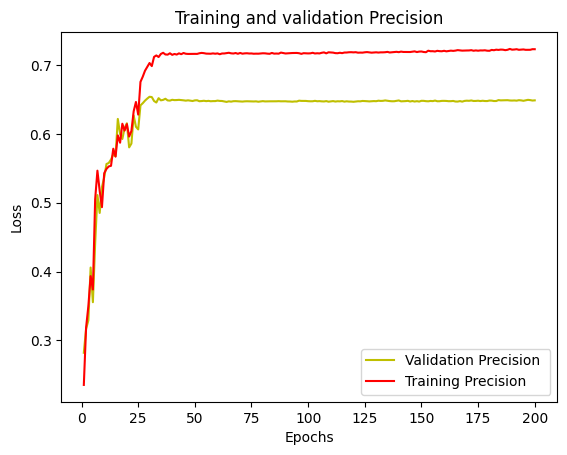

In [224]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_precision) + 1)
plt.plot(epochs, val_precision, 'y', label='Validation Precision ')
plt.plot(epochs, train_precision, 'r', label='Training Precision')
plt.title('Training and validation Precision')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

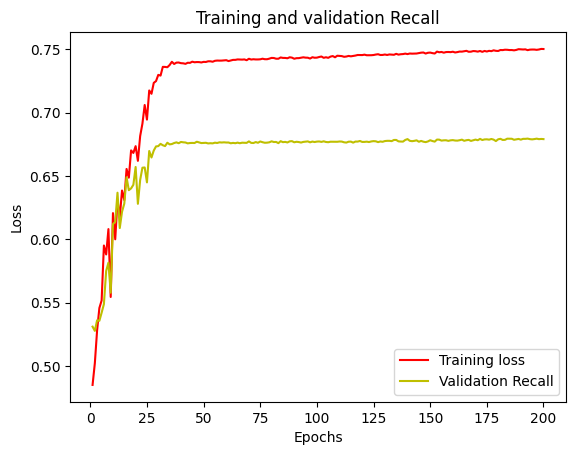

In [225]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_recall) + 1)
plt.plot(epochs, train_recall, 'r', label='Training loss')
plt.plot(epochs, val_recall, 'y', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

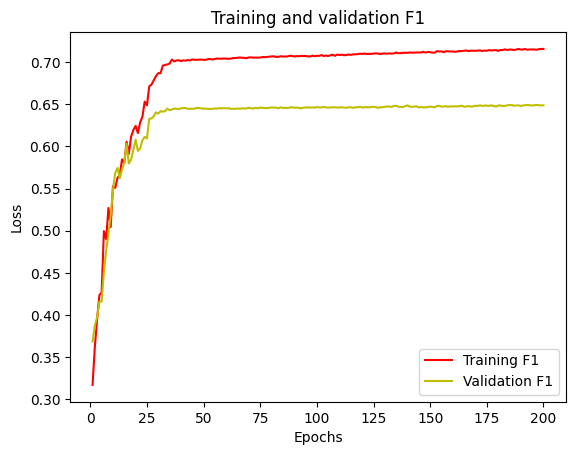

In [226]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_f1) + 1)
plt.plot(epochs, train_f1, 'r', label='Training F1')
plt.plot(epochs, val_f1, 'y', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

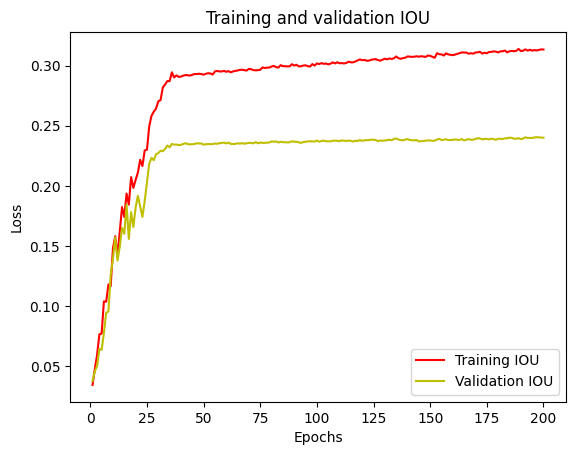

In [227]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_iou) + 1)
plt.plot(epochs, train_iou, 'r', label='Training IOU')
plt.plot(epochs, val_iou, 'y', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

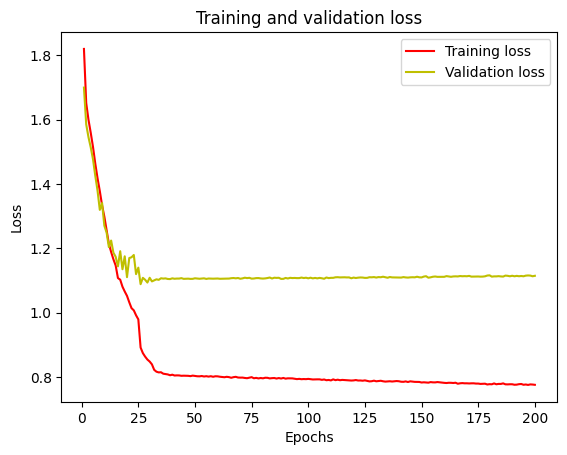

In [228]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

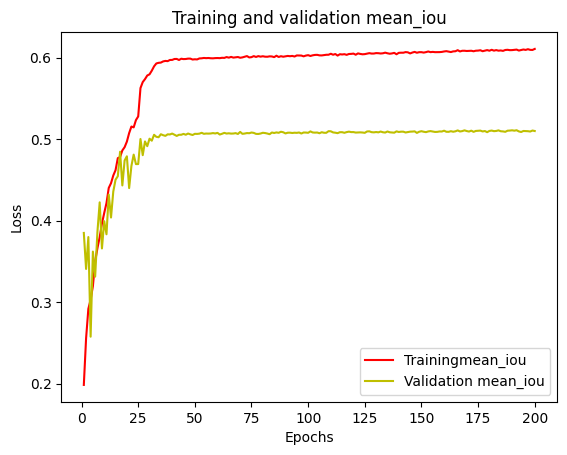

In [229]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['mean_iou']
val_loss = history.history['val_mean_iou']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Trainingmean_iou')
plt.plot(epochs, val_loss, 'y', label='Validation mean_iou')
plt.title('Training and validation mean_iou')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

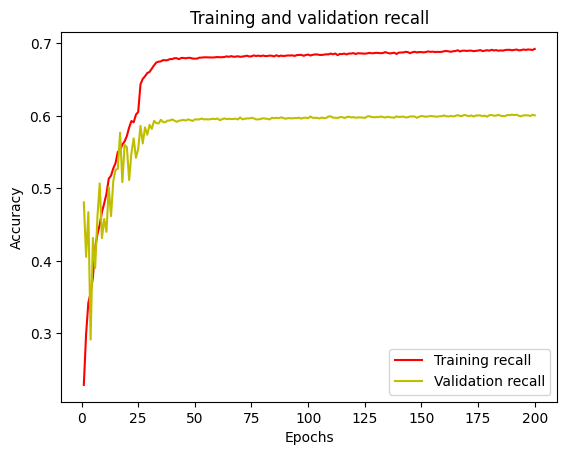

In [230]:
acc = history.history['recall']
val_acc = history.history['val_recall']

plt.plot(epochs, acc, 'r', label='Training recall')
plt.plot(epochs, val_acc, 'y', label='Validation recall')
plt.title('Training and validation recall')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

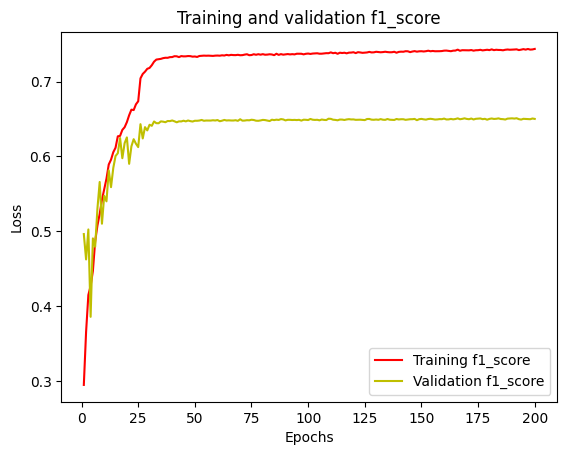

In [231]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1_score')
plt.plot(epochs, val_loss, 'y', label='Validation f1_score')
plt.title('Training and validation f1_score')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

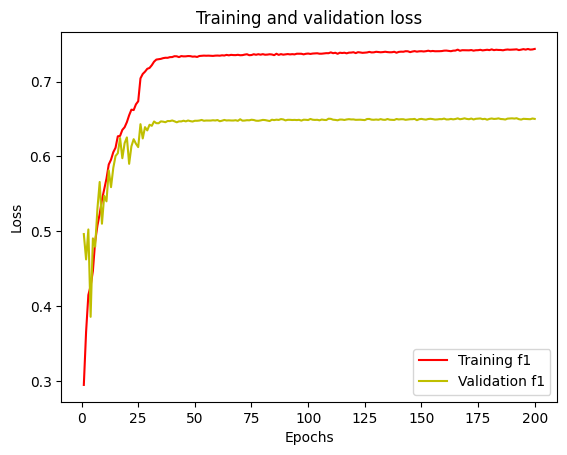

In [232]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1')
plt.plot(epochs, val_loss, 'y', label='Validation f1')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [233]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'mean_iou', 'recall', 'f1_score', 'val_loss', 'val_accuracy', 'val_mean_iou', 'val_recall', 'val_f1_score', 'lr'])

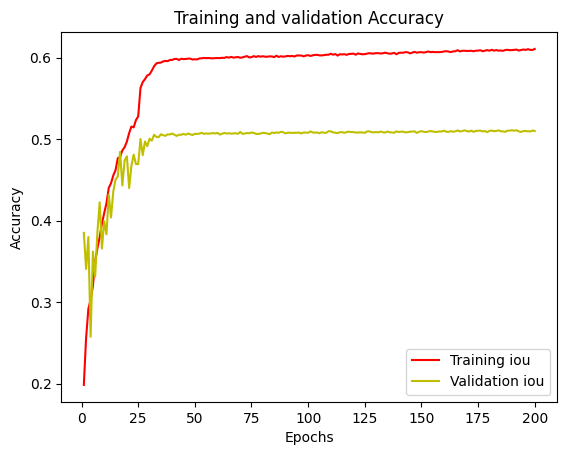

In [234]:
acc = history.history['mean_iou']
val_acc = history.history['val_mean_iou']

plt.plot(epochs, acc, 'r', label='Training iou')
plt.plot(epochs, val_acc, 'y', label='Validation iou')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
test56.txt

In [ ]:
%tensorboard --logdir '/kaggle/working/LOGS'

In [235]:
#Save history 
my_file = open('./history_.txt','w+')
with open("history_14.txt", 'w+') as f:
    for key, value in history.history.items():
        f.write('%s:%s\n' % (key, value))


In [56]:
#Save history 
my_file = open('./history_14_test_val.txt','w+')
with open("history_14_test_val.txt", 'w+') as f:
    for key,val in metrics_callback.metrics_history.items():
        f.write('%s: %s' % (key,val))

In [320]:
type(metrics_callback.metrics_history)

dict

In [236]:
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

28/28 [==============================] - 1s 21ms/step


In [237]:
y_test.shape

(881, 128, 128, 1)

In [238]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = n_classes
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.22591208


In [239]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])


print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)


[[6.161588e+06 5.723190e+05 1.356780e+05 8.526300e+04 2.225240e+05
  4.399700e+04 6.929700e+04 1.640000e+03 2.452800e+04 3.140800e+04
  2.111000e+03 2.692000e+03 0.000000e+00 9.573400e+04]
 [5.572190e+05 1.348128e+06 3.374100e+04 1.890000e+04 7.477000e+03
  1.450200e+04 1.574000e+03 3.444000e+03 2.600000e+01 2.132000e+03
  1.011000e+03 0.000000e+00 0.000000e+00 1.355000e+03]
 [1.791110e+05 3.379800e+04 1.141196e+06 1.094100e+04 1.184200e+04
  7.946000e+03 2.164000e+03 1.480000e+02 1.300000e+01 4.266000e+03
  1.000000e+01 4.276000e+03 0.000000e+00 2.524700e+04]
 [3.165100e+05 5.834100e+04 6.733000e+03 2.128850e+05 2.887000e+03
  6.800000e+02 3.087000e+03 1.300000e+01 2.000000e+01 1.192600e+04
  5.000000e+01 3.000000e+00 0.000000e+00 1.918000e+03]
 [5.293220e+05 1.607000e+04 1.436000e+04 5.384000e+03 3.793130e+05
  9.520000e+03 4.871000e+03 4.320000e+02 2.260000e+02 2.200000e+01
  8.900000e+01 2.000000e+00 0.000000e+00 1.500000e+01]
 [7.351700e+04 2.103800e+04 2.173400e+04 8.800000e+01 1

In [240]:
# Get the confusion matrix from the metric's weights
confusion_matrix = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)

# Compute IoU for each class using the confusion matrix
iou_per_class = np.diag(confusion_matrix) / (np.sum(confusion_matrix, axis=1) + np.sum(confusion_matrix, axis=0) - np.diag(confusion_matrix))

# Print IoU for each class
for i, iou in enumerate(iou_per_class):
    print(f"Class {i}: IoU = {iou:.4f}")

Class 0: IoU = 0.6033
Class 1: IoU = 0.4550
Class 2: IoU = 0.6799
Class 3: IoU = 0.2809
Class 4: IoU = 0.3108
Class 5: IoU = 0.2500
Class 6: IoU = 0.1125
Class 7: IoU = 0.0108
Class 8: IoU = 0.0499
Class 9: IoU = 0.0575
Class 10: IoU = 0.0114
Class 11: IoU = 0.0059
Class 12: IoU = 0.0000
Class 13: IoU = 0.3351


In [102]:
values.shape

(14, 14)

Classes in image :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


Text(0.5, 1.0, 'Coloured class mask')

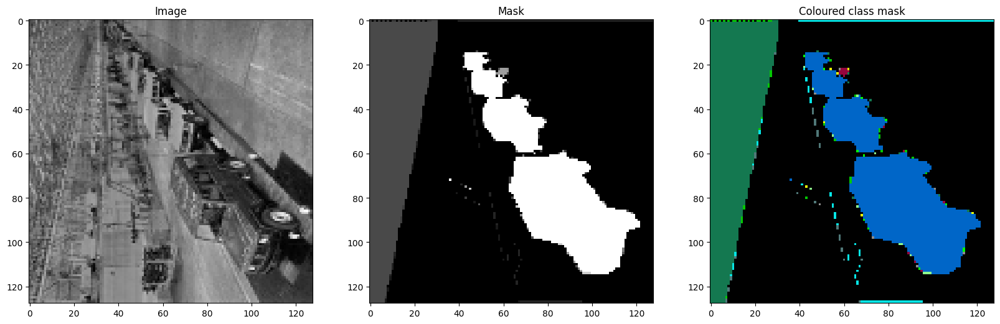

In [241]:
#Sanity check
print("Classes in image : ",np.unique(train_masks))
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(train_images[1, :,:,0], cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(train_masks[1],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[1],cmap='gray')
plt.title("Coloured class mask")

In [243]:
#Randomly selecting images to test
test_img_number = random.randint(0, len(X1))
test_img = X1[test_img_number]
ground_truth=y1[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 20ms/step


Unique classes in test_img Image:  [0.01950177 0.01989469 0.02104294 ... 0.19792522 0.20344871 0.20606871]
Unique classes in ground_truth Image:  [0 1 2]
Unique classes in Predicted Image:  [0 1 2 5 7]


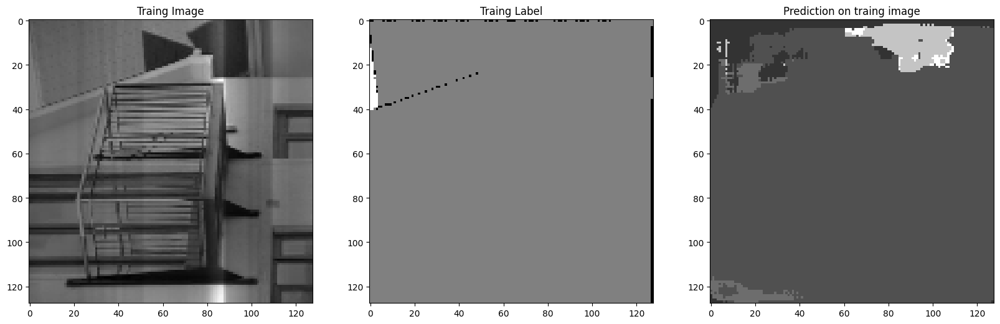

In [244]:
print("Unique classes in test_img Image: ",np.unique(test_img))
print("Unique classes in ground_truth Image: ",np.unique(ground_truth))
print("Unique classes in Predicted Image: ",np.unique(predicted_img))
plt.figure(figsize=(20, 20))
plt.subplot(231)
plt.title('Traing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Traing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')

plt.subplot(233)
plt.title('Prediction on traing image')
#plt.imshow(predicted_img, cmap='jet')


plt.imshow(predicted_img, cmap='gray', alpha=0.8) # interpolation='none'
plt.show()
plt.show()


In [245]:
ground_truth[:,:,0]

array([[0, 0, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 0],
       [1, 1, 1, ..., 1, 1, 0],
       [1, 1, 1, ..., 1, 1, 0]])

In [109]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 5.9 MB/s eta 0:00:00a 0:00:01


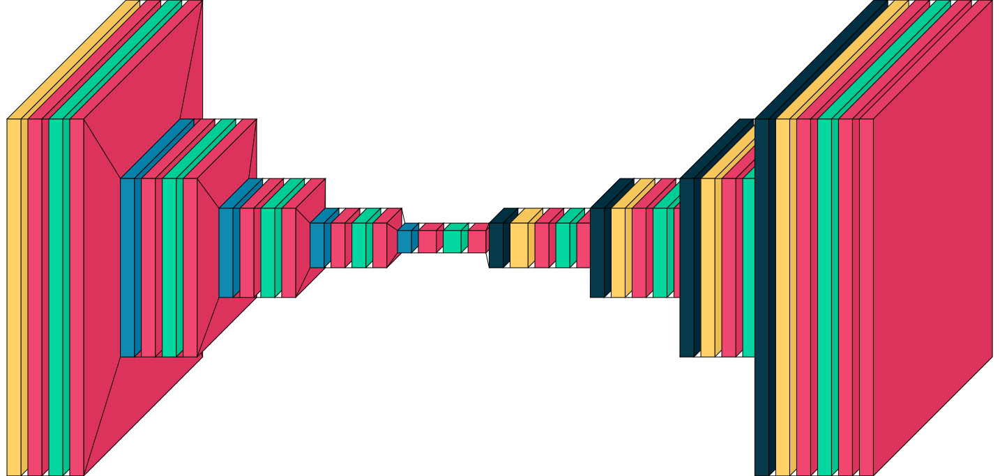

In [111]:
import visualkeras
visualkeras.layered_view(model,to_file='output.png')

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 2 3 8]


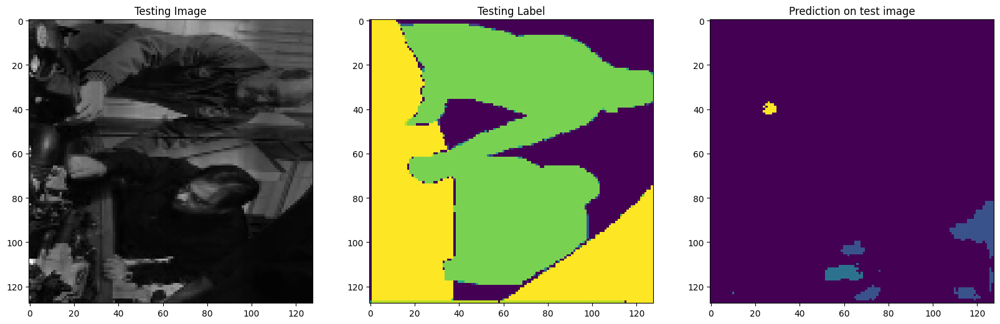

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 9]


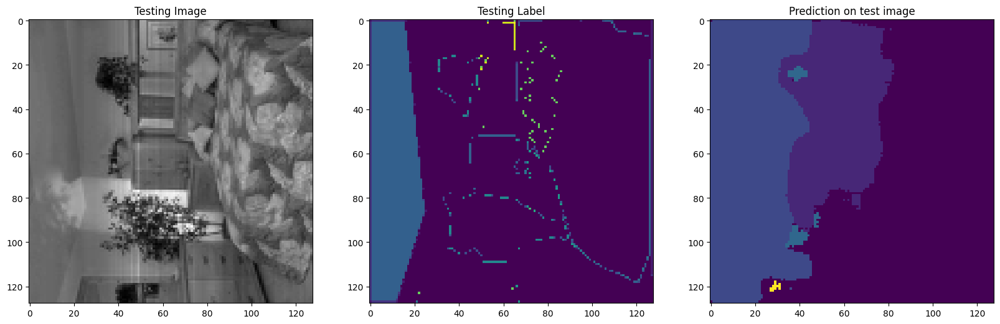

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  4  5  7  9 10 11]
Unique Classes in predicted taesting image  [0 1 2]


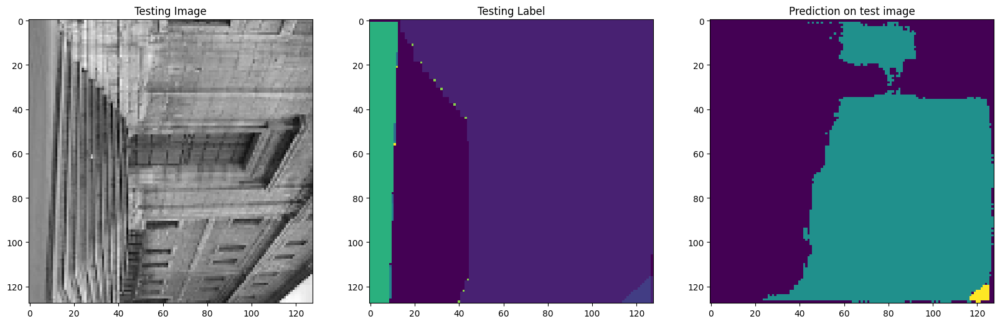

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 11 12 13]
Unique Classes in predicted taesting image  [0 2 4]


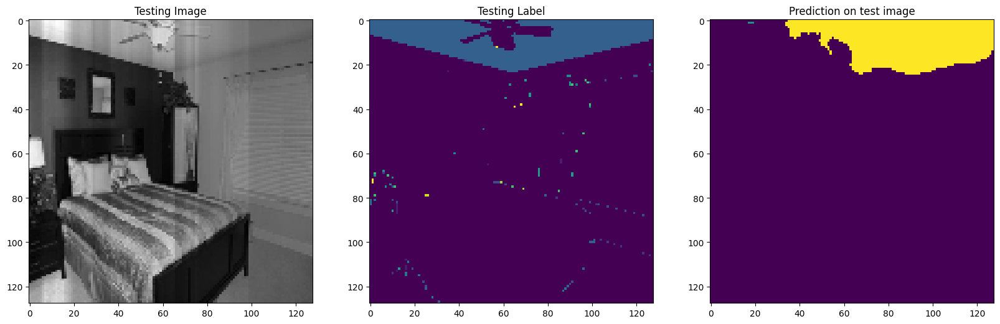

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 3 6]


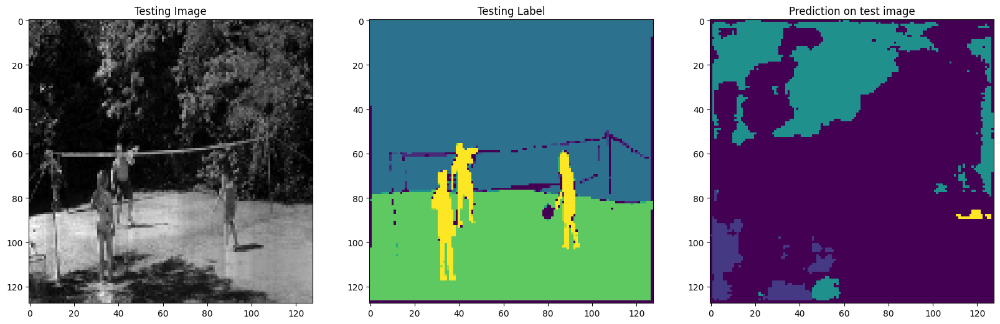

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8 11 12]
Unique Classes in predicted taesting image  [0 1 2 3 5 6]


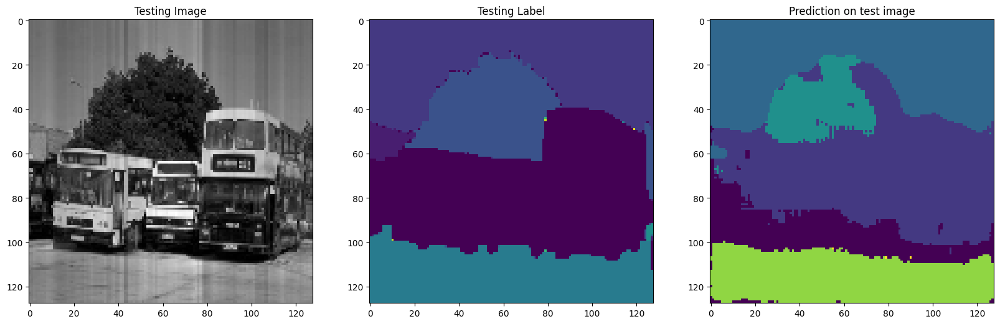

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 6 9]


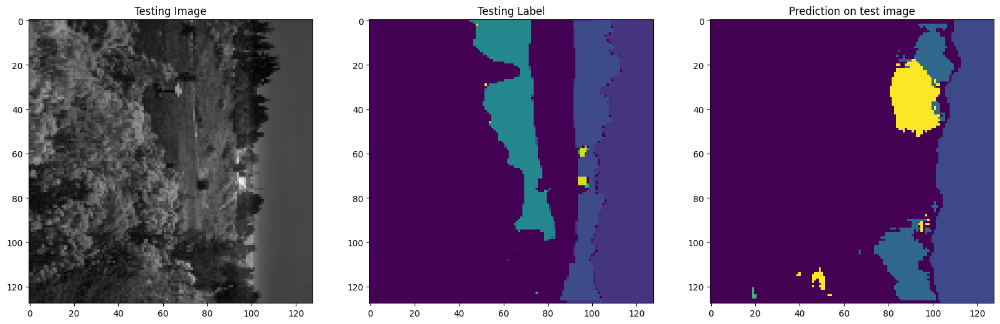

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3]


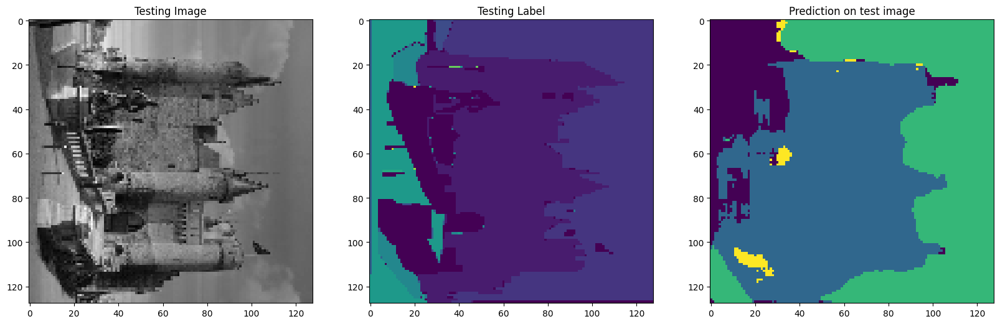

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


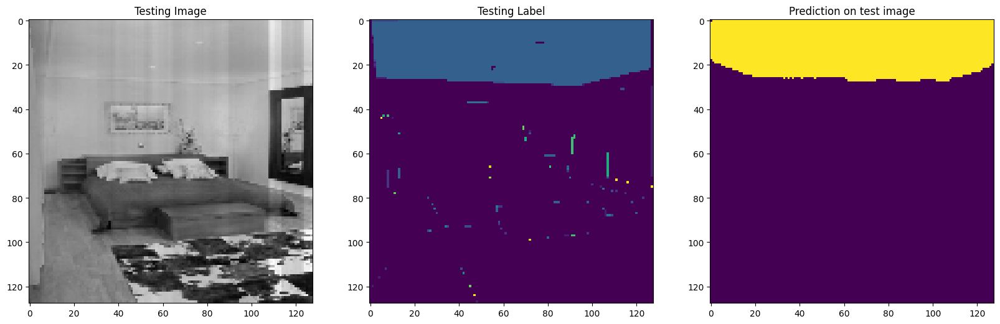

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 2 4 5]


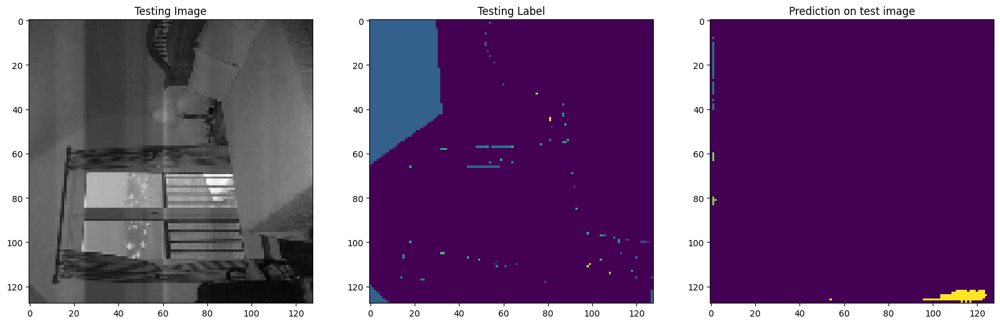

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 2 4 6 9]
Unique Classes in predicted taesting image  [0 1 2 3 5 7]


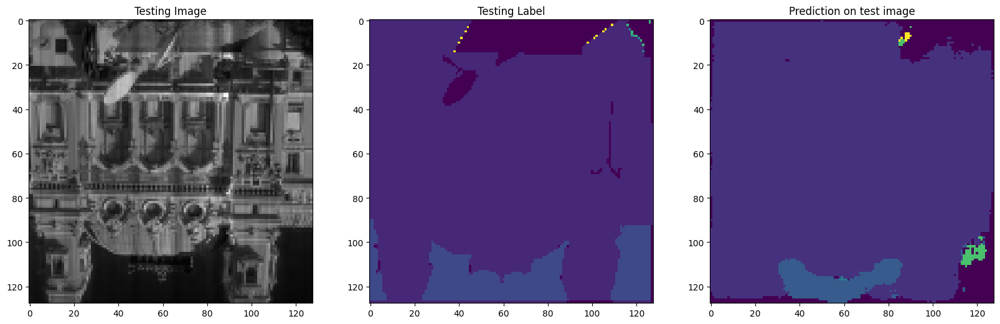

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 2 4 8]


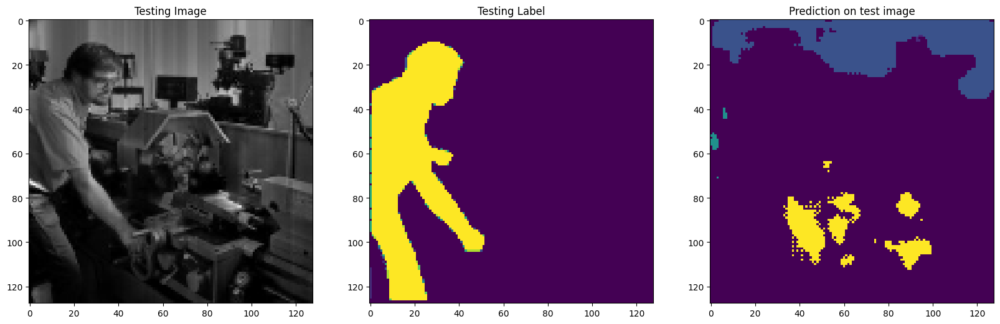

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6]
Unique Classes in predicted taesting image  [0 1 2 3 6 9]


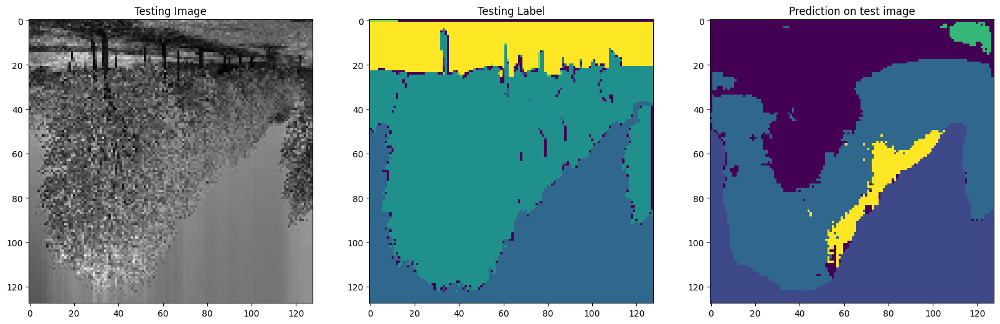

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 1 2]


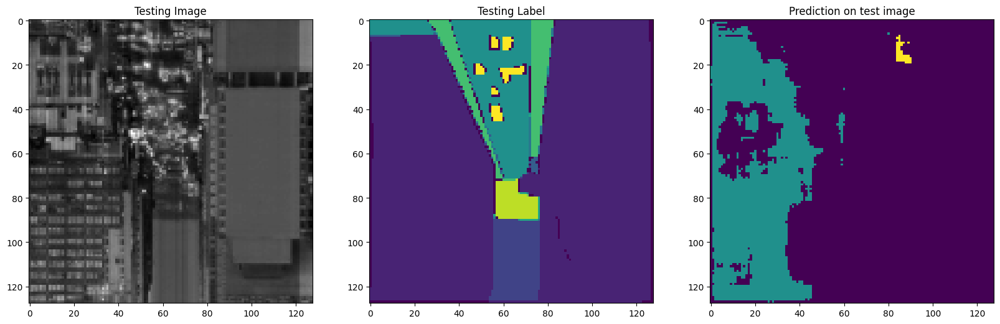

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 6 9]


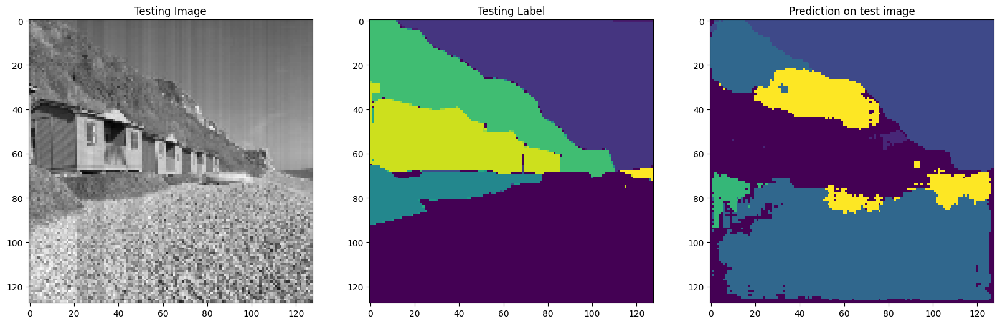

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 3]
Unique Classes in predicted taesting image  [0 1 2 3 9]


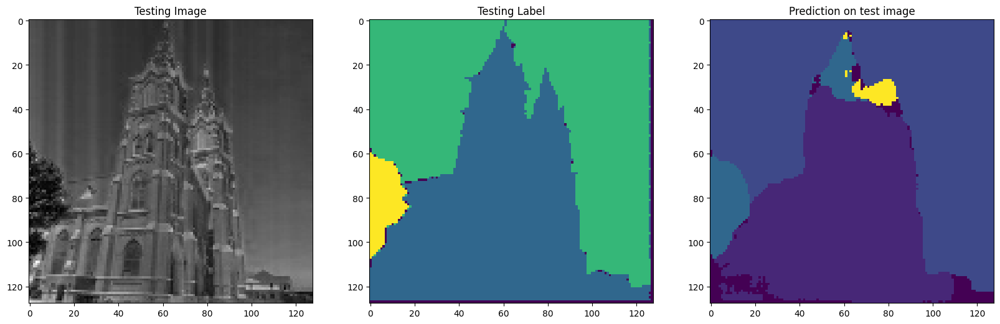

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 4 5 9]


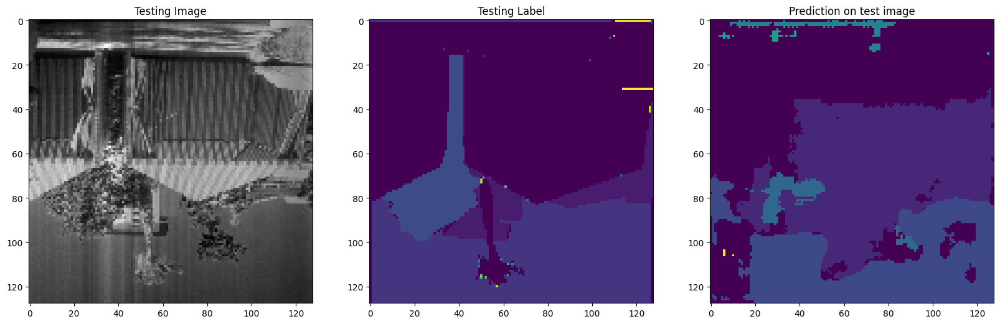

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 8]
Unique Classes in predicted taesting image  [0 1 2 3 5 6]


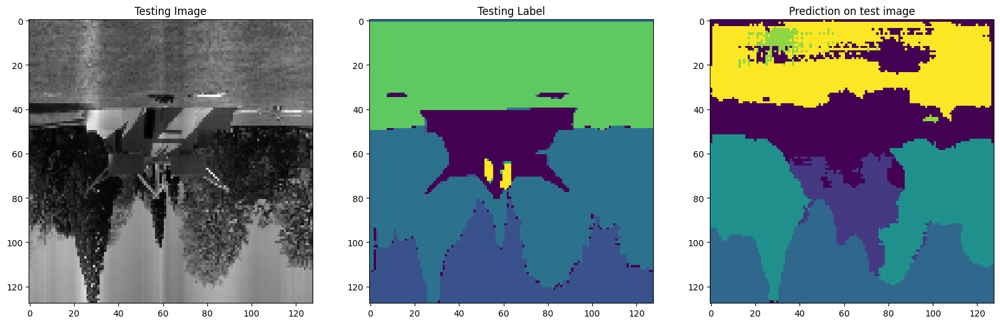

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 12]
Unique Classes in predicted taesting image  [0 1 5 6]


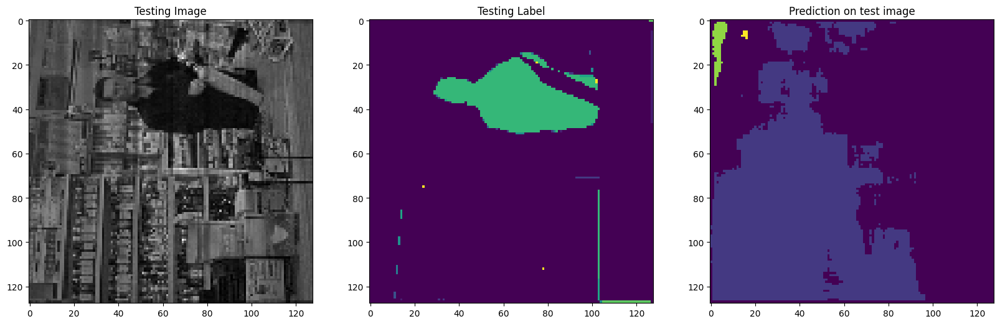

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 1 2 5 7]


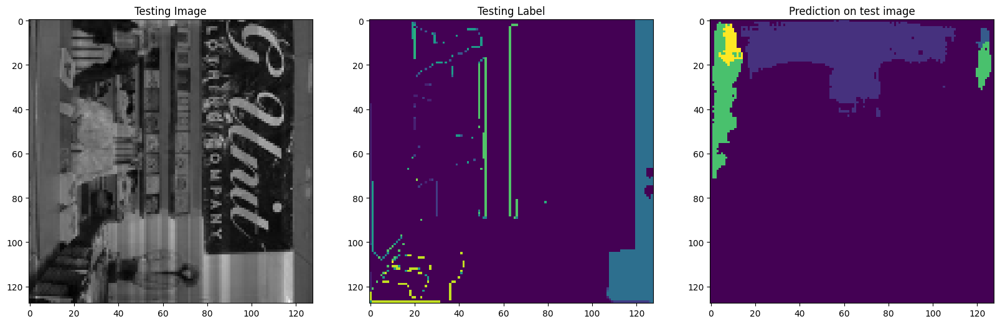

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 3]


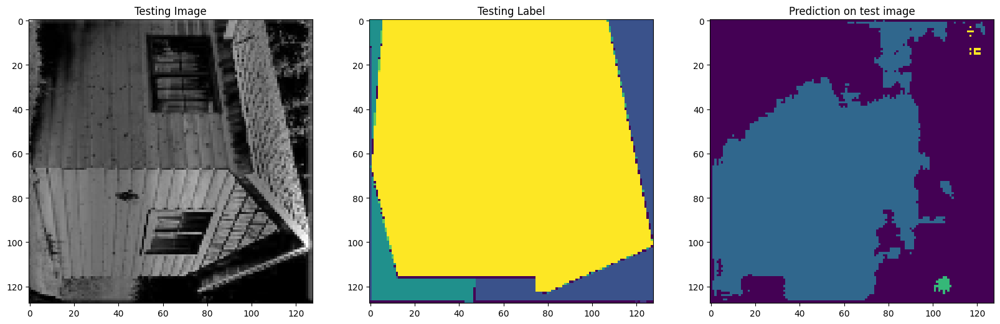

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 4]


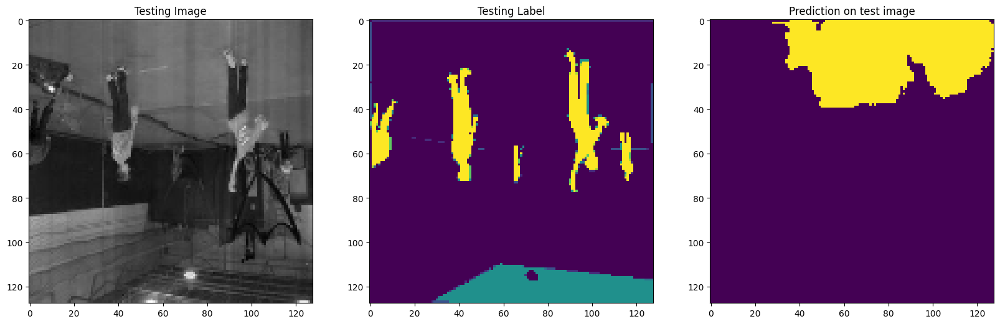

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 12]
Unique Classes in predicted taesting image  [0 4]


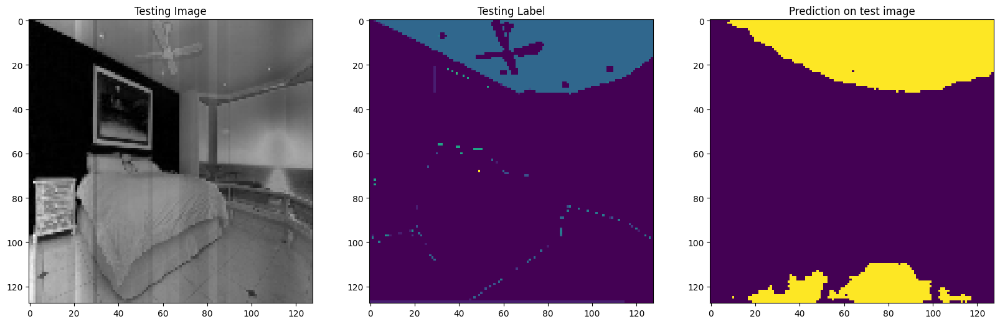

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 4]


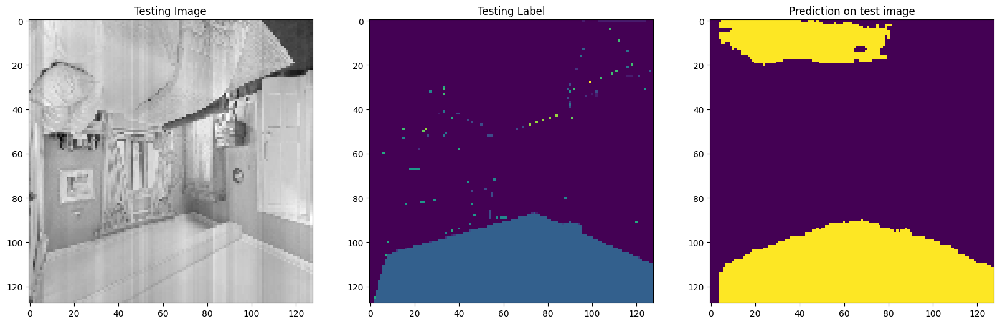

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


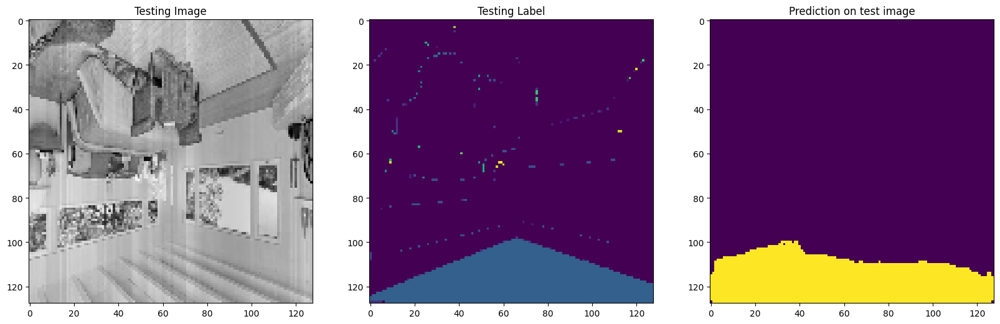

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  5  9 13]
Unique Classes in predicted taesting image  [ 0  2  9 13]


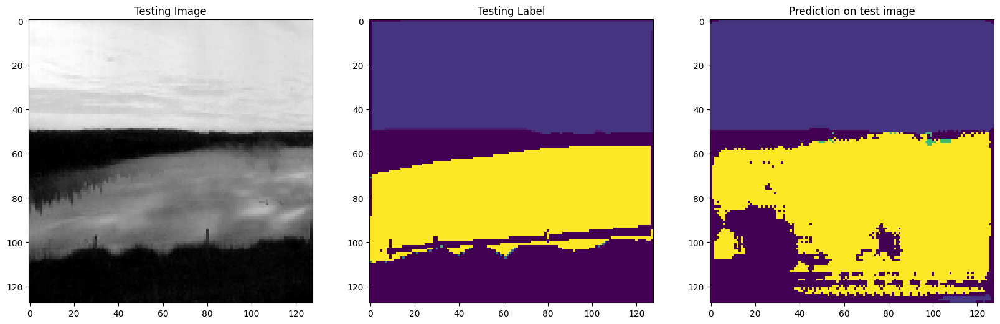

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 7]


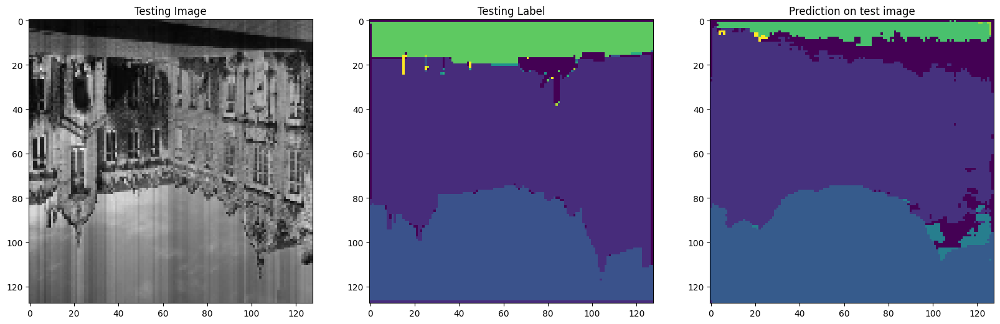

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 7]


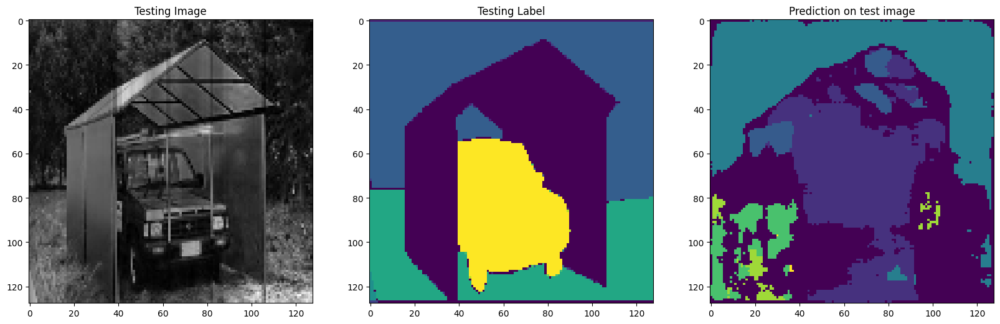

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 11]


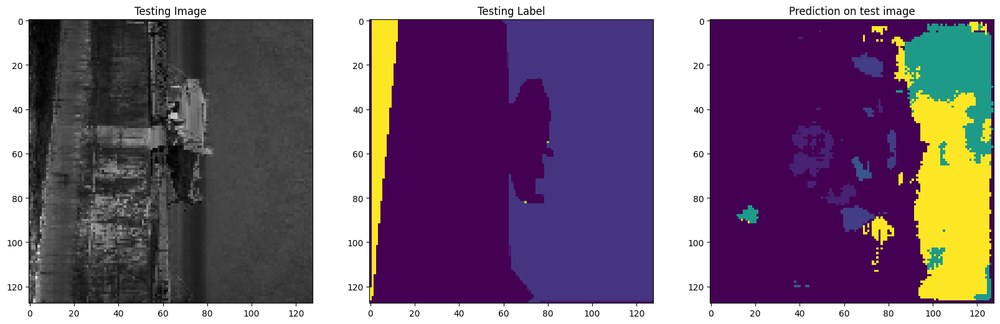

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 13]
Unique Classes in predicted taesting image  [0 2 3 4]


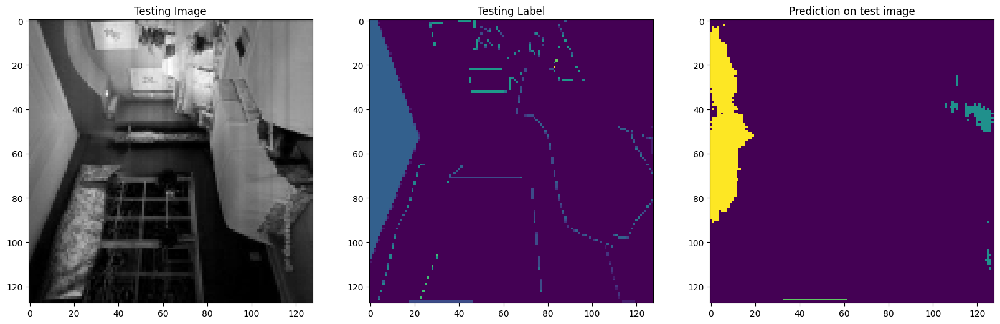

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  8  9 10 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  9 11 13]


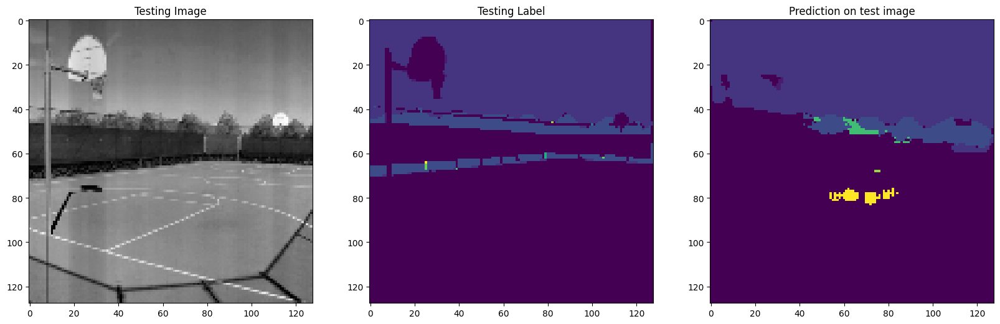

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 3]


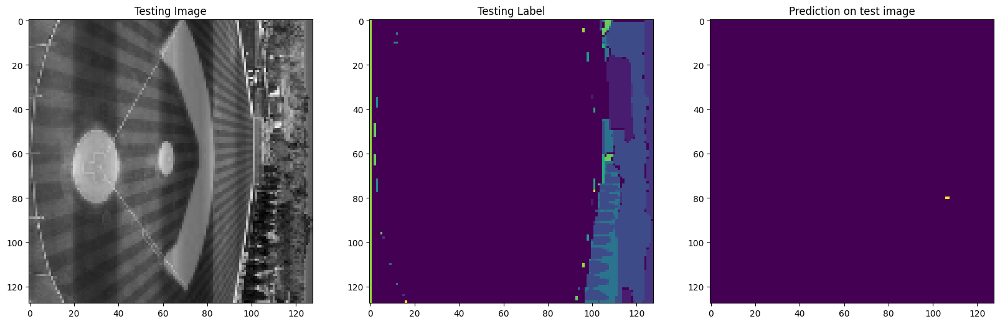

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2]


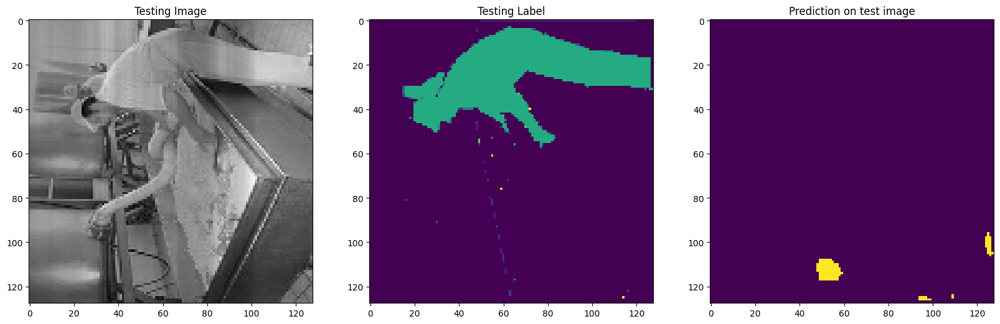

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2]


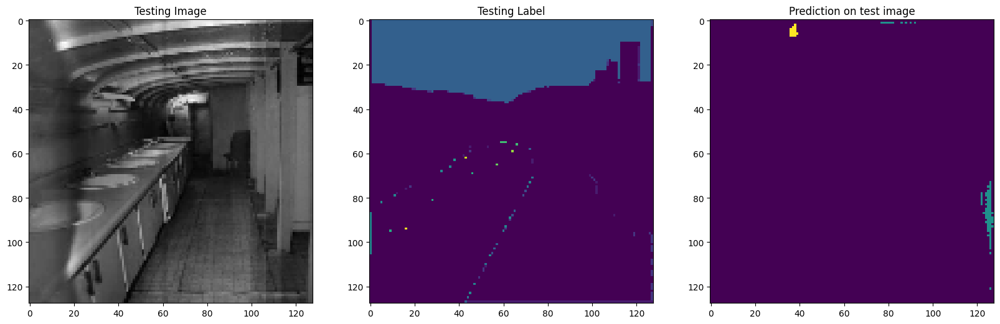

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 13]
Unique Classes in predicted taesting image  [0 2 4]


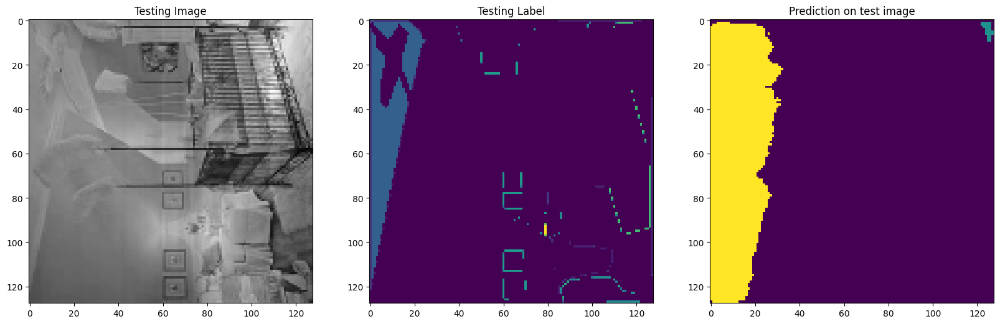

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 8]


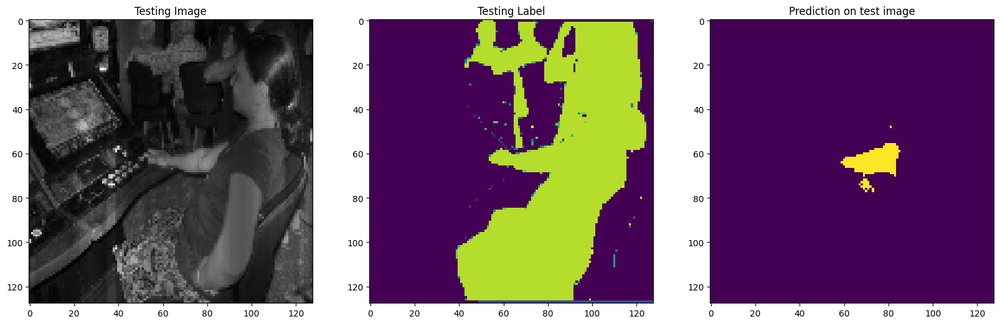

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 3 4 5 7]


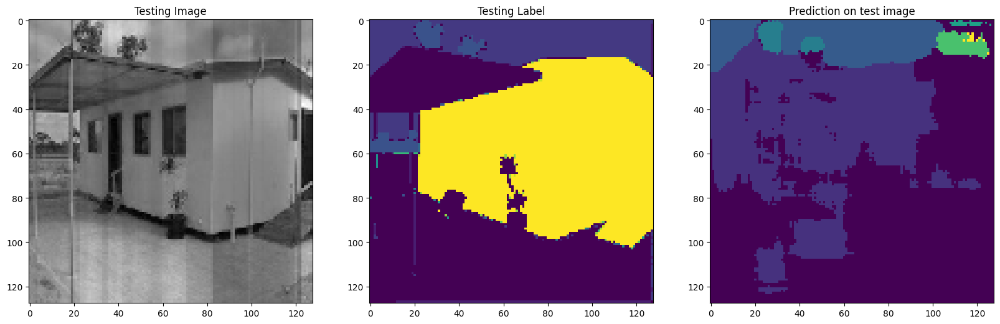

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 1 2 3 4]


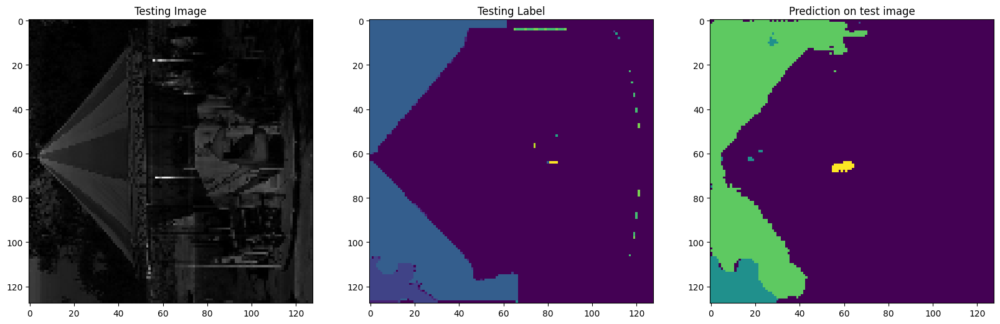

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3]


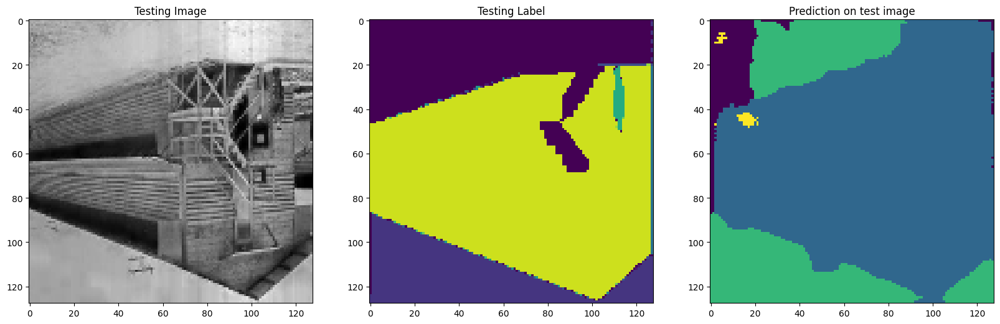

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 4 6]


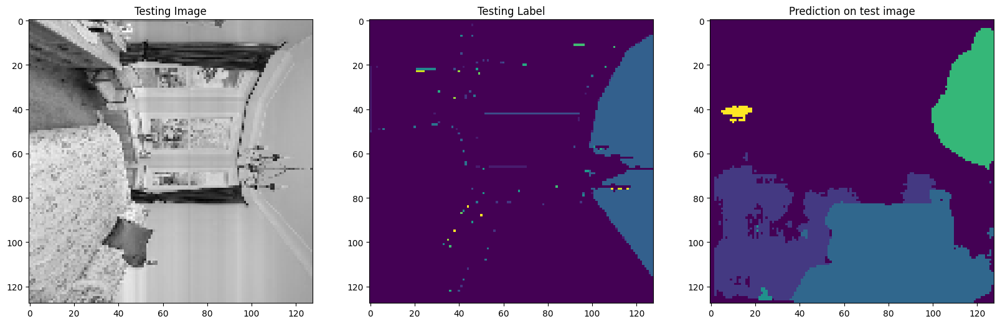

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 4 5 6]


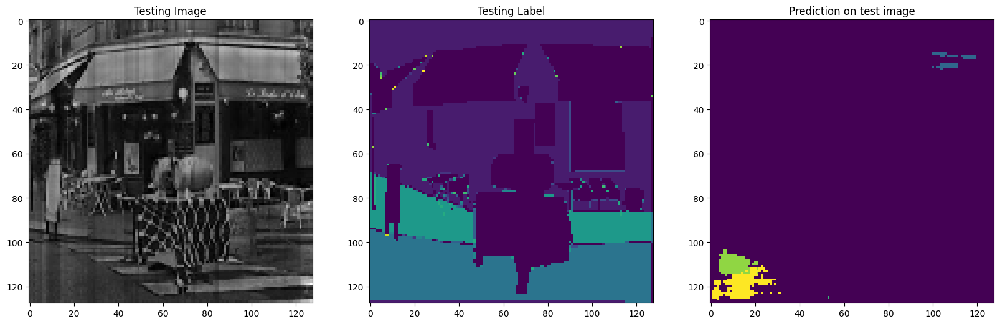

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [0 4 8]


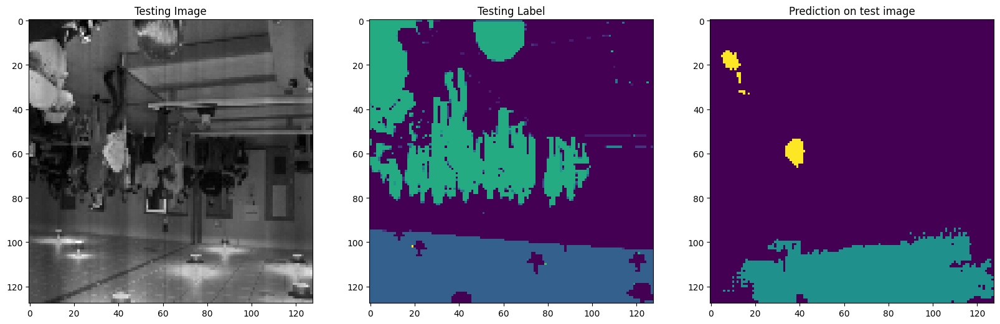

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 5]
Unique Classes in predicted taesting image  [0 1 2 3 4 5]


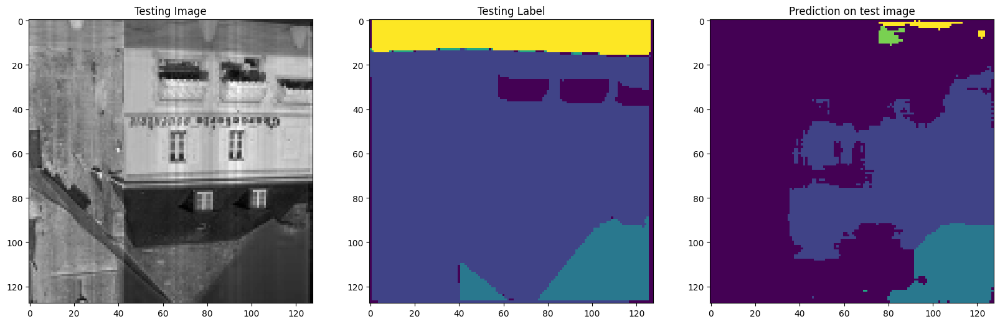

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 4]


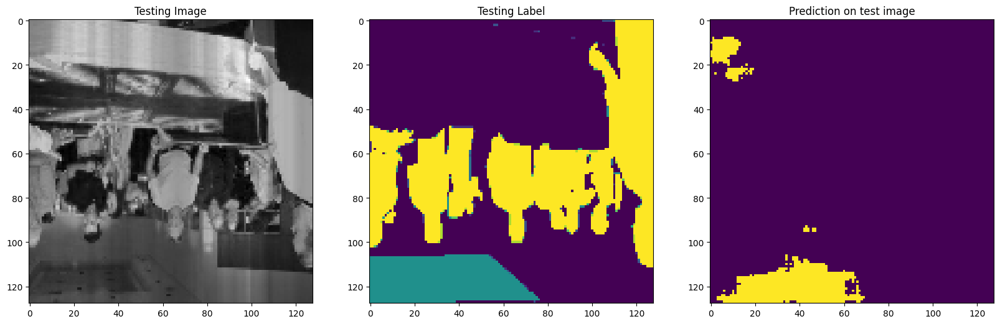

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  5  6  7 10]


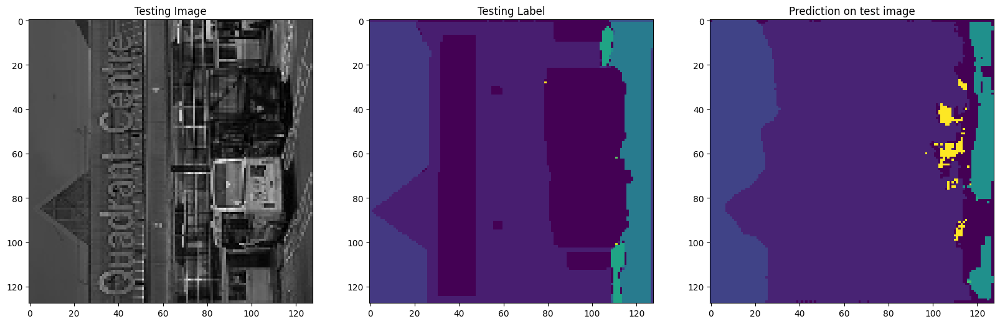

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 10 13]
Unique Classes in predicted taesting image  [0 1 2 4 5 7]


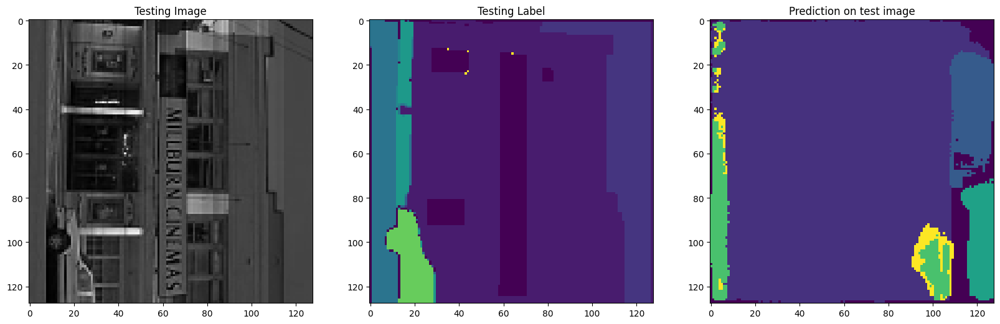

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4]


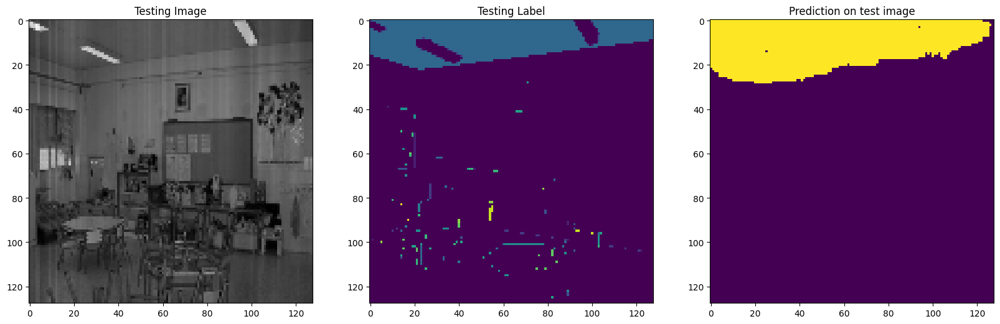

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1]


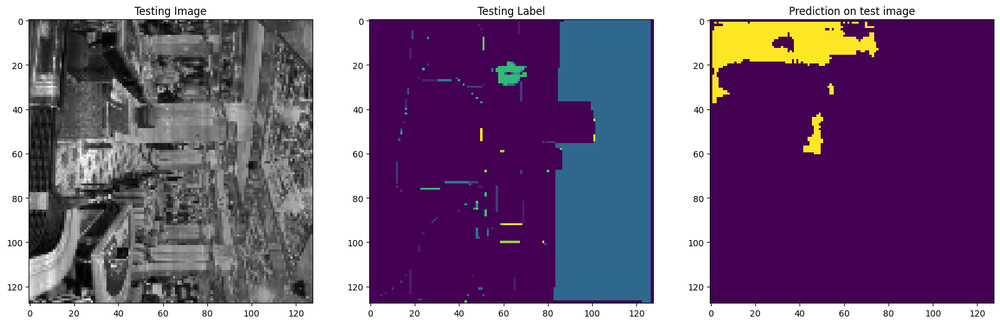

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [0 1 2 3]
Unique Classes in predicted taesting image  [ 0  2  3  9 13]


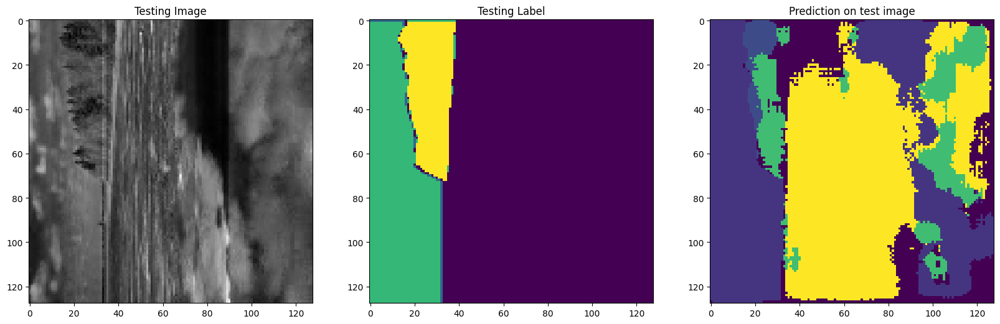

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 3]


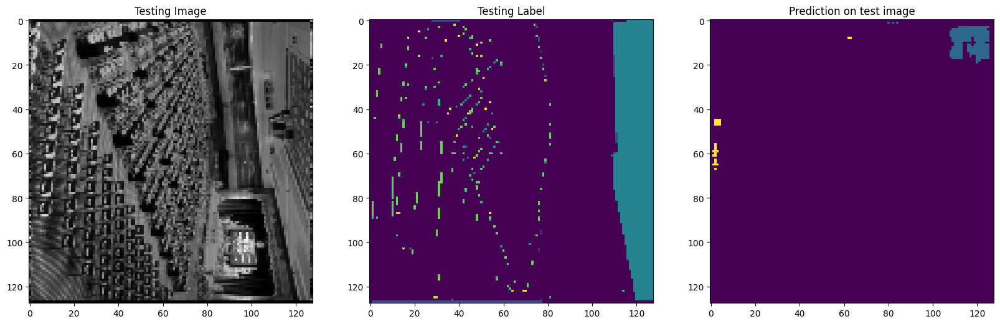

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


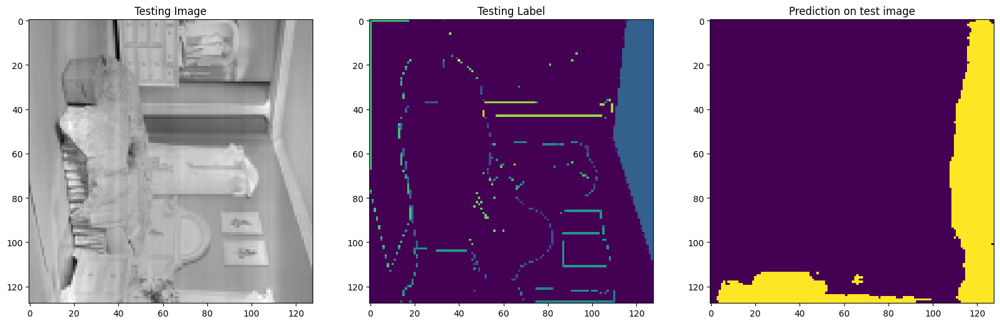

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  7  8 10 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 9]


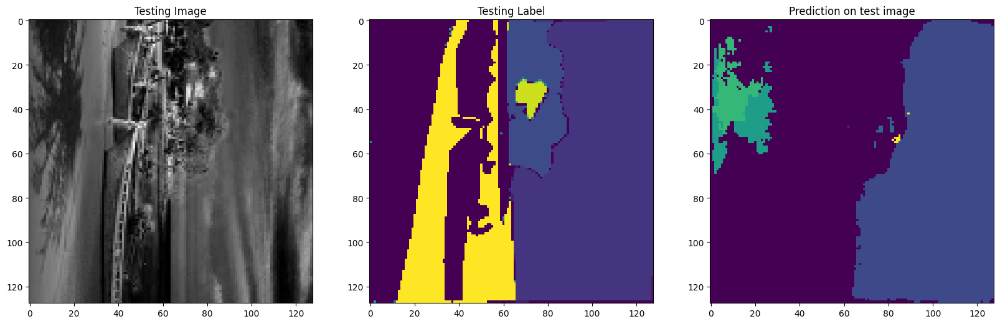

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 3 4]


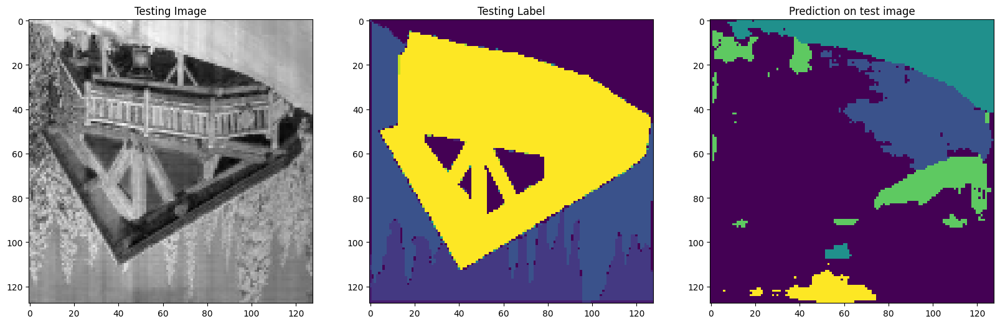

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 8]


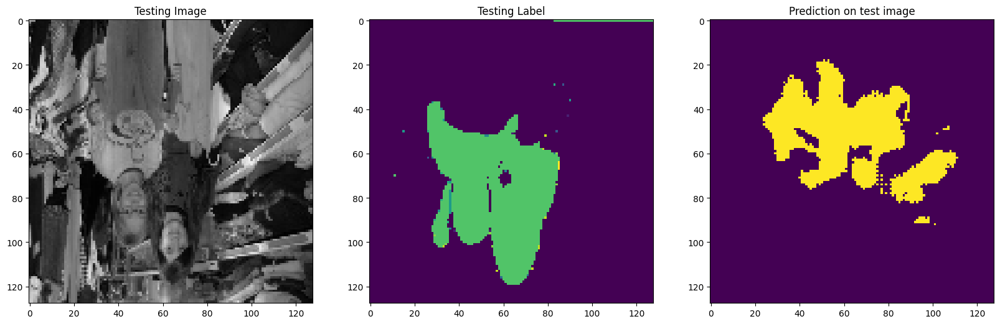

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 12]
Unique Classes in predicted taesting image  [0 2 3 6]


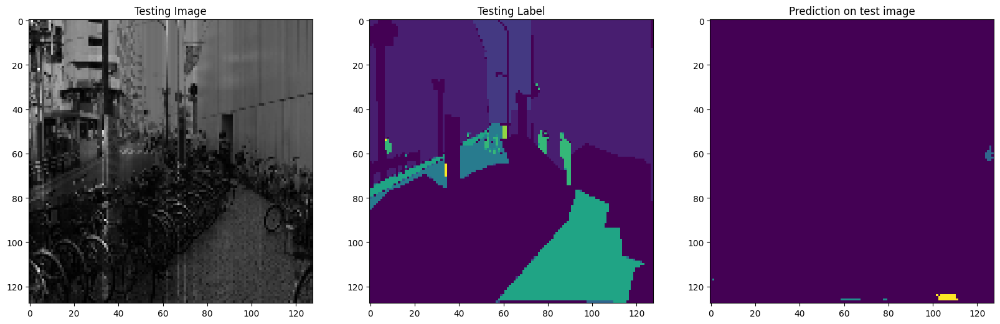

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8 10 12]
Unique Classes in predicted taesting image  [0 1 2]


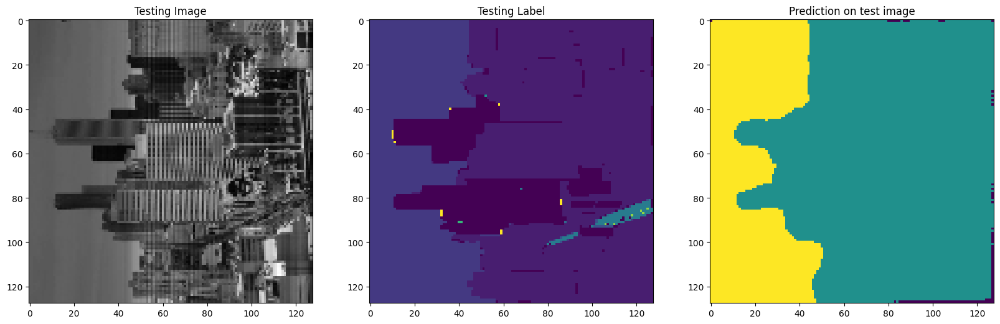

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 2 5 6 7]


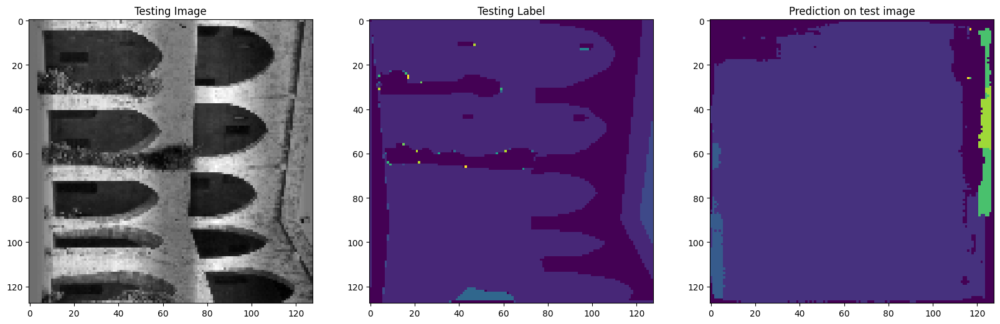

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 4]


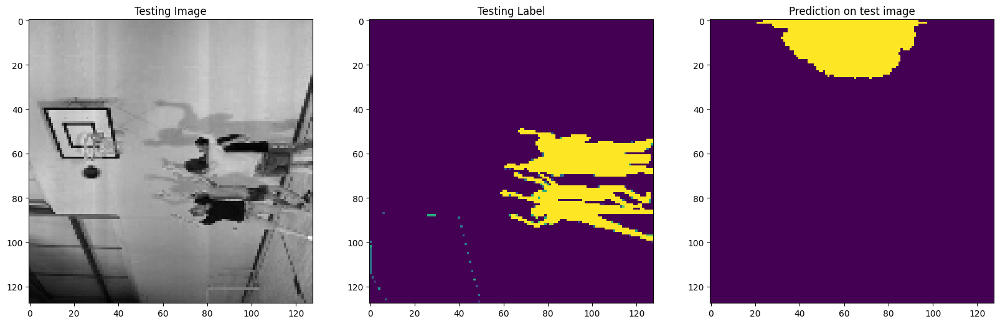

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 5 7]


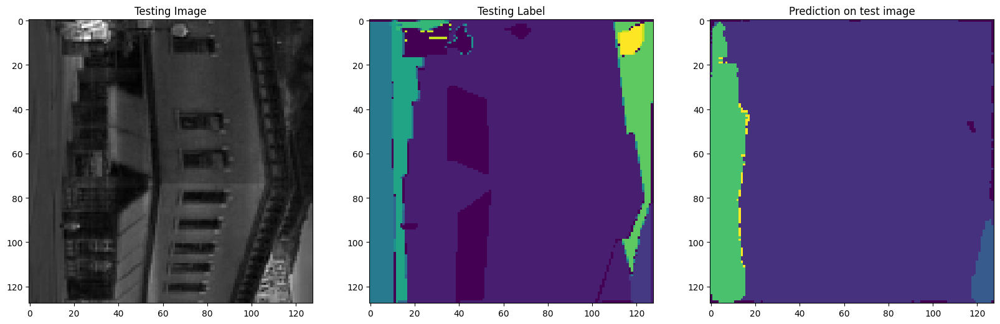

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  5  7 10 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  9 13]


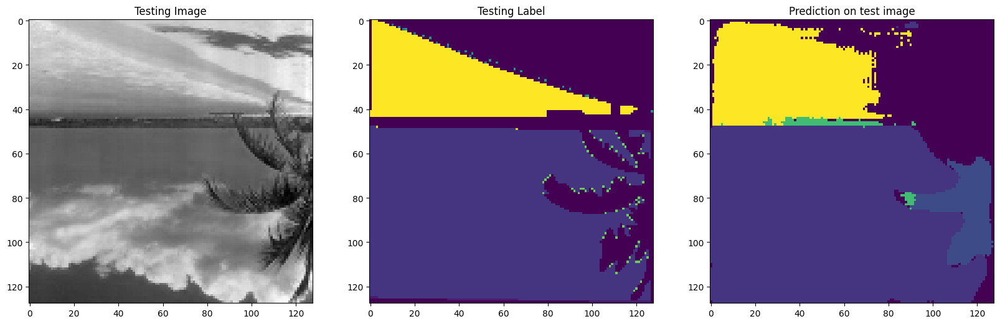

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 8]


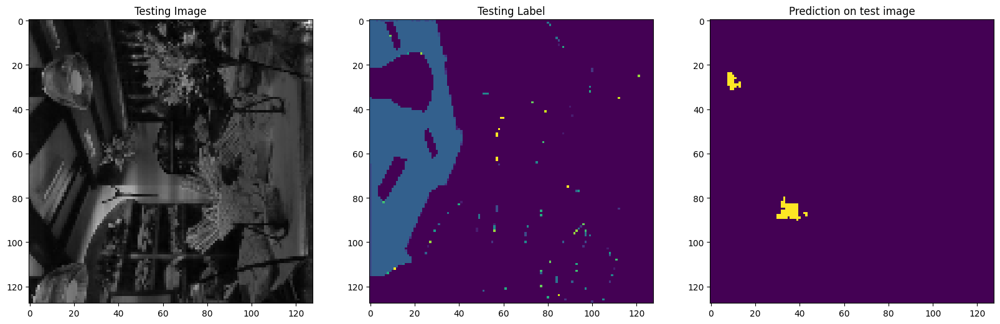

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12]
Unique Classes in predicted taesting image  [0 4]


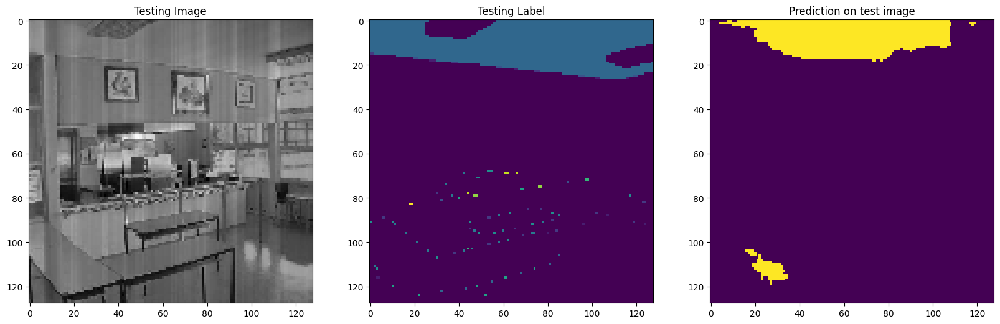

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  8 10 12 13]
Unique Classes in predicted taesting image  [0 4]


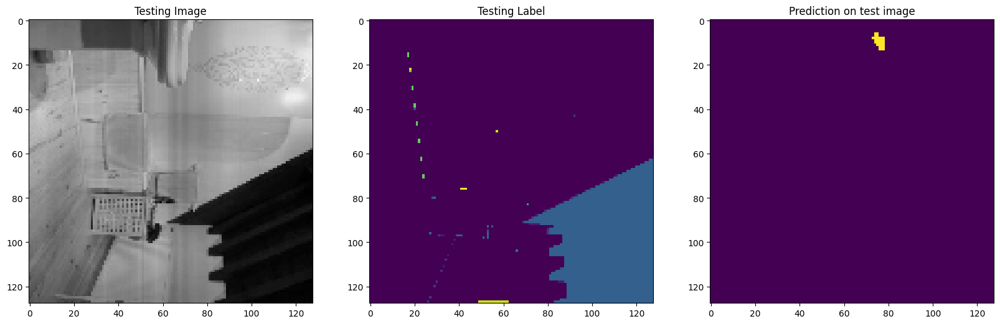

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 4]


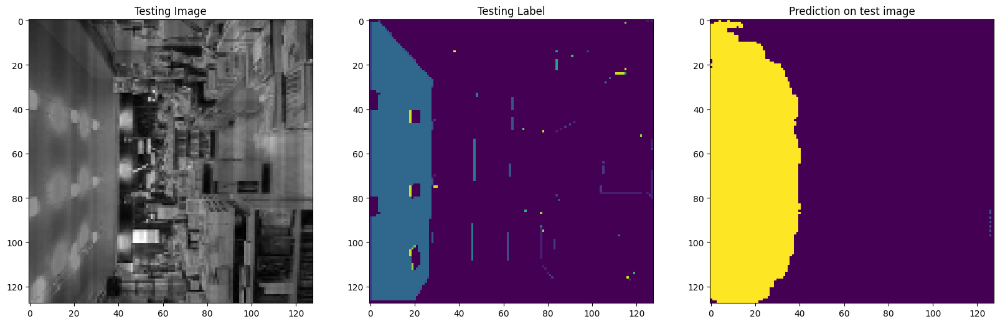

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


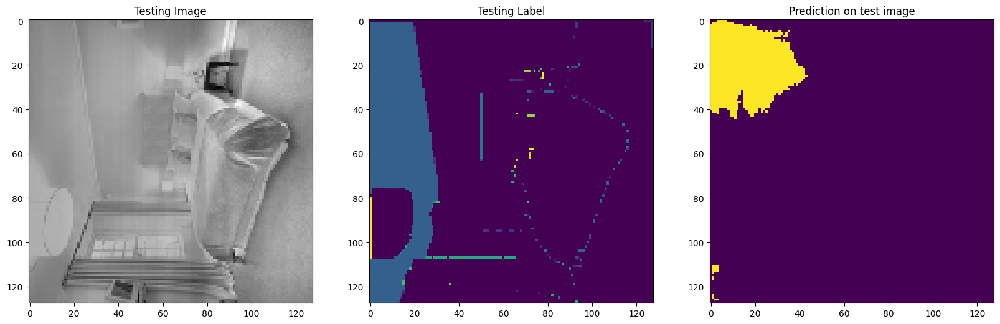

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


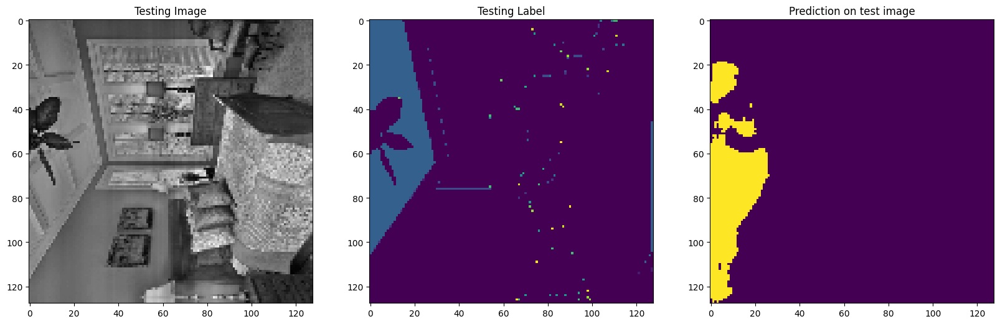

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4]


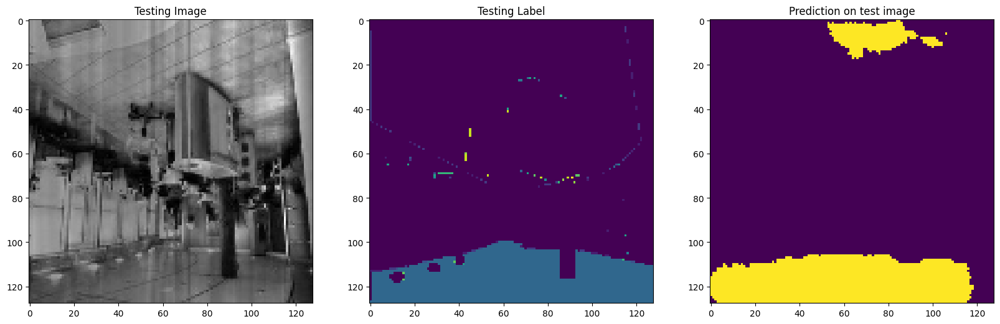

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [0 1 2 3 4 6 9]
Unique Classes in predicted taesting image  [0 1 2 3]


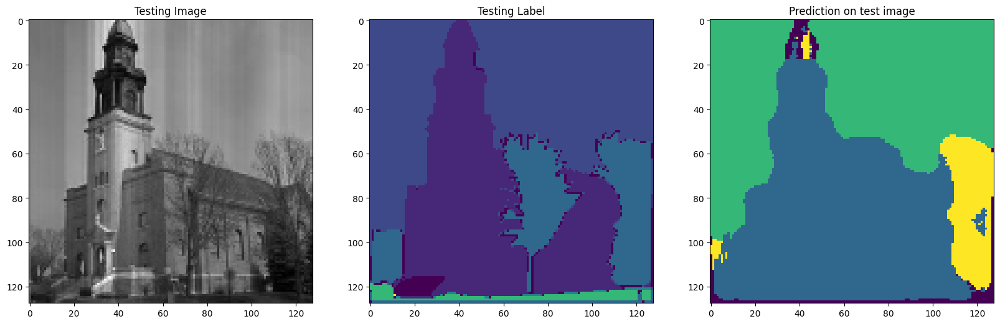

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  9 11 13]


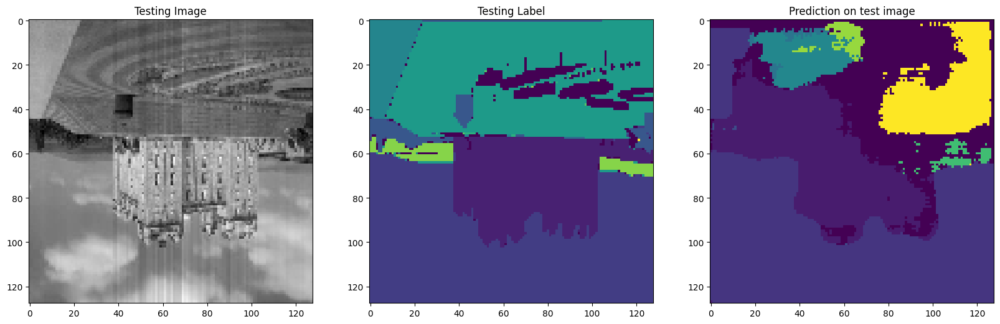

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  7  9 12]
Unique Classes in predicted taesting image  [0 1 2]


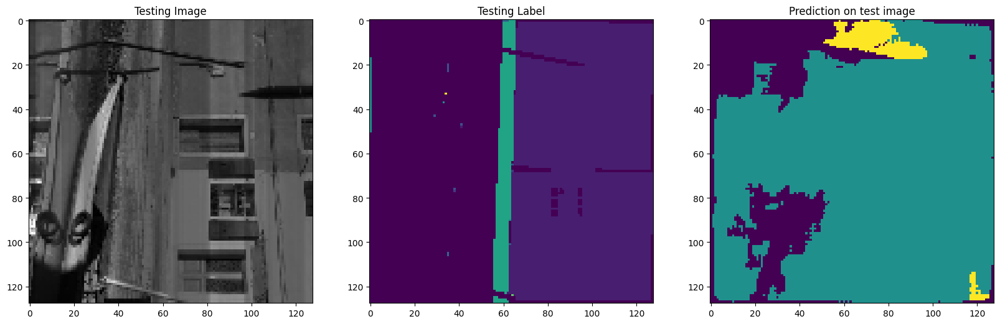

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


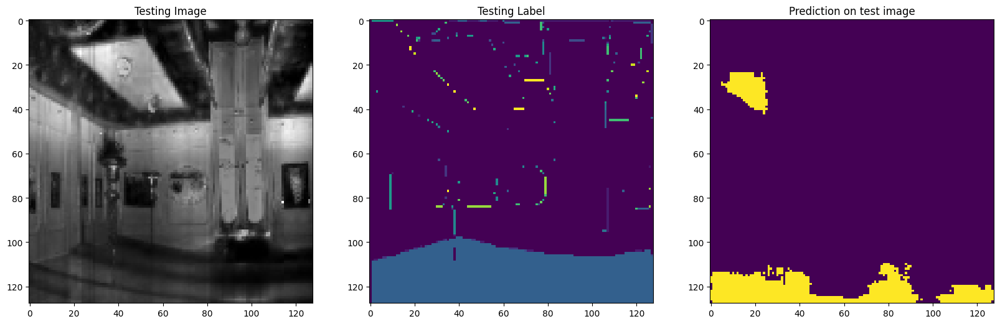

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12]
Unique Classes in predicted taesting image  [0 4]


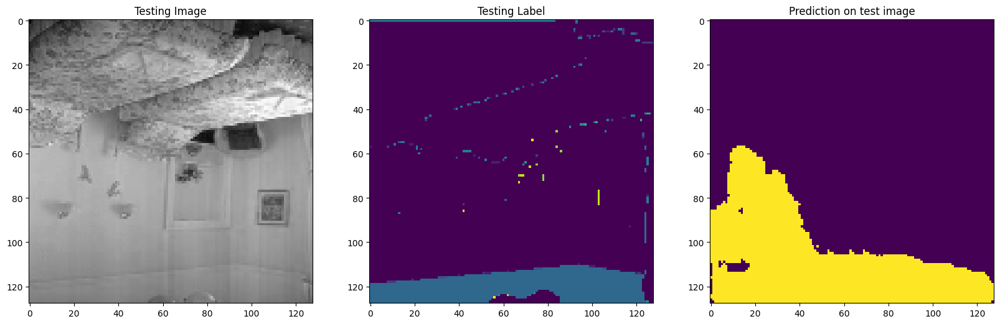

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2]
Unique Classes in predicted taesting image  [0 1 2 4]


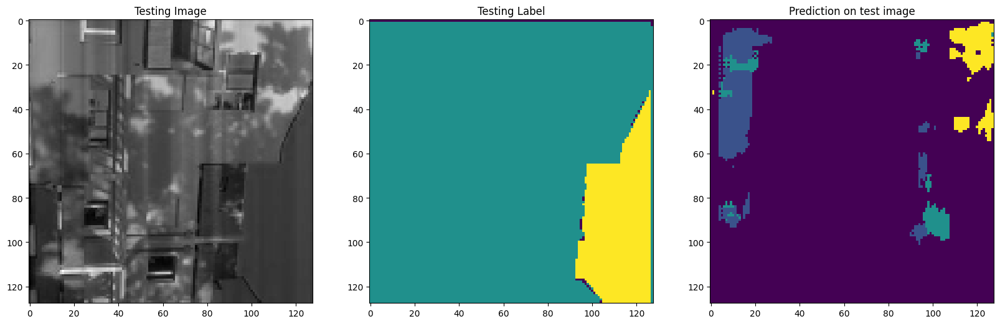

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  4  5  7  9 10 11]
Unique Classes in predicted taesting image  [0 1 2 4 5 7]


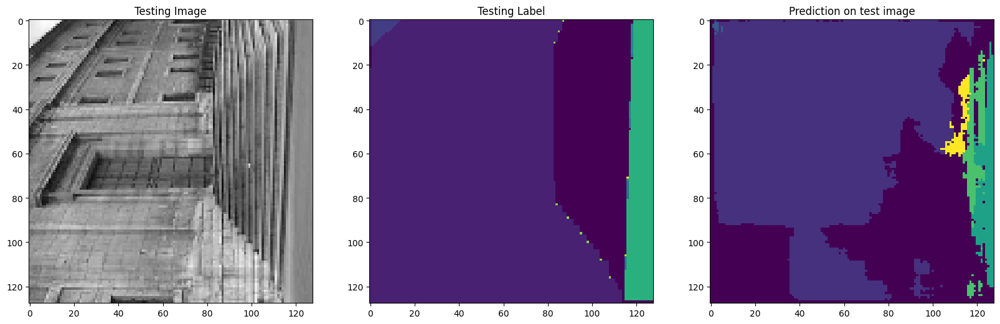

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 13]
Unique Classes in predicted taesting image  [0]


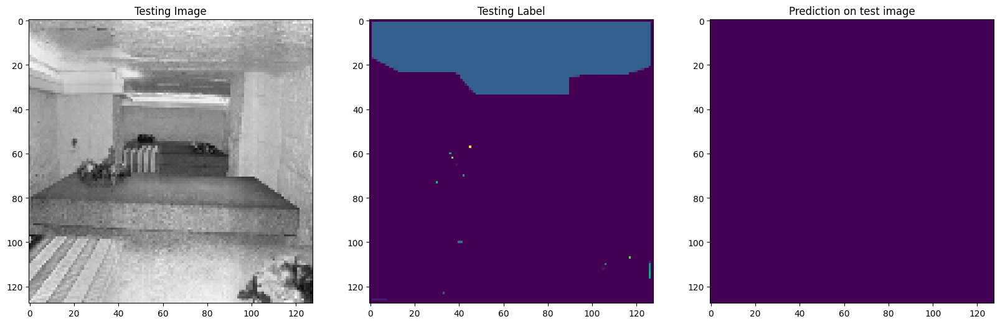

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10]
Unique Classes in predicted taesting image  [0 1 2 5 7]


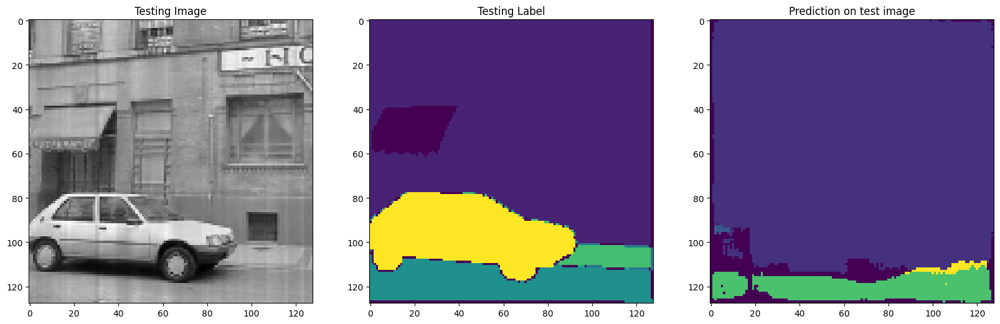

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 1 2 3 5 7]


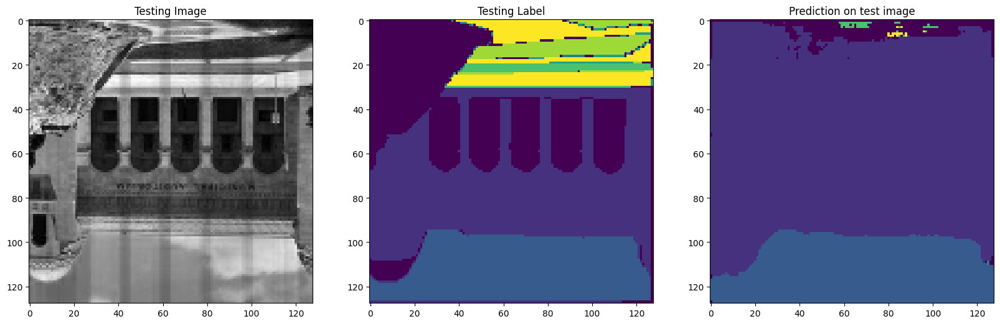

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 4]


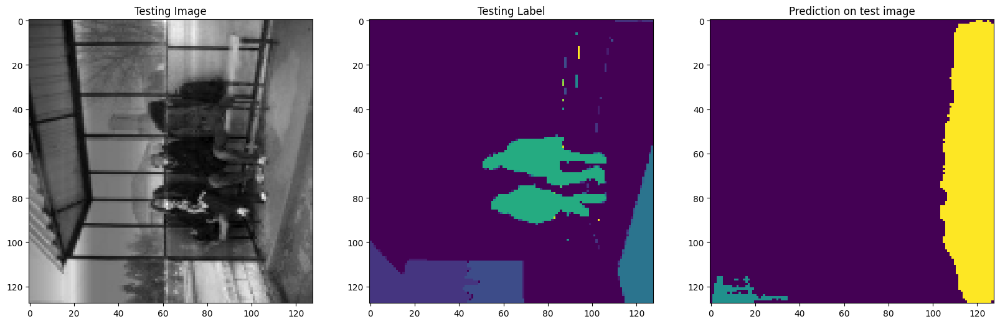

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  6  7  9 10 12]
Unique Classes in predicted taesting image  [0 2 3 9]


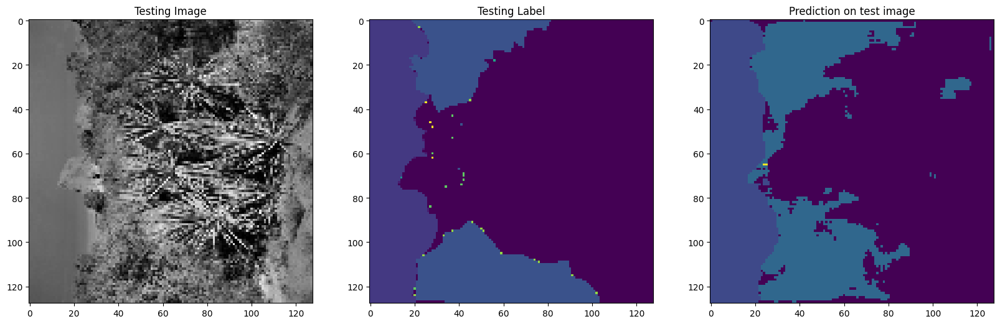

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11]
Unique Classes in predicted taesting image  [0 1 2 4 5]


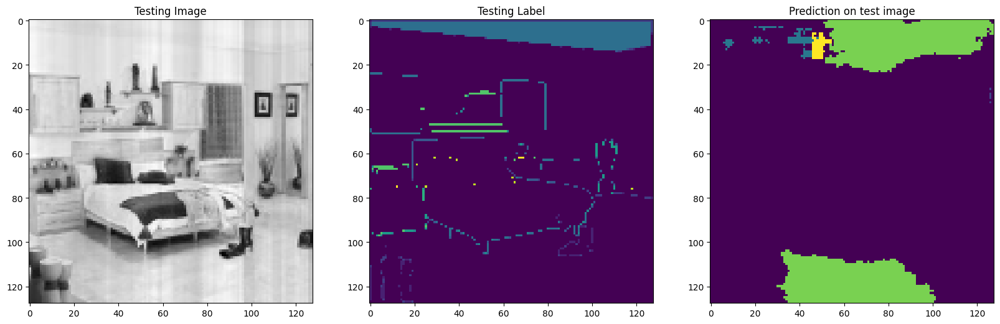

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8 11 12 13]
Unique Classes in predicted taesting image  [0 2 4]


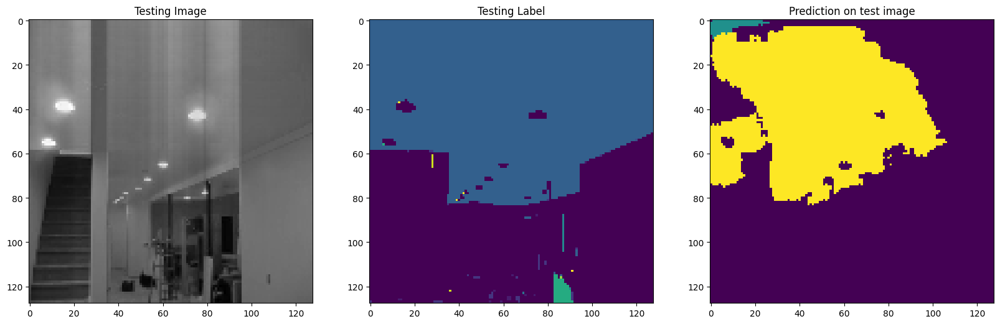

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 10 11 12 13]
Unique Classes in predicted taesting image  [0 6]


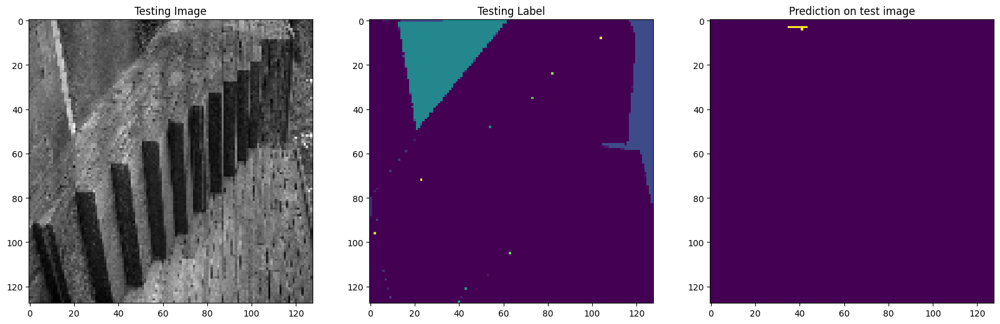

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 12 13]
Unique Classes in predicted taesting image  [0 3 6]


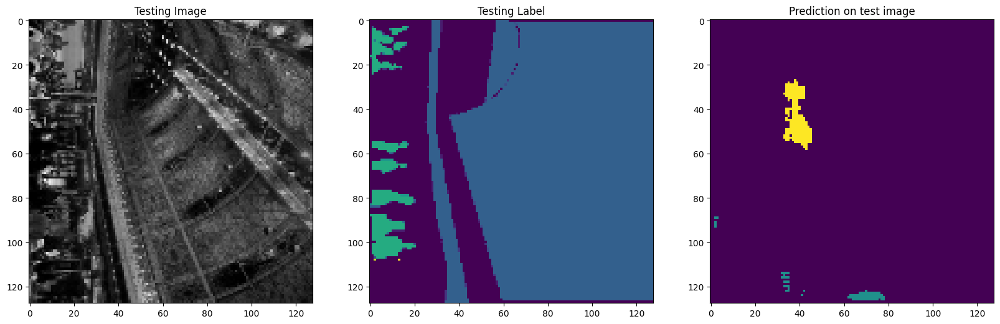

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 8]


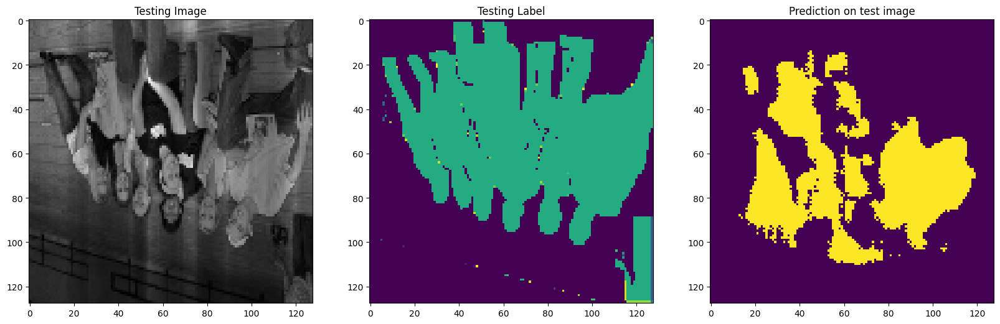

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 4]


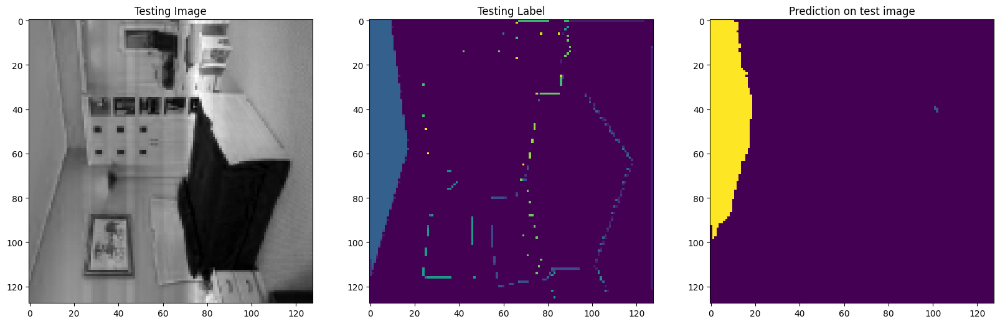

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 3]


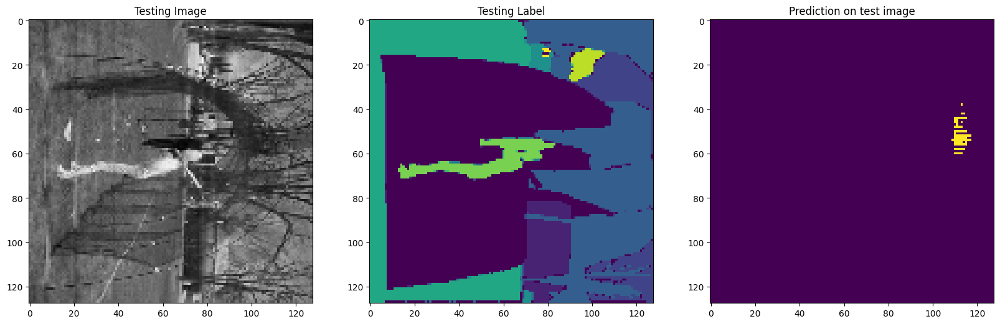

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  8 13]
Unique Classes in predicted taesting image  [0 4]


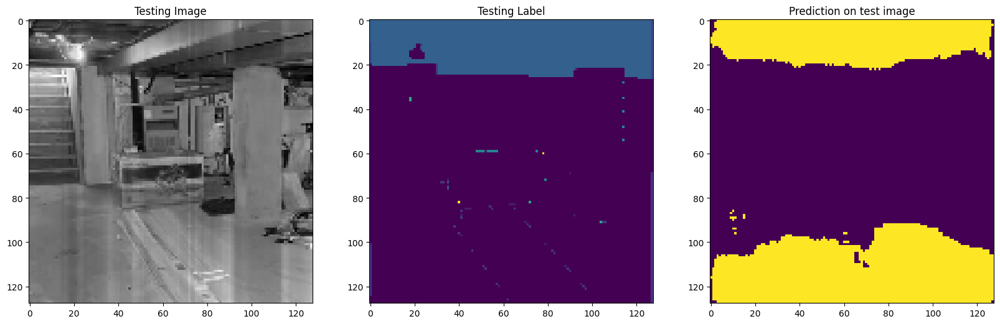

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2]
Unique Classes in predicted taesting image  [ 0  1  2  3  9 13]


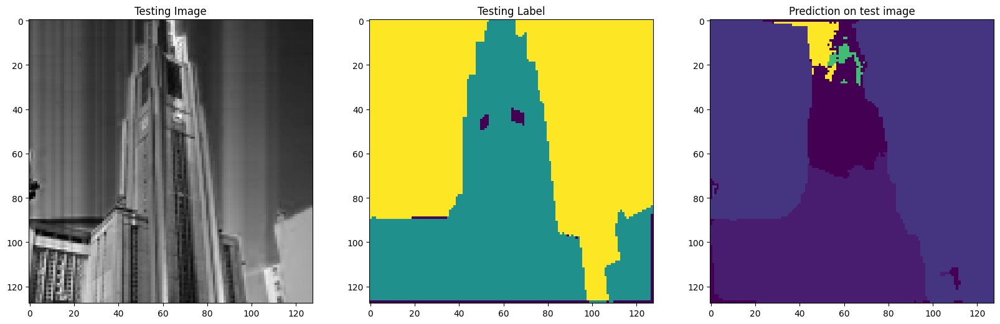

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11]
Unique Classes in predicted taesting image  [0 4]


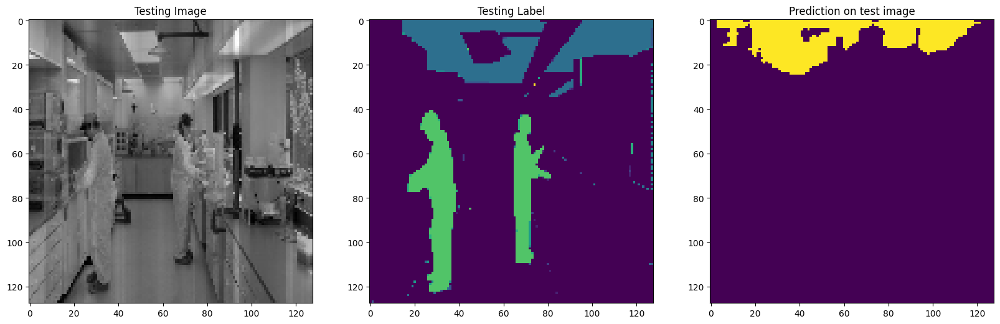

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 1 2 3 6]


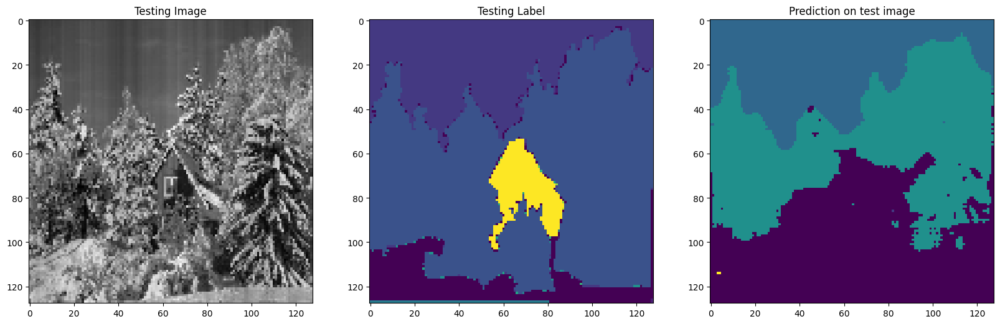

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2]
Unique Classes in predicted taesting image  [0 1 2 3]


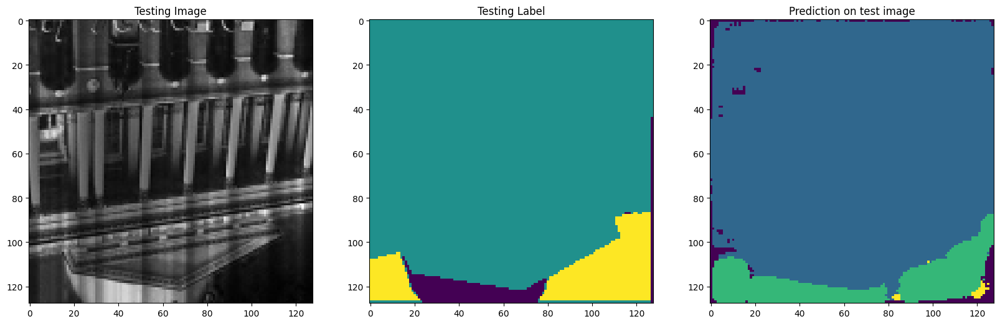

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 2 3 5]


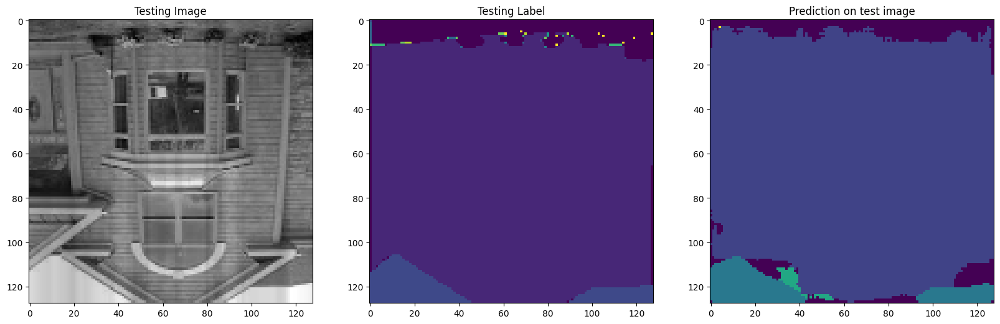

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  5  7 10 12 13]
Unique Classes in predicted taesting image  [ 0  2  6  9 11 13]


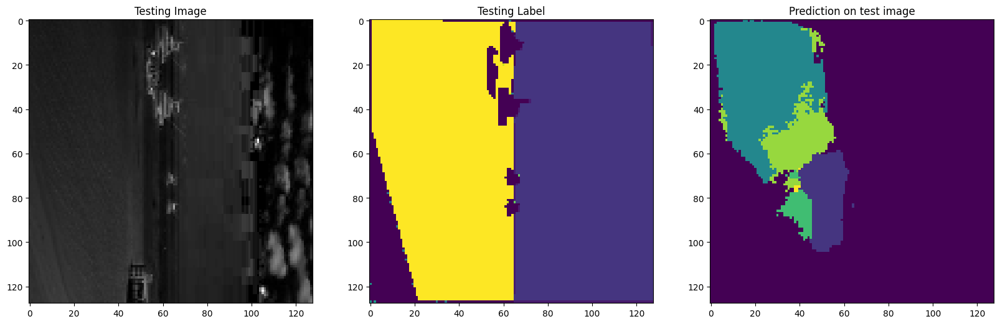

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  4  9 13]


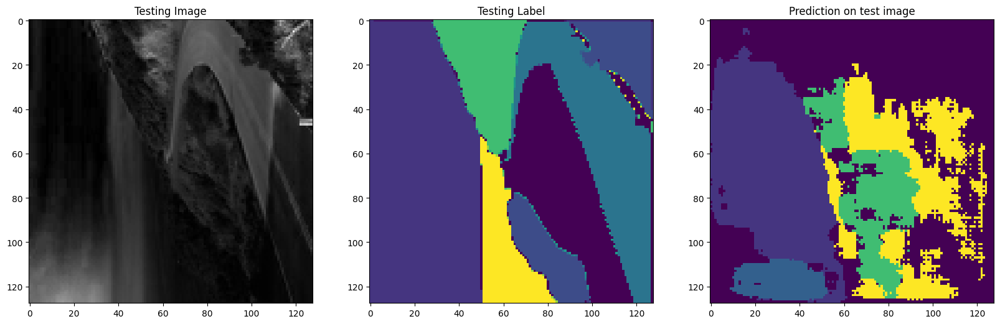

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 2 3 5]


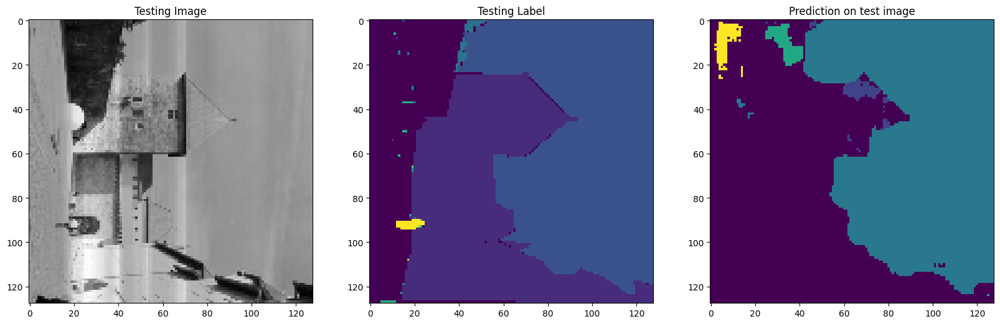

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 13]
Unique Classes in predicted taesting image  [ 0  3  6 11]


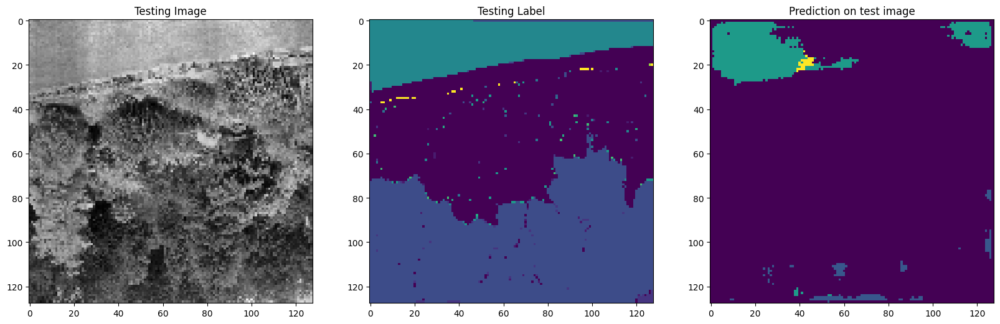

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


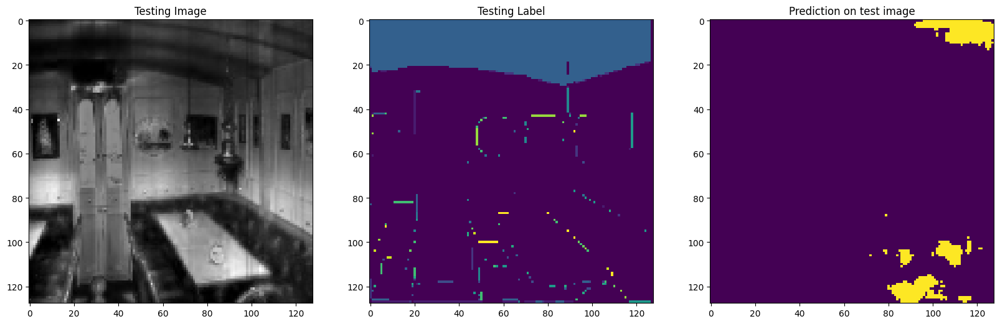

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1]
Unique Classes in predicted taesting image  [0 1 5]


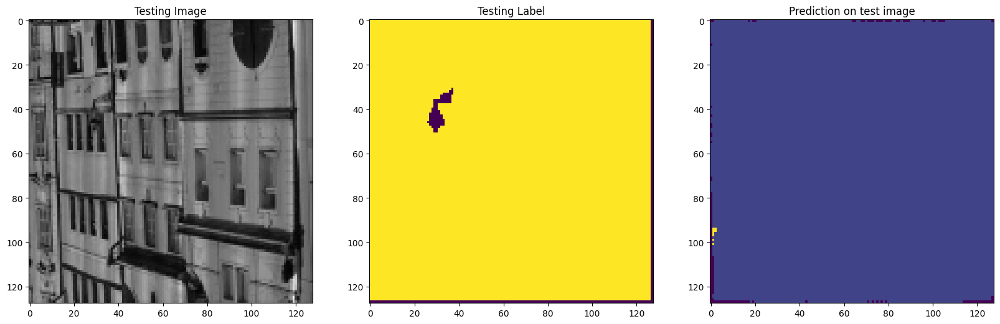

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 5]


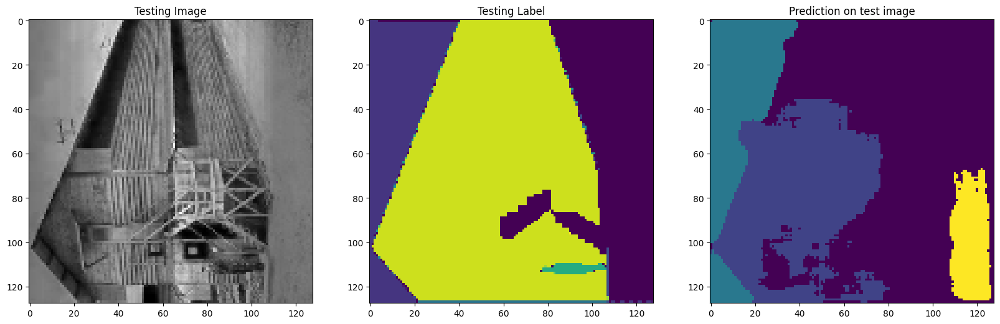

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11 12]
Unique Classes in predicted taesting image  [0 1 5 7]


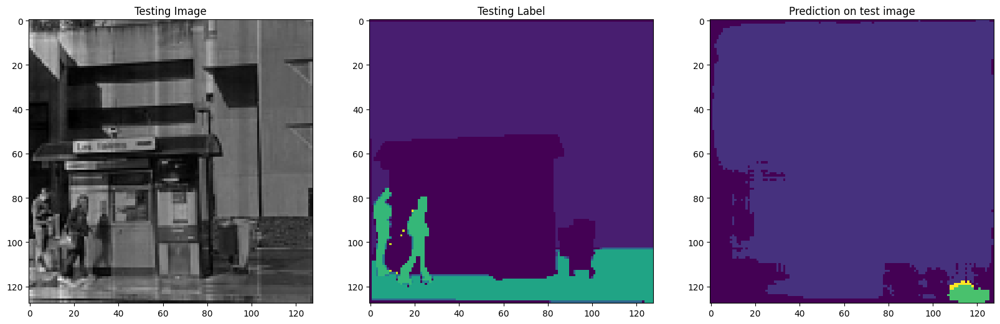

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 7]


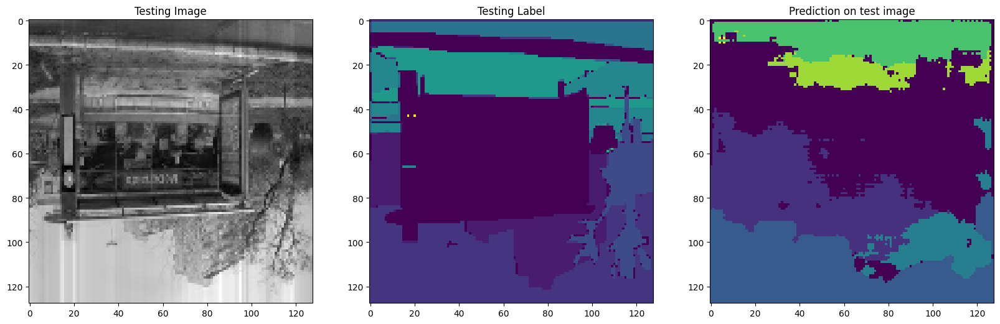

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


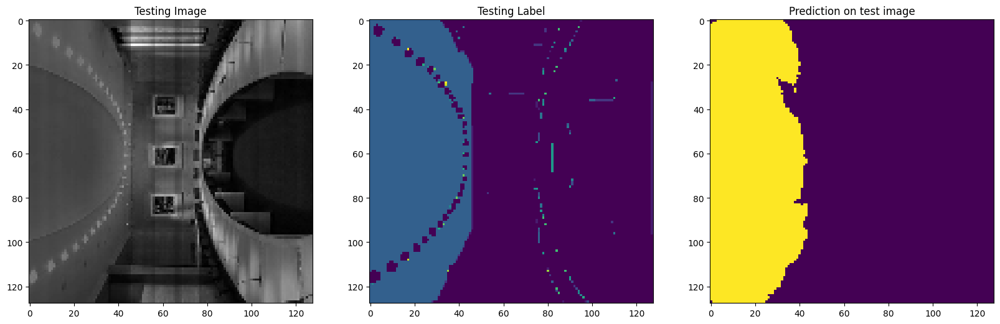

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 4]


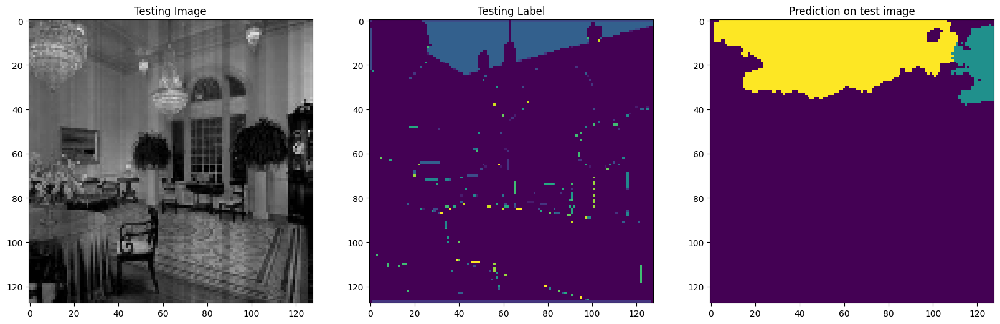

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 1 2 3]


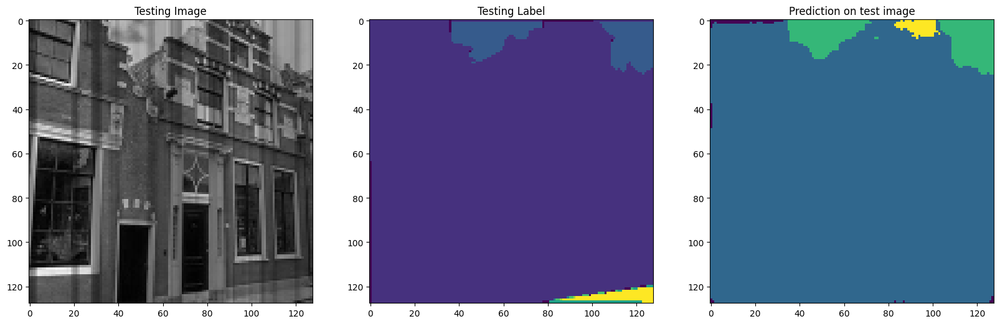

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  9 13]


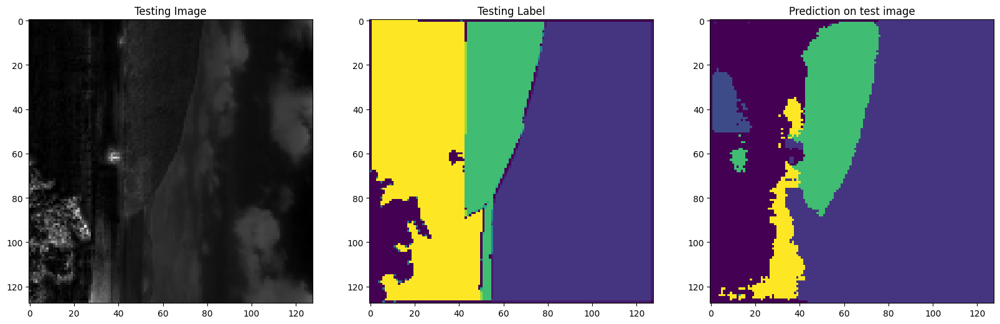

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 1 4]


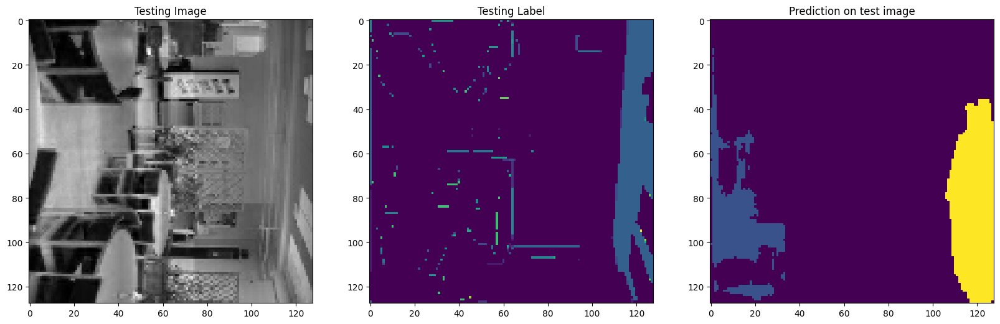

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 2 4]


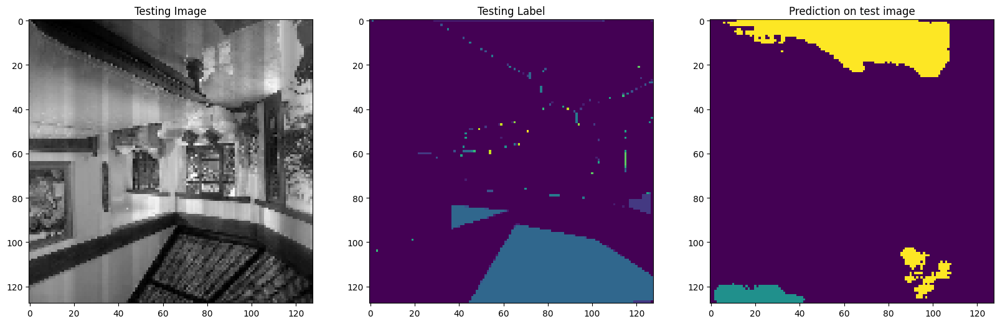

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 4]


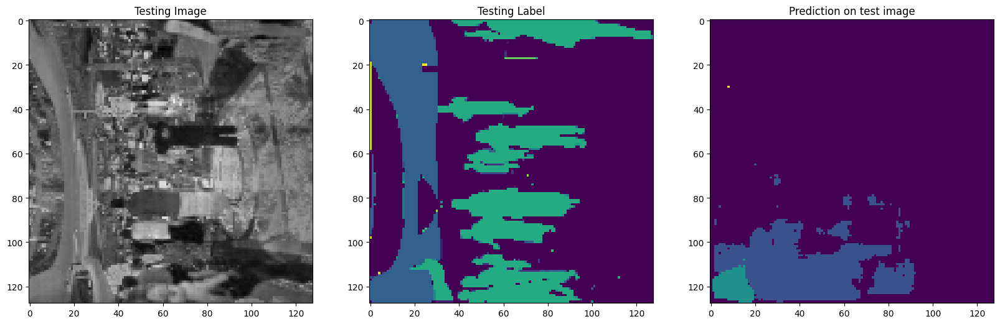

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 2 3 4 5 7]


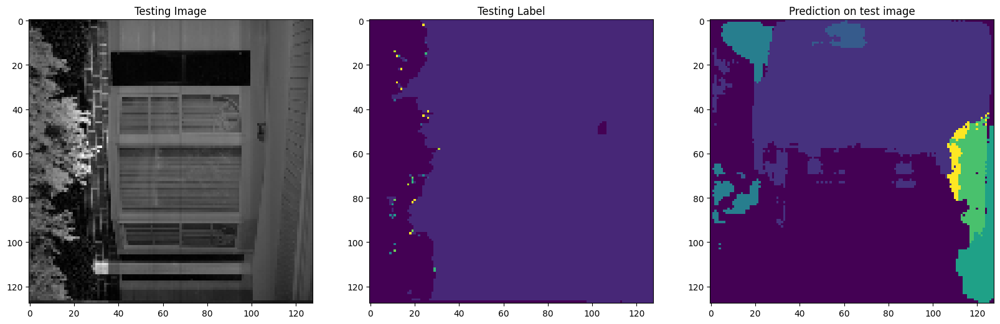

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 12]
Unique Classes in predicted taesting image  [0 1 2 5 6 7]


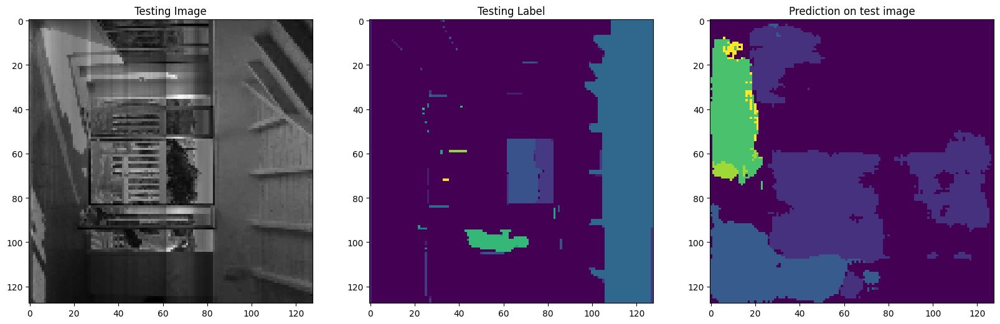

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 1 2 3 5]


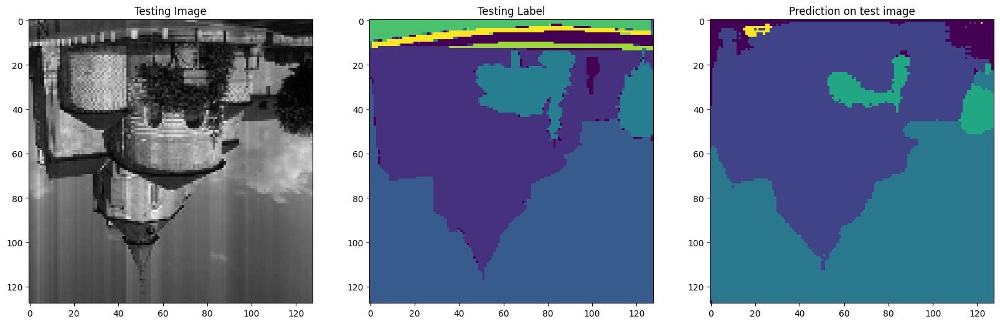

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  5  8  9 11 12 13]
Unique Classes in predicted taesting image  [ 0  2 13]


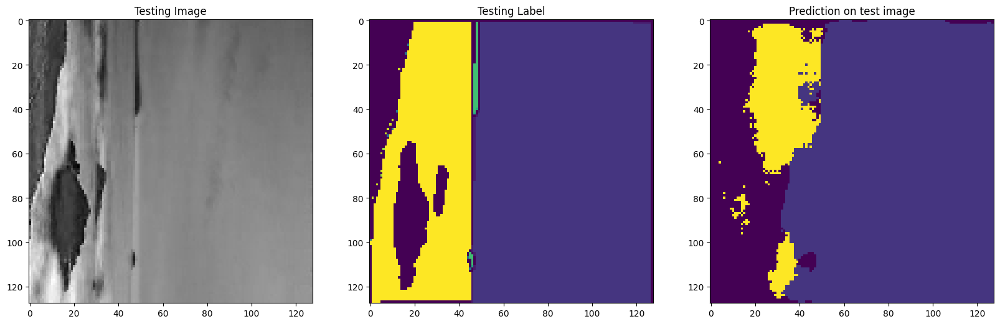

1/1 [==============================] - 0s 32ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 4]


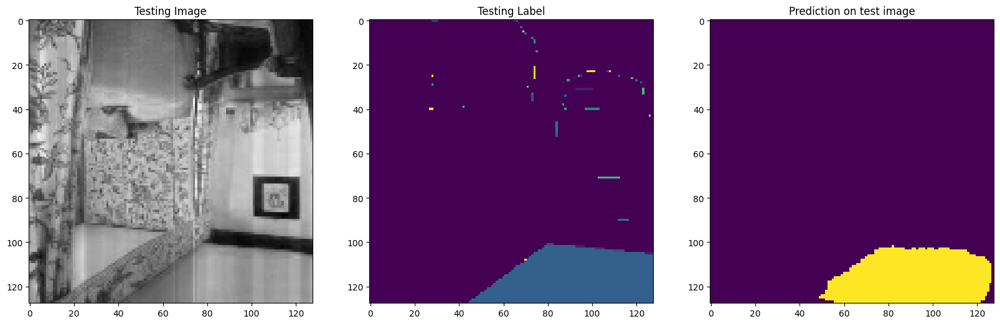

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11 13]
Unique Classes in predicted taesting image  [0]


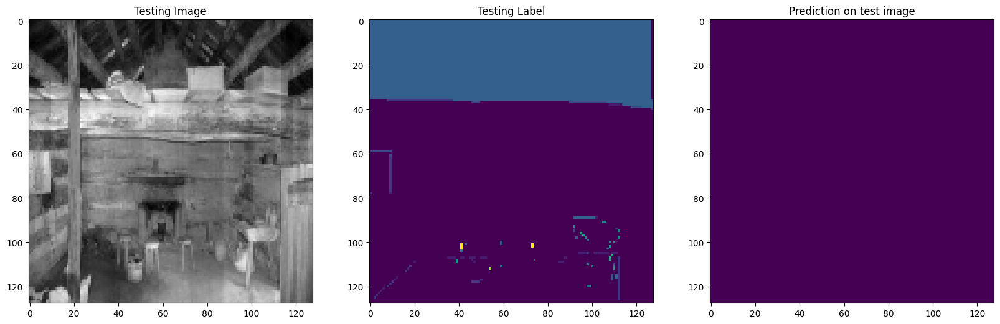

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 5]


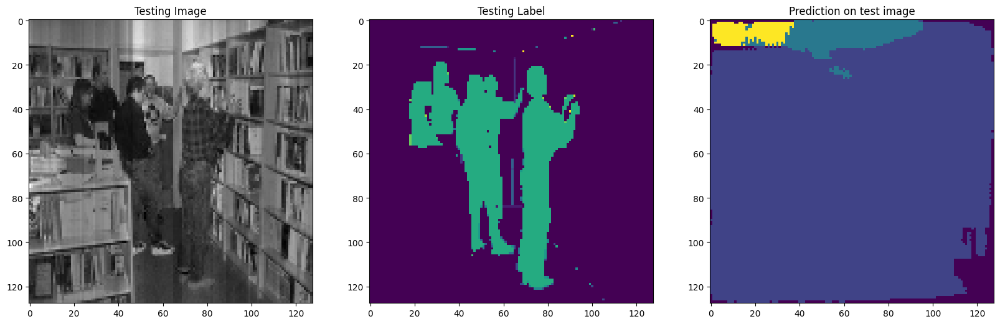

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 10 13]
Unique Classes in predicted taesting image  [0 1 2 3 4 6]


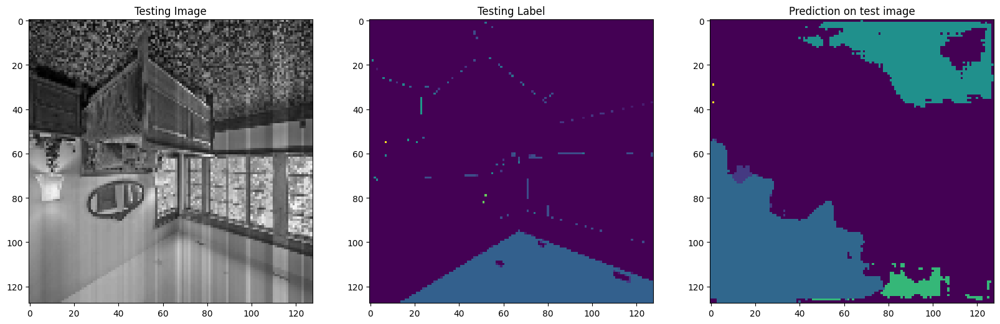

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12]
Unique Classes in predicted taesting image  [0 4]


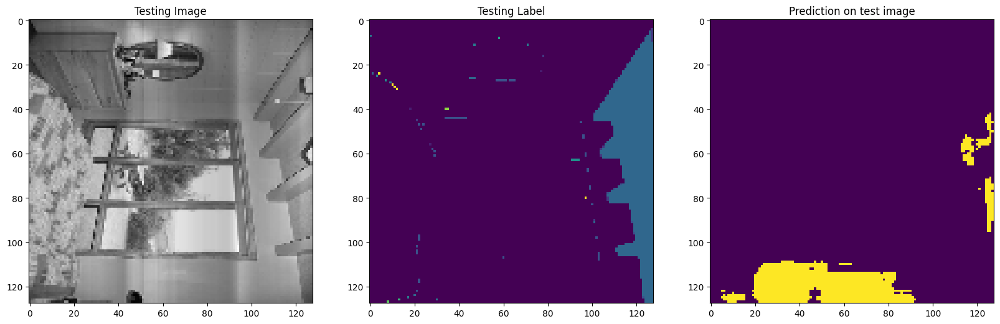

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 6]


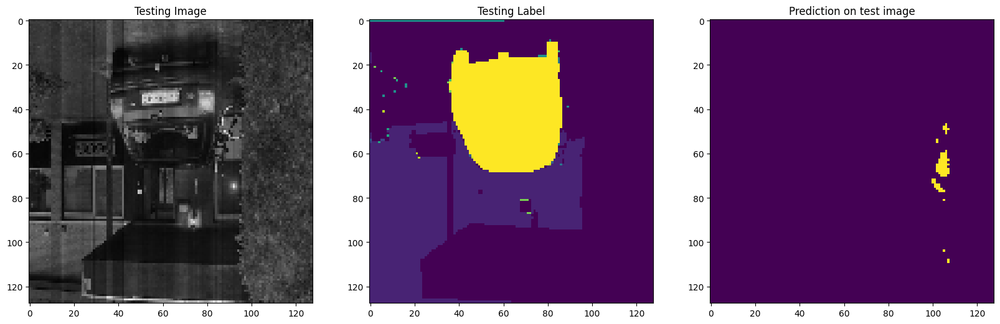

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 6 9]


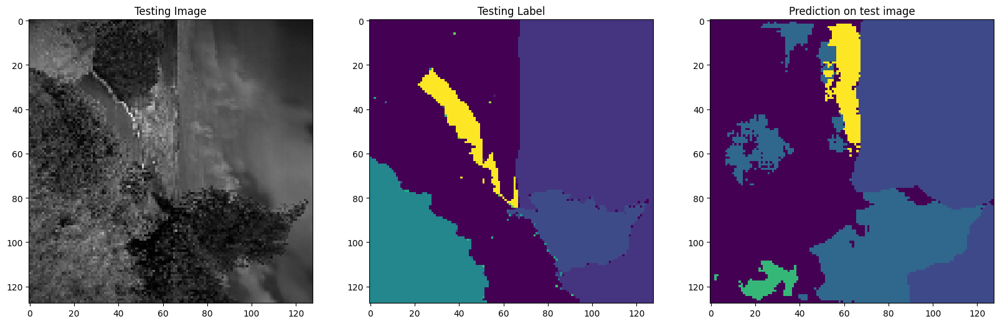

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 7]


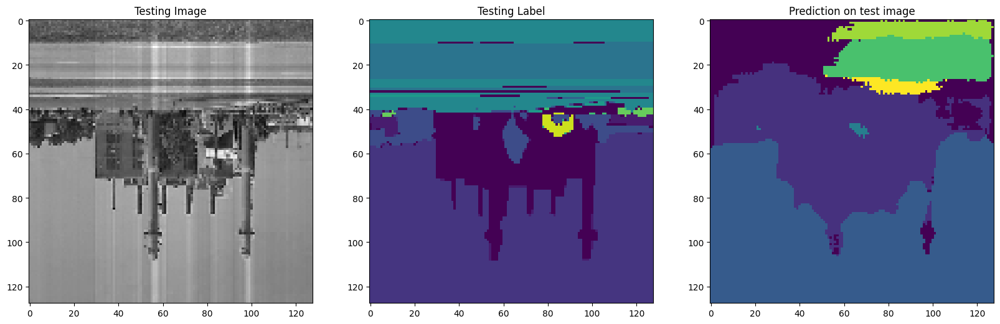

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 4]


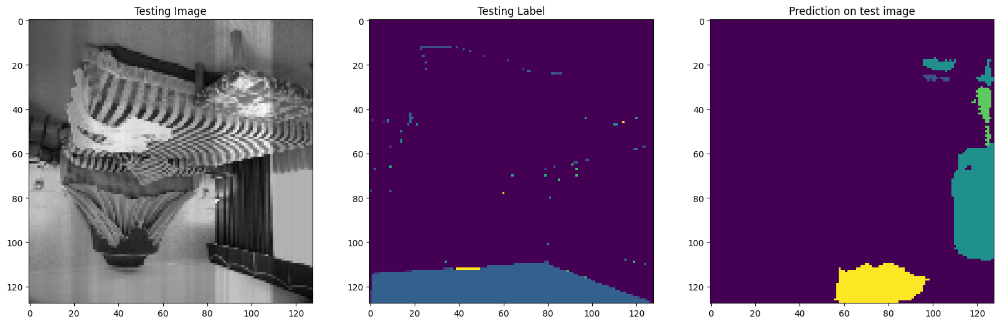

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 2 3 4]


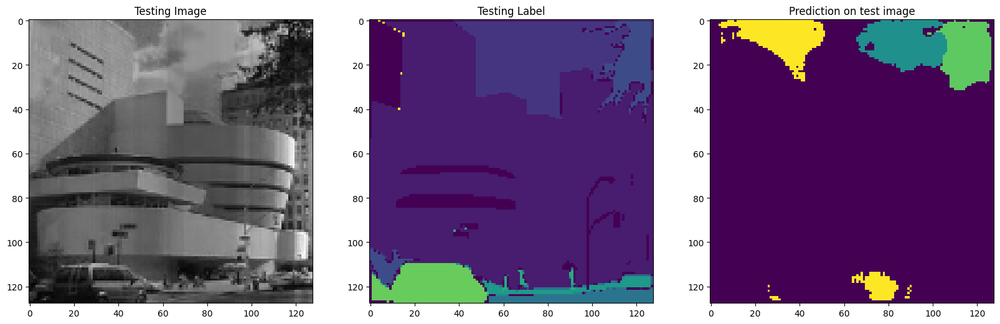

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11]
Unique Classes in predicted taesting image  [0 4 8]


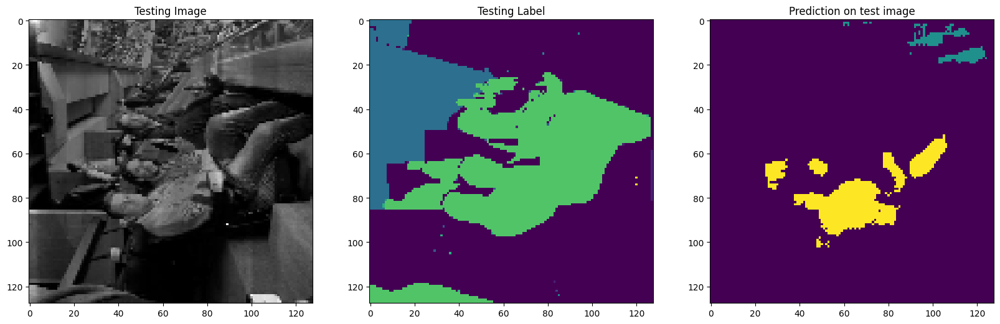

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 4]


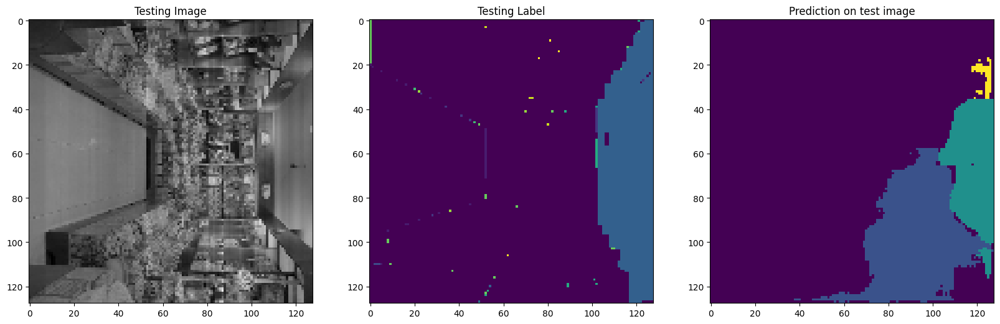

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 4]


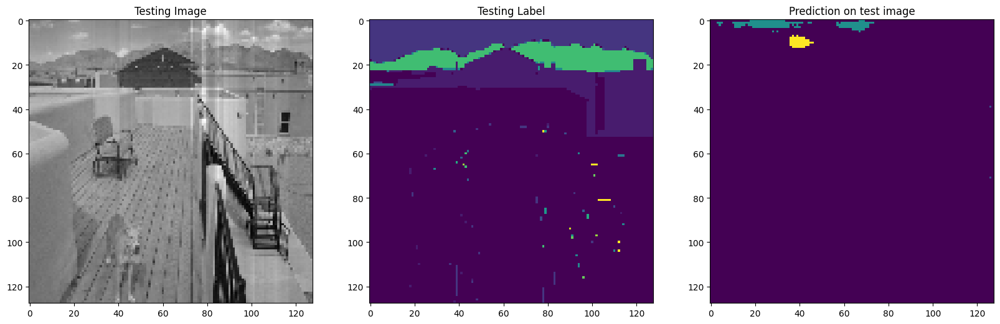

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8]
Unique Classes in predicted taesting image  [0 1 2]


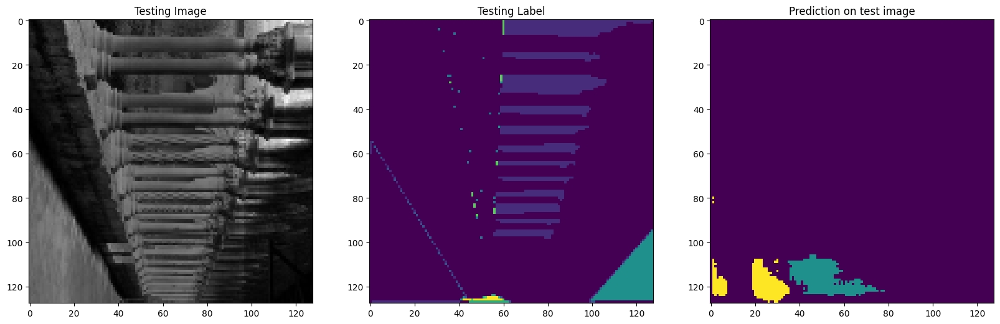

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [ 0  1  5  7 10]


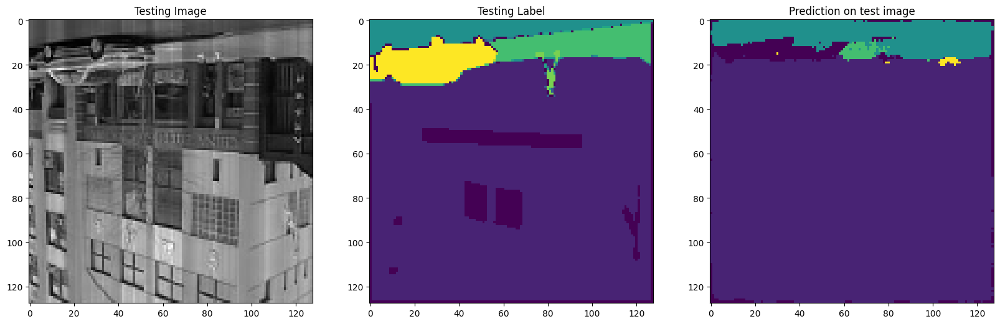

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 4]


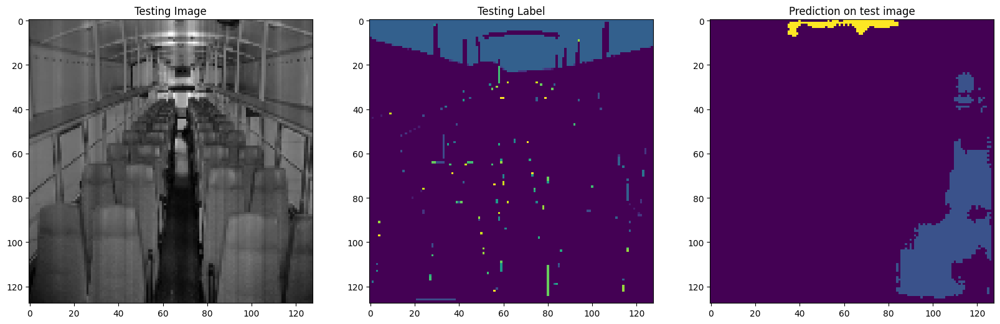

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7 12]
Unique Classes in predicted taesting image  [0 1 2 3 4]


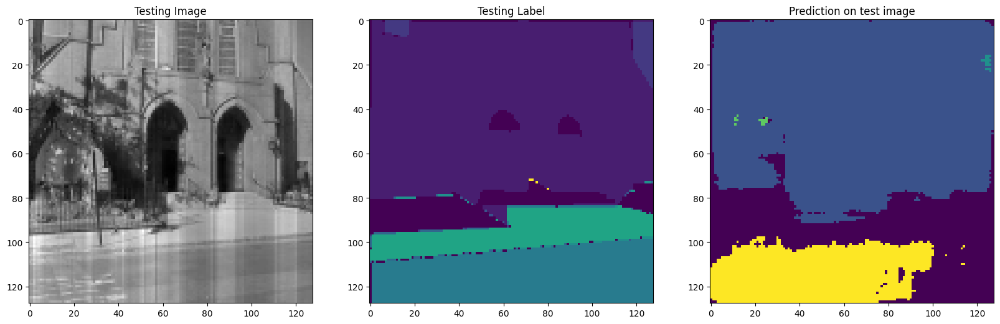

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 5]
Unique Classes in predicted taesting image  [ 0  1  5  7 10]


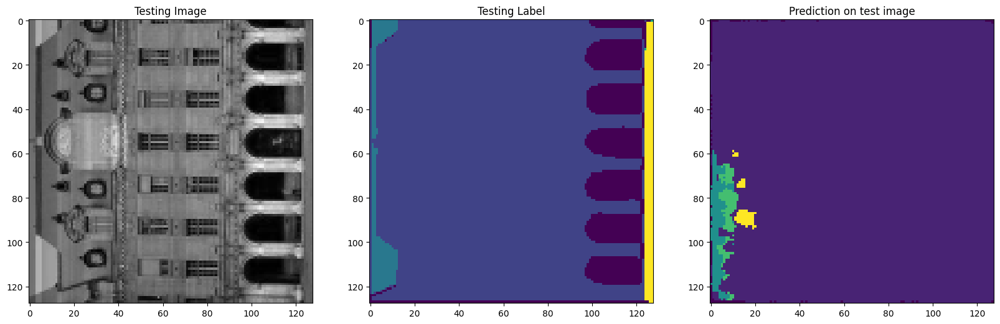

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6 12 13]
Unique Classes in predicted taesting image  [0 4]


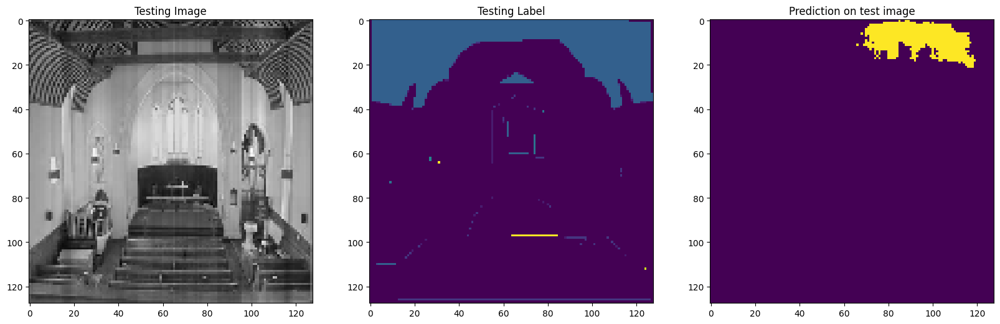

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 8]


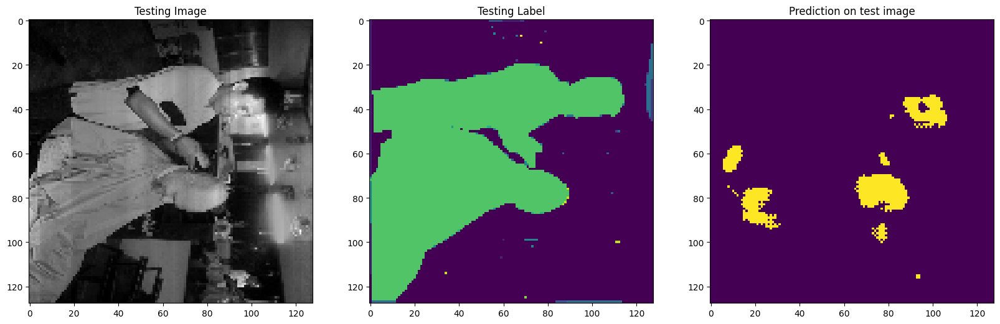

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12]
Unique Classes in predicted taesting image  [0 4]


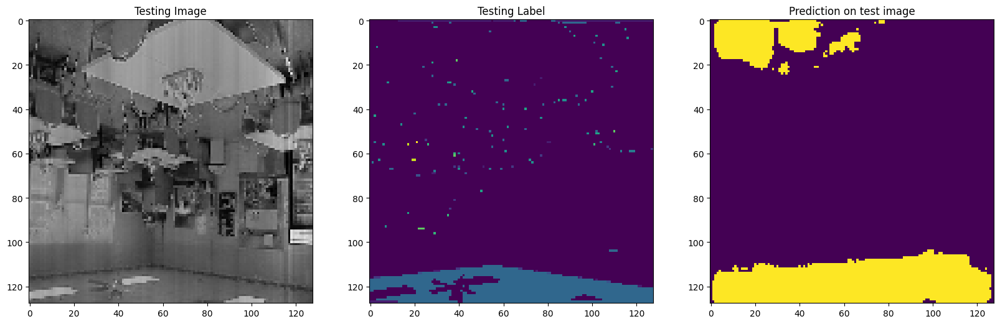

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2 13]
Unique Classes in predicted taesting image  [0 1]


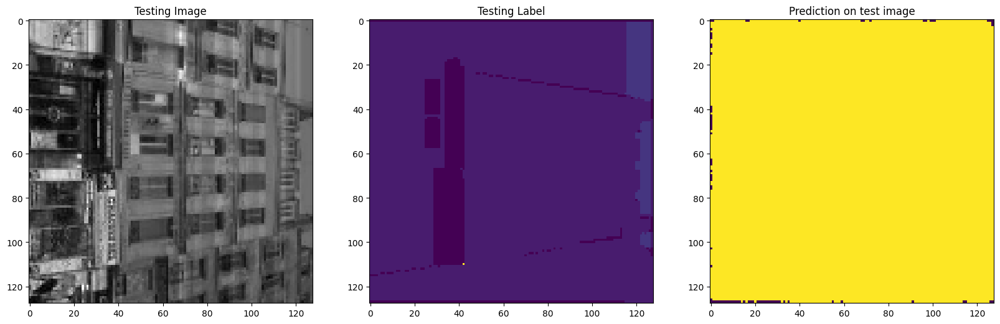

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  7  8  9 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  5  6  9 11]


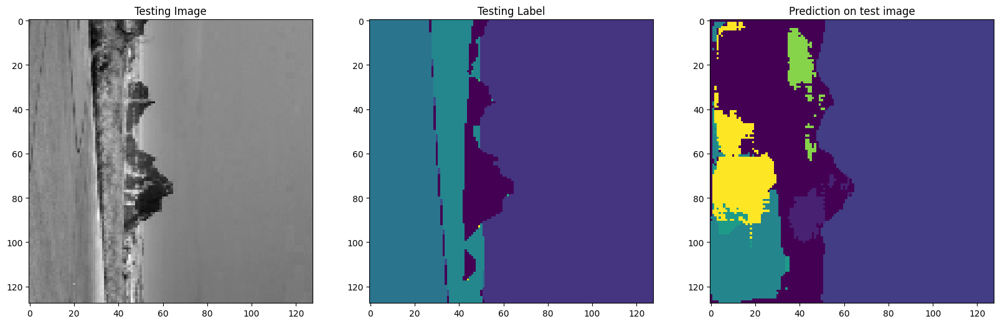

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2]


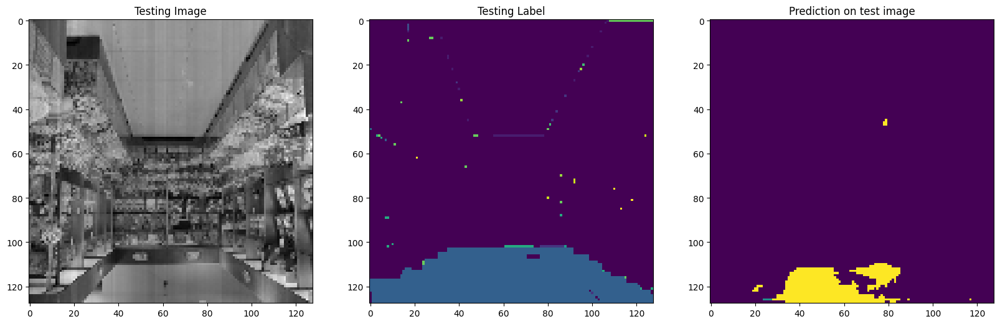

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 8]


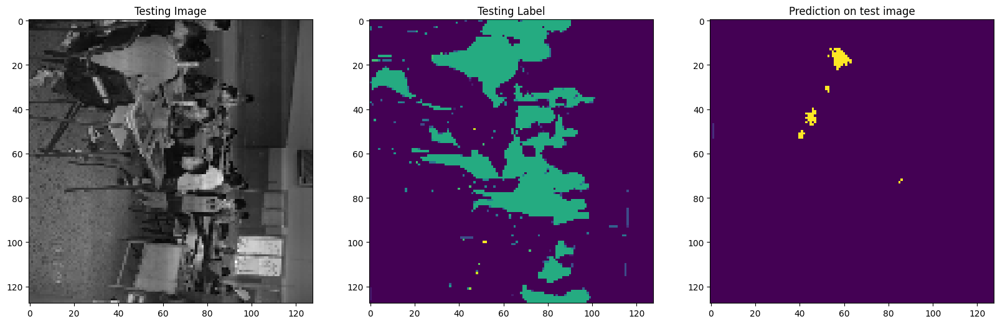

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 2 3 5 6]


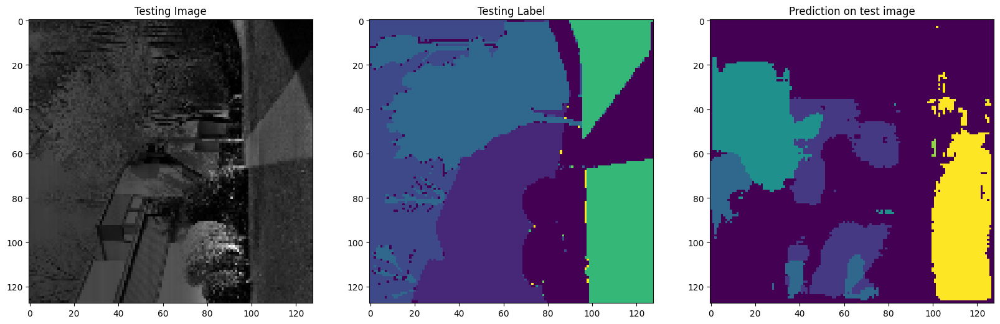

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  7  8 10]
Unique Classes in predicted taesting image  [0 1 4]


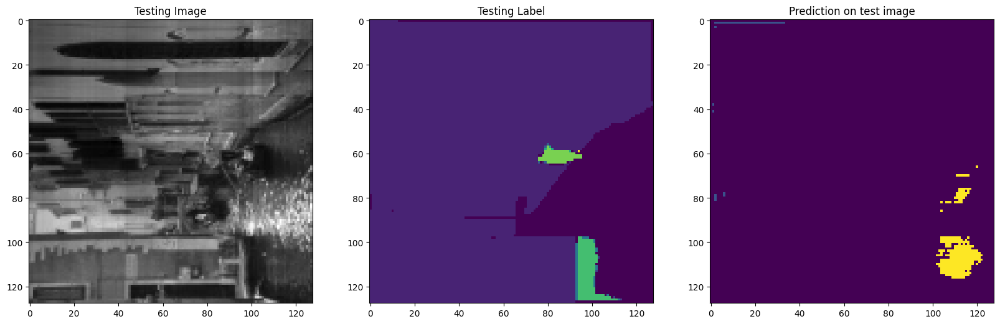

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [0 1 2 3 4]
Unique Classes in predicted taesting image  [0 1 2 3 9]


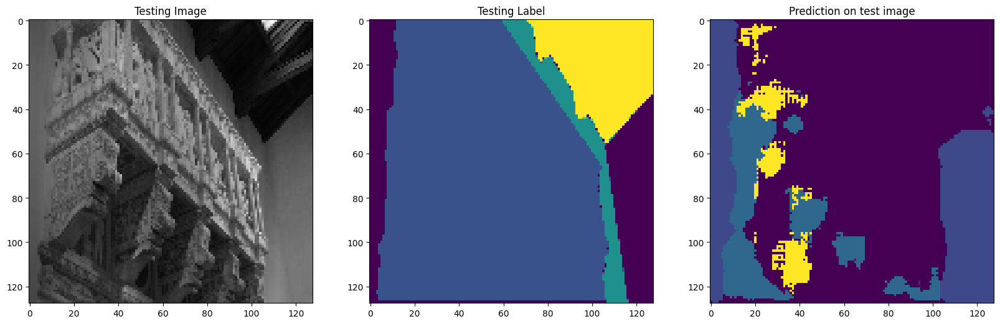

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 13]
Unique Classes in predicted taesting image  [0 4 5]


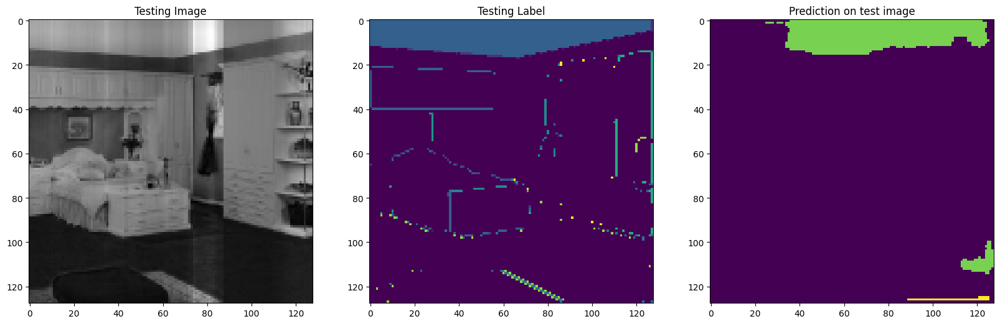

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


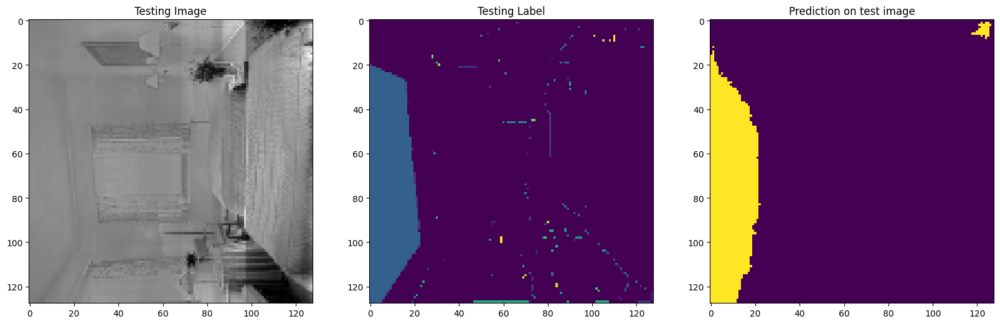

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3]


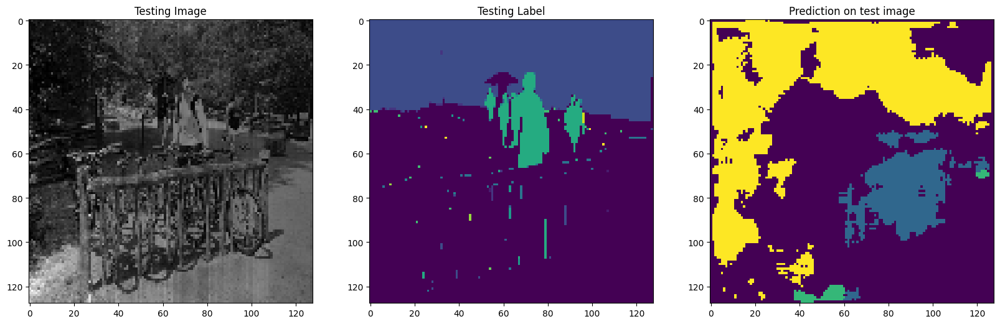

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 11 13]
Unique Classes in predicted taesting image  [ 0  2  9 13]


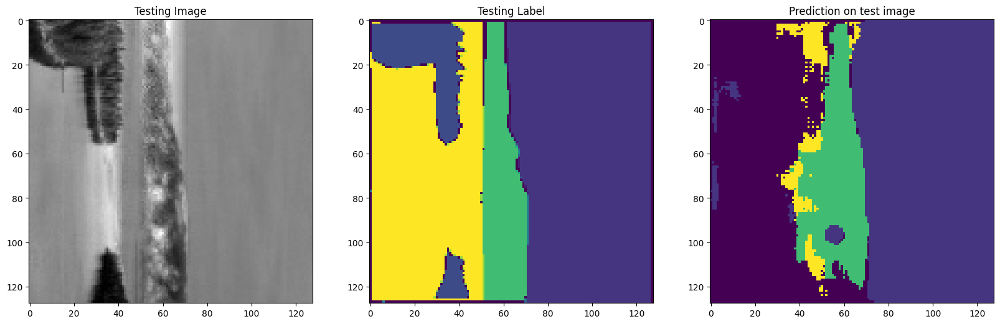

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 3]


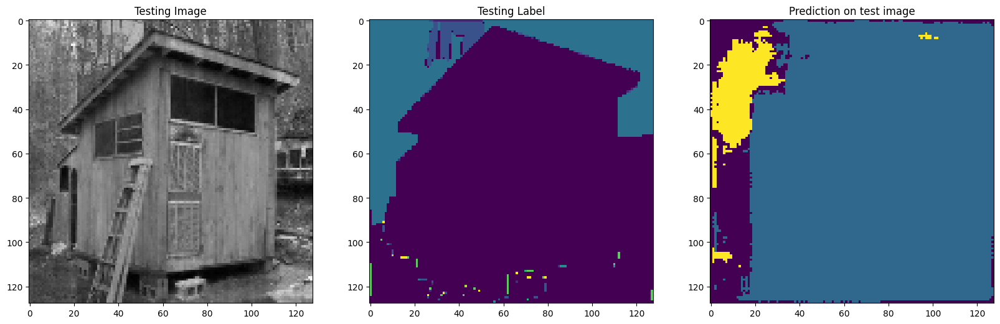

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 1 2]


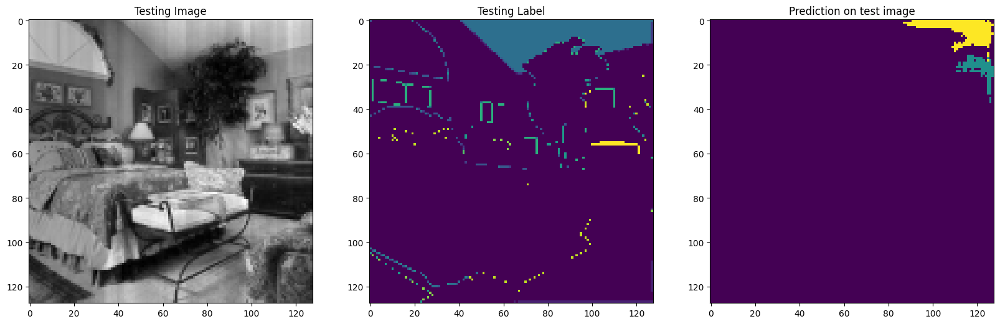

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 10 11]
Unique Classes in predicted taesting image  [0 1 2 3 6]


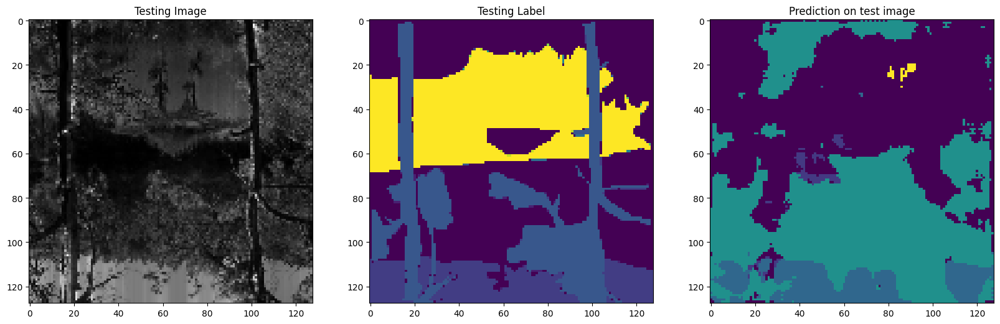

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3 4]
Unique Classes in predicted taesting image  [0 4]


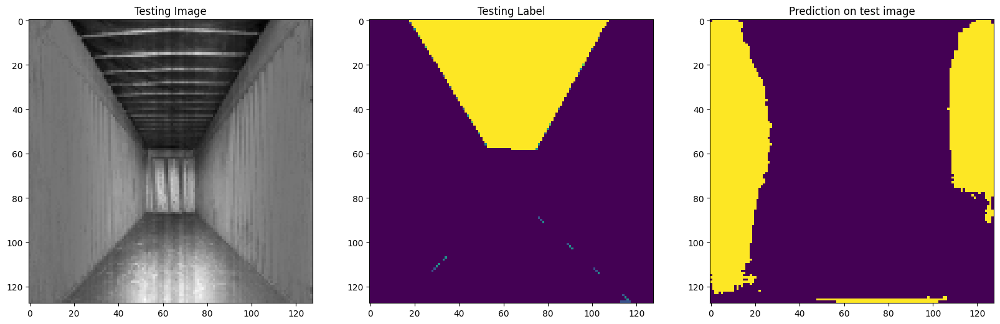

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  5  8  9 11 12 13]
Unique Classes in predicted taesting image  [ 0  2  3  9 13]


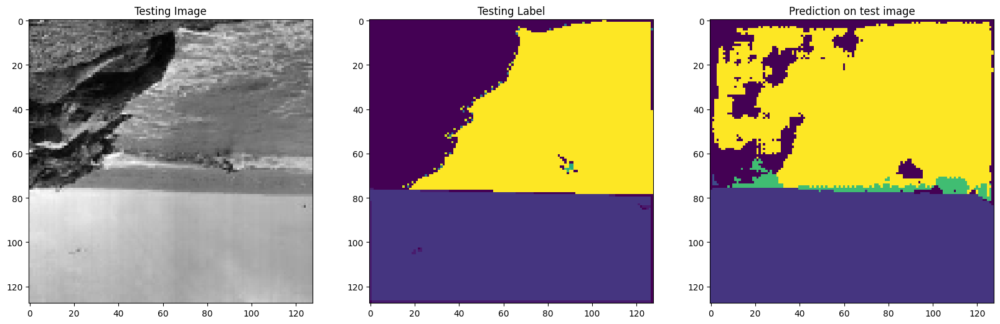

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [0 1 2 3]
Unique Classes in predicted taesting image  [ 0  1  2  9 13]


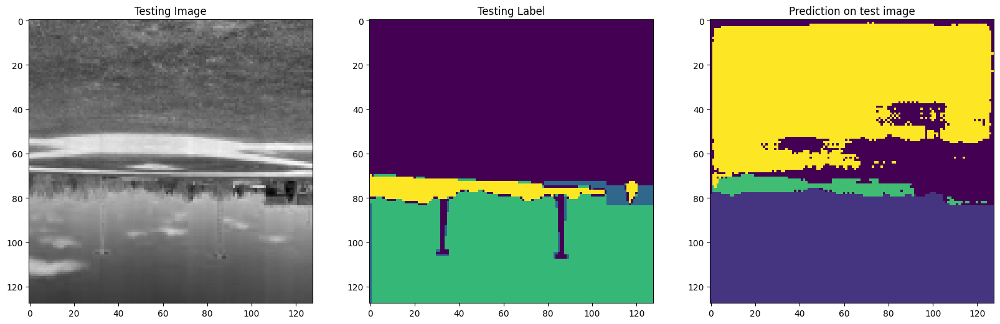

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10]
Unique Classes in predicted taesting image  [0 4]


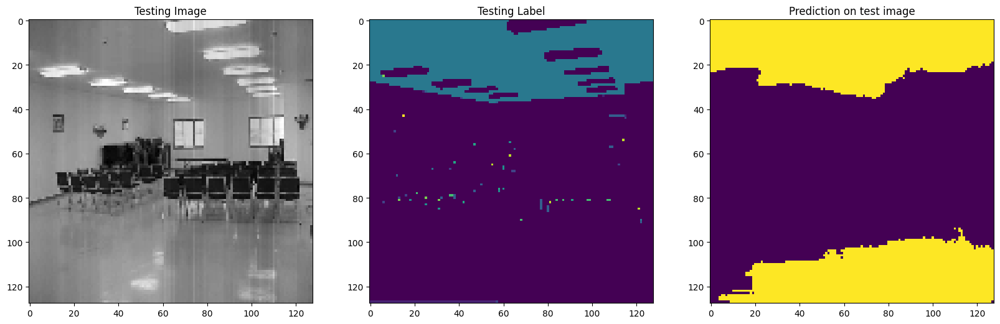

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  5  7 13]
Unique Classes in predicted taesting image  [ 0  2  3  9 13]


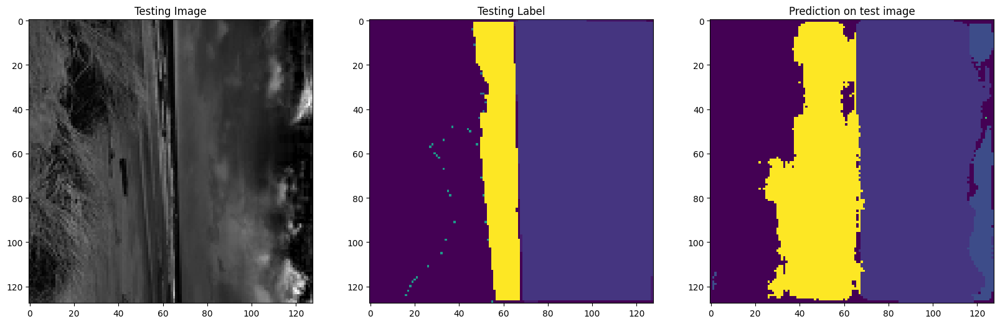

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4 10]
Unique Classes in predicted taesting image  [ 0  2  4  5 11]


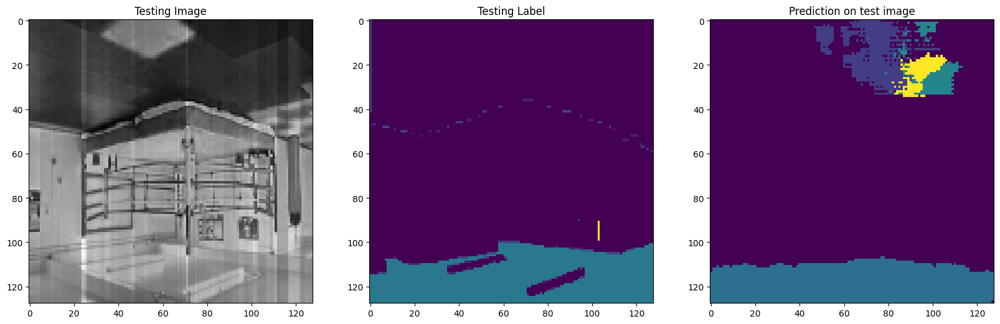

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 8]


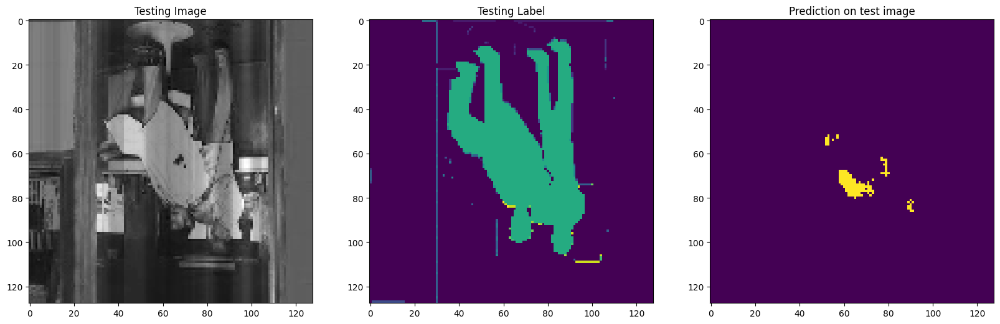

1/1 [==============================] - 0s 20ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  9 11 13]
Unique Classes in predicted taesting image  [0 1 2]


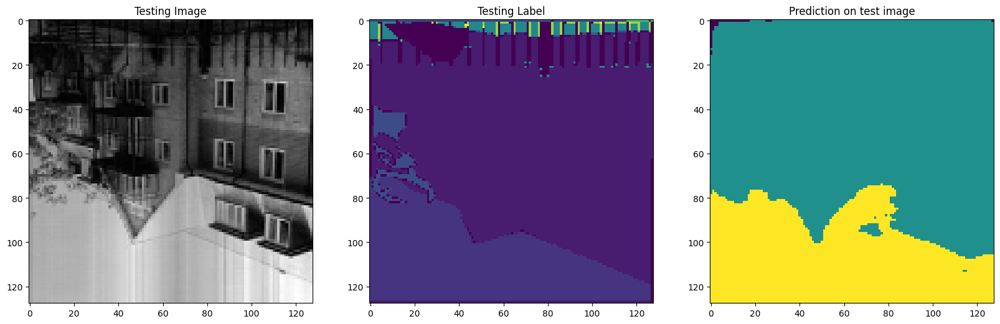

1/1 [==============================] - 0s 19ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 13]
Unique Classes in predicted taesting image  [0 4]


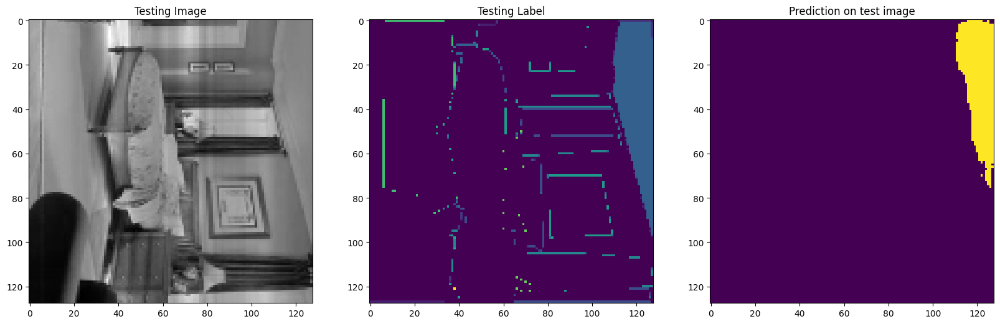

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [ 0  2  3  4  5  6  7  8  9 12]
Unique Classes in predicted taesting image  [0 3 8]


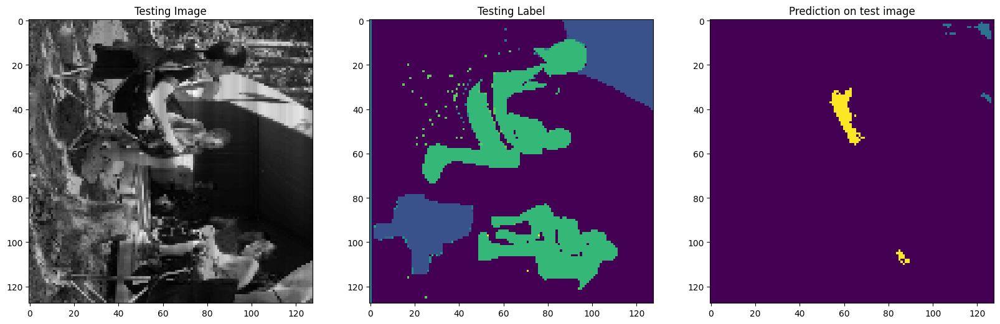

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


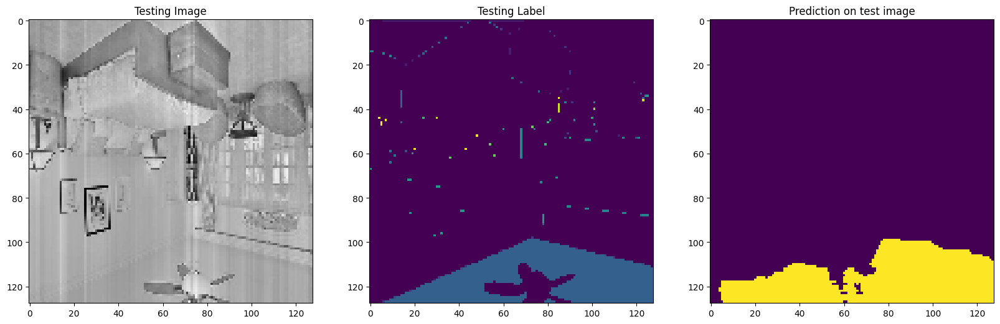

1/1 [==============================] - 0s 22ms/step
Unique Classes in Testing Image  [0 1 2 7]
Unique Classes in predicted taesting image  [0 1 2 3]


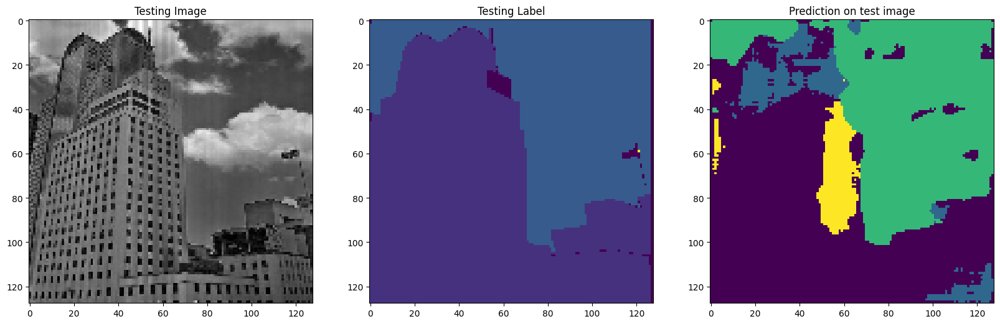

1/1 [==============================] - 0s 21ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 4]


In [ ]:
#Generating masks for all the test data set
for test_img_number in range(X_test.shape[0]):
  test_img = X_test[test_img_number]
  ground_truth=y_test[test_img_number]
  test_img_norm=test_img[:,:,0][:,:,None]
  test_img_input=np.expand_dims(test_img_norm, 0)
  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  print("Unique Classes in Testing Image ",np.unique(ground_truth[:,:,0]))
  print("Unique Classes in predicted taesting image ",np.unique(predicted_img))
    
  plt.figure(figsize=(20, 20))
  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_img[:,:,0], cmap='gray')
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(ground_truth[:,:,0])
  
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(predicted_img, )
    
 
  plt.show()




In [123]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 22ms/step


[ 0  1  2  3  4 10]
[ 0  1  2  3  4  5  6  7  8 10 11 12 13]


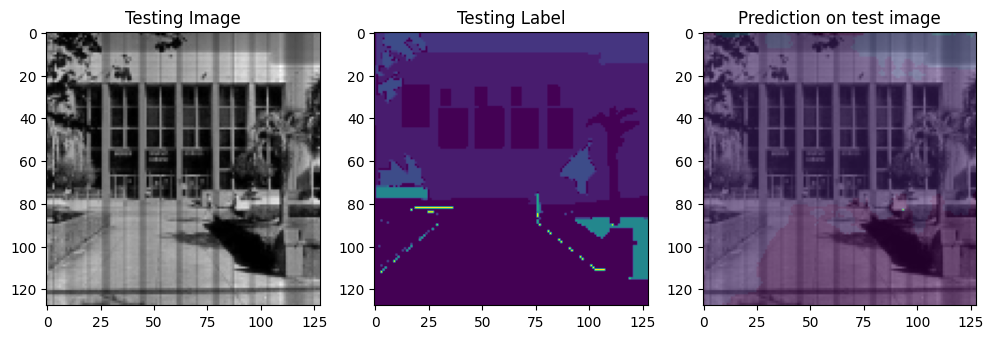

In [124]:
print(np.unique(predicted_img))
print(np.unique(ground_truth[:,:,0]))
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], )
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.imshow(predicted_img,alpha=0.5)
plt.show()


In [125]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 22ms/step


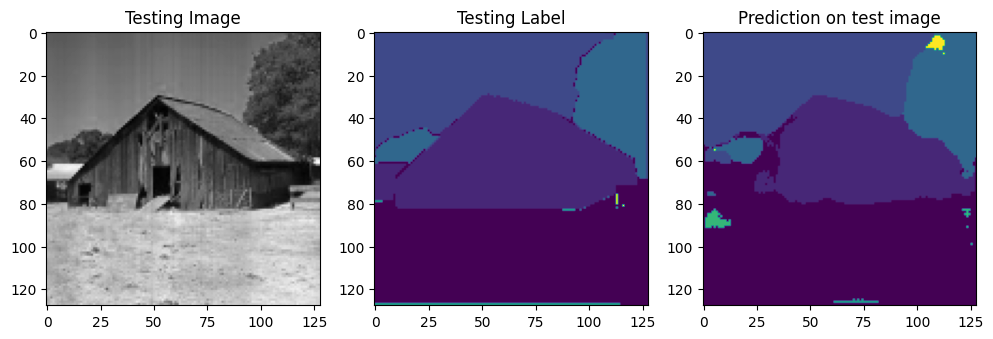

In [126]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img)
plt.show()


In [131]:
#Predict on a few images
#model = get_model()
#model.load_weights('/kaggle/input/unet/tensorflow2/unet1/1/UNET_test_acc0.94_val0.73.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]



1/1 [==============================] - 0s 21ms/step


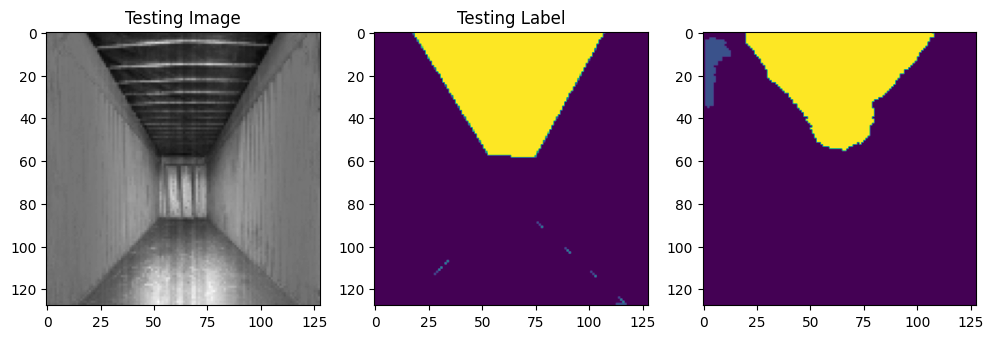

In [132]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')

plt.imshow(ground_truth[:,:,0])
plt.subplot(233)

plt.imshow(predicted_img)
plt.show()


In [133]:
before = [ 0 , 2,  3 , 5 , 6 , 7 ,10, 12 ,13, 17, 21, 22, 26 ,27]
after = [ 0 , 1 , 2 , 3,  4 , 5 , 6,  7 , 8,  9, 10, 11, 12, 13]

In [134]:
class_encoding = {}
for i in range(len(after)):
    class_encoding[after[i]] = before[i]

In [135]:
class_encoding={0: 0,
 1: 2,
 2: 3,
 3: 5,
 4: 6,
 5: 7,
 6: 10,
 7: 12,
 8: 13,
 9: 17,
 10: 21,
 11: 22,
 12: 26,
 13: 27}

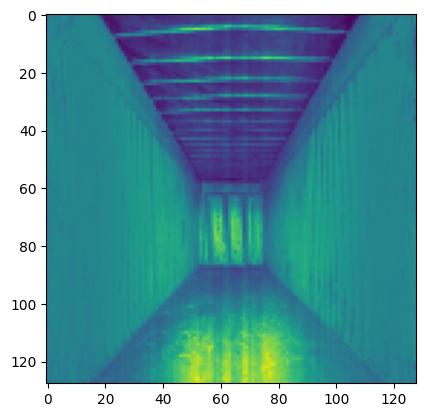

In [136]:
plt.imshow(test_img)

In [137]:
class_label_en = {
0: 'sky',
 1: 'tree',
 2: 'ceiling',
 3: 'building',
 4: 'person',
 5: 'road;route',
 6: 'car',
 7: 'sidewalk',
 8: 'grass',
 9: 'mountain',
 10: 'water',
 11: 'house',
 12: 'sea'}

class_colors_en = {
    0: (6, 230, 230),          
   1: (4, 200, 3),    
    2: (20, 120, 80),    
   3: (80, 120, 120),      
    4: (150, 5, 61),              
    5: (140, 140, 140),     
    6: (0, 102, 200), 
    7: (235, 255, 7),             
    8: (4, 250, 7),            
    9: (143, 255, 140),  
    10: (61, 230, 250),
    11:(255, 9, 224),
    12:(9, 7, 230) 
   
}      

In [138]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors_en.values())
for class_label, color in class_colors_en.items():
    rgb_image[predicted_img == class_label] = color
    

In [139]:
rgb_image.shape

(128, 128, 3)

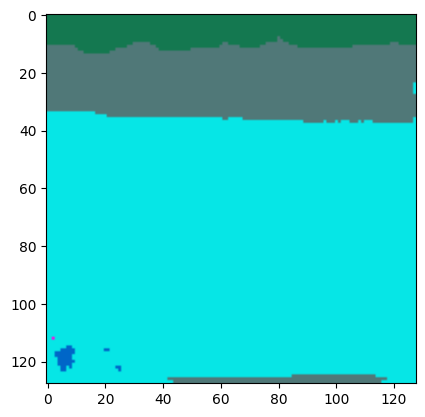

In [165]:
plt.imshow(rgb_image)

In [142]:
np.unique(rgb_image)

array([  3,   4,   5,   6,  61, 150, 200, 230])

In [141]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [140]:
image_name = u'/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00006512.jpg'
image = load_images_bw(image_name)
train_images = np.array(image[:,:,0])
train_images = np.expand_dims(train_images, axis=2)
train_images = normalize(train_images,axis=1)#

In [143]:
test_img_norm=train_images
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 22ms/step


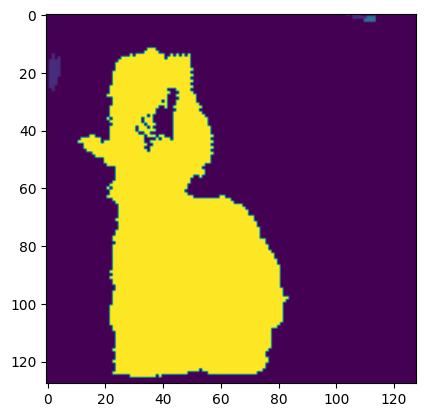

In [144]:
plt.imshow(predicted_img)

In [145]:
np.unique(predicted_img)

array([0, 1, 3, 8])

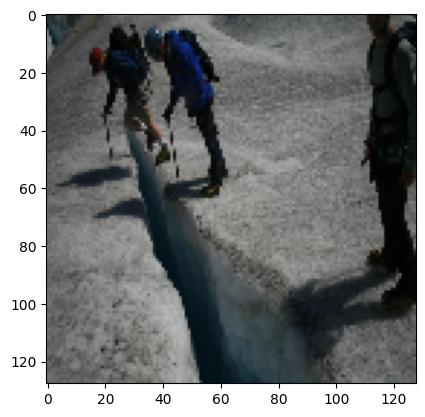

In [146]:
plt.imshow(image)

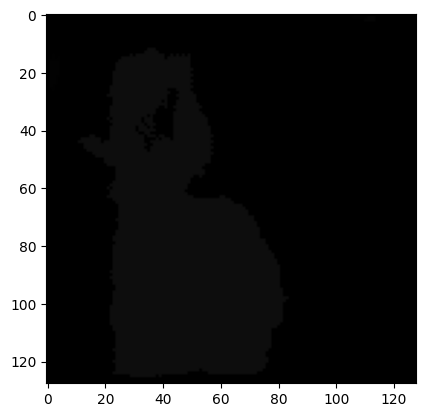

In [147]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)

for encoded, before_encode in class_encoding.items():
    rgb_image[predicted_img == encoded] = before_encode
plt.imshow(rgb_image,cmap='jet')

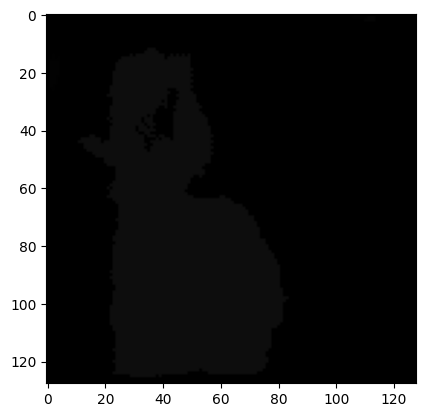

In [148]:
plt.imshow(rgb_image)

In [149]:
rgb_image.shape

(128, 128, 3)

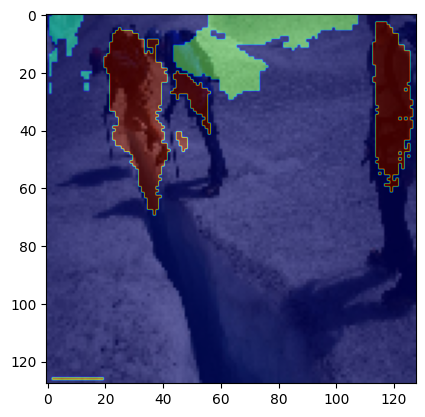

In [179]:
# Apply colors to the mask based on class labels
output = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors.values())
for class_label, color in class_colors.items():
    output[predicted_img == class_label] = color  
plt.imshow(image,cmap='gray') 
plt.imshow(predicted_img, alpha=0.5,cmap='jet') # interpolation='none'


# Save the image shown in subplot (222)
plt.savefig('prediction_with_mask.png')  # Save the figure as an image file

-++
